In [2]:
## fonctions de base

#packages

using Pkg
#Pkg.add("LinearAlgebra")
#Pkg.add("LinearSolve")
#Pkg.add("Plots")
#Pkg.add("Printf")
#Pkg.add("LaTeXStrings")
#Pkg.add("Interpolations")
#Pkg.add("NPZ")


using LinearAlgebra
using LinearSolve
using Plots
using LaTeXStrings
using Interpolations
using NPZ
using Printf

function fact(n)
    n == 0 ? 1 : n * fact(n - 1)
end

#-------------------------------------------------------------------------------------
#	dressing of function f (given as array f_discr, occupation ratio given as n_discr)
#-------------------------------------------------------------------------------------


function f_varphimat(lam_discr,gb)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)
    return varphimat
end 

function f_dlam(lam_discr)
    L = size(lam_discr)[1]
    dlam = zeros(L)
    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    return dlam
end
    
function dress(gb, lam_discr, n_discr, f_discr)
    
    
    varphimat = f_varphimat(lam_discr,gb)
    dlam = f_dlam(lam_discr)
    
    A = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    A\f_discr
end

#-------------------------------------------------------------------------------------
#	to evaluate charge density associated with function f
#-------------------------------------------------------------------------------------

function charge_density(gb, lam_discr, n_discr, f_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    A = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    0.5/pi * dot(dlam , Diagonal(n_discr) * (A \ f_discr) )
end

#-------------------------------------------------------------------------------------
#	to evaluate charge density associated with function f
#-------------------------------------------------------------------------------------

function charge_density(gb, lam_discr, n_discr, f_discr , beta )
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    A = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)

    dressed = (A \ f_discr)
    mesure = zeros(L)
    for (i, val) in enumerate(beta)
        mesure += lam_discr.^(i-1).*val/fact(i-1) 
    end

   mesure_time_dressed =  mesure .* dressed 
    
    0.5/pi * dot(dlam , Diagonal(n_discr) * mesure_time_dressed  )
end

#-------------------------------------------------------------------------
#	solve Yang-Yang equation
#-------------------------------------------------------------------------

function fun1(z)
    if z>0
        return log(1. +exp(-z))
    else
        return log(1. +exp(z)) - z
    end
end

function fun2(z)
    if z<0
        return 1. /(1. +exp(z))
    else
        return exp(-z)/(1. +exp(-z))
    end
end

function yangyang(gb, beta, lam_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])

    bare_E = 0.5 * beta[3] * lam_discr.^2 + beta[2] * lam_discr + beta[1] * ones(L)
    eps = copy(bare_E)
    n = fun2.(eps)

    #iterative solution
    diff = 1.
    while diff>1e-12
        old_n = copy(n)
        eps = bare_E - 0.5/pi * varphimat*Diagonal( fun1.(eps) )*dlam
        n = fun2.(eps)
        diff = norm(n-old_n)
    end
    eps = bare_E - 0.5/pi * varphimat*Diagonal( fun1.(eps) )*dlam
    n = fun2.(eps)
    return n
end

#-------------------------------------------------------------------------------------
#	compute effective velocity
#-------------------------------------------------------------------------------------

function veff(gb, lam_discr, n_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    dresser = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    onedr = dresser\ones(L)
    iddr = dresser\copy(lam_discr)
    iddr ./ onedr
end



veff (generic function with 1 method)

In [3]:
function DeltaMat(theta_discr , gbar )
    L = size(theta_discr)[1]
    varphi(theta) = 2*gbar/( gbar^2 + theta^2 )
    varphimat = zeros(L,L)
    

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( theta_discr[i]-theta_discr[j] )
            varphimat[j,i] = varphi( theta_discr[i]-theta_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)
    return varphimat
end 

function Delta(theta_discr)
    L = size(theta_discr)[1]
    dtheta = zeros(L)
        
    for i = 2:L-1
        dtheta[i] = 0.5*(theta_discr[i+1]-theta_discr[i-1])
    end
    dtheta[1] = 0.5*(theta_discr[3]-theta_discr[1])
    dtheta[L] = 0.5*(theta_discr[L]-theta_discr[L-2])
    
    return dtheta
end 

function montrer_les_rho(theta_discr, nu_discr)
    L = length(theta_discr)
    
    varphimat = DeltaMat(theta_discr , gbar)
    dtheta = Delta(theta_discr)
    
    # Plot nu_tilde
    p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="f", legend=:topright)
    plot!(p , theta_discr , nu_discr, label="\$\\tilde{\\nu}\$")
    # Méthode 0
    rho_s_0 = 0.5 / pi * dress(gbar , theta_discr, nu_discr, ones(L))
    rho_0 = nu_discr .* rho_s_0
    
    # Méthode 1
    Mat_F_1 = I - (1 / (2 * pi)) * Diagonal(dtheta) * Diagonal(nu_discr) * varphimat
    B = (1 / (2 * pi)) * nu_discr
    rho_1 = Mat_F_1 \ B
    rho_s_1 = rho_1 ./ nu_discr

    # Méthode 2
    Mat_F_2 = I - 0.5 / pi * varphimat * Diagonal(nu_discr) * Diagonal(dtheta)
    B = (1 / (2 * pi)) * ones(L)
    rho_s_2 = Mat_F_2 \ B
    rho_2 = nu_discr .* rho_s_2
    
    # Plot résultats de la méthode 0
    plot!(p, theta_discr, rho_s_0, label="Meth 0 : \$\\tilde{\\rho_s}= \\frac{1}{2\\pi}\\\$")
    plot!(p, theta_discr, rho_0, label="Meth 0 : \$\\tilde{\\rho} = \\tilde{\\nu} * \\tilde{\\rho_s}\$")
    
    # Plot résultats de la méthode 1
    plot!(p, theta_discr, rho_1, label="Meth 1 : \$\\tilde{\\rho}= \\frac{\\tilde{\\nu}}{2\\pi} ( 1 + \\tilde{\\Delta} * \\tilde{\\rho}) \$")
    plot!(p, theta_discr, rho_s_1, label="Meth 1 : \$\\tilde{\\rho}_s  = \\frac{\\tilde{\\rho}}{\\tilde{\\nu}}  \$")
    
    # Plot résultats de la méthode 2
    plot!(p, theta_discr, rho_s_2, label="Meth 2 : \$\\tilde{\\rho_s}= \\frac{1}{2\\pi}\$")
    plot!(p, theta_discr, rho_2, label="Meth 2 : \$\\tilde{\\rho} = \\tilde{\\nu} * \\tilde{\\rho_s}\$")

    display(p)
    
    #p1 = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="\$\\Delta\$", legend=:topright)

    # Plot des différences entre les résultats des deux méthodes
    #plot(p1,theta_discr, rho_s_1 - rho_s_2, label="\$ \\Delta \\tilde{\\rho_s}\$")
    #plot(p1,theta_discr, rho_1 - rho_2, label="\$\\Delta \\tilde{\\rho}\$")

    # Légendes et labels
    #display(p1)
end

#-------------------------------------------------------------------------------------
#	theta start
#-------------------------------------------------------------------------------------

using Roots
function find_nu_theta_star_discr( theta_discr , theta_star  , nu_discr )
    return ifelse.(theta_discr .> theta_star, 0, nu_discr)
end 

function find_theta_star(theta_discr, nu_discr ,  gbar)
    
    # Définition de la fonction f_veff_star_theta_star
    f_veff_star_theta_star = theta_star -> linear_interpolation(theta_discr, veff( gbar, theta_discr, find_nu_theta_star_discr(theta_discr, theta_star, nu_discr)))(theta_star)
    
    return fzero(f_veff_star_theta_star, theta_discr[1] , last(theta_discr))
end

find_theta_star (generic function with 1 method)

In [4]:
import Pkg
#Pkg.add("Dates")
using Dates

# Formater la date selon le format spécifié
new_date = Dates.format(Dates.today(), "yyyy-mm-dd")

# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

2025-06-25


In [5]:
theta_max = 20
npts = 200
theta_discr = LinRange(-theta_max, theta_max , npts) 


#------------------------------------------------------------------------------------------------
#	Fonction pour calculer les nu , rho et rho_s et predire cest fonction apres la coupure 1 
#-
function save_nu_rho_rho_s(new_date , nom , theta_discr, n_p  , mup , T , x0 , Taille , t_deform,  gbar )
    if mup == "None" 
       mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    else 
        n_p = (((mup / (hbar * om_perp)) + 1)^2 - 1) / (4 * a3D)
    end
    # Discrétisation de theta
    beta = [-mup / (kB * T) 0 mass * g^2/(kB * T * hbar^2)]
    beta = [-mup / (kB * T) 0 mass /(kB * T)]

    # Définir la date sous forme de chaîne

    index_last_underscore = findlast(isequal('_'), nom)

    
    filename = @sprintf "%s/theta_discr_%s.npz" new_date nom[index_last_underscore+1:end]
    npzwrite(filename, theta_discr )
    println("saved : ", filename)  

    @time nu_discr = yangyang(gbar, beta, theta_discr)

    filename = @sprintf "%s/nu_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, nu_discr )
    println("saved : ", filename)
    #montrer_les_rho(theta_discr , nu_discr)

    @time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
    filename = @sprintf "%s/rho_s_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_s_discr )
    println("saved : ", filename)

    @time rho_discr = nu_discr .* rho_s_discr
    filename = @sprintf "%s/rho_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_discr )
    println("saved : ", filename)
    
    ## veff de bord j'ai 3 metdode qui donnent la meme foction à voir 
    @time veff_discr = veff( gbar, theta_discr, nu_discr)
    filename = @sprintf "%s/veff_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, veff_discr )
    println("saved : ", filename)
    
        
    #find_nu_theta_star_discr( theta_discr , theta_star  , nu_discr )return ifelse.(theta_discr .> theta_star, 0, nu_discr)
    function f_veff_star_theta_star(theta_star)
        theta_max = last(theta_discr)
        #println(@sprintf "max : %.3f"  maximum(theta_discr))
        #println("mim : " , minimum(theta_discr))    
        if theta_star == -theta_max 
            return -theta_max
        end 
        n_discr_3 = find_nu_theta_star_discr( theta_discr , theta_star  , nu_discr )
        #plot!(p, theta_discr,  n_discr_3, label="n_{$(theta_star)}")
        #plot!(p1, theta_discr,  veff( gbar, theta_discr, n_discr_3), label="v_{$(theta_star)}")
        veff_fun = LinearInterpolation(theta_discr,veff( gbar, theta_discr, n_discr_3)  )
        return veff_fun(theta_star)
    end 
        
    
    #println( @sprintf "veff (%.3f) = %.3f" theta_star f_veff_star_theta_star_2(theta_star))
    #veff_discr_2 = [f_veff_star_theta_star_2(theta) for theta in theta_discr]
        
    L = size(theta_discr)[1]    
    veff_discr_4 = zeros(L)
    #p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="n", legend=:topright)
    #p1 = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="veff", legend=:topright)
    for i = 1 : L 
        veff_discr_4[i] = f_veff_star_theta_star(theta_discr[i])
    end 
    #display(p)
    #display(p1)

    
    #@time veff_discr_3 = [theta_star == theta_max ? theta_max : veff(gbar, LinRange(theta_star, theta_max, 600), LinearInterpolation(theta_discr, nu_discr).(LinRange(theta_star, theta_max, 600)))[1] for theta_star in theta_discr]
    filename = @sprintf "%s/veff_bord_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, veff_discr_4 )
    #println("saved : ", filename)
        
    #p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="veff", legend=:topright)
    #plot!(p, theta_discr, veff_discr_4, label="v bord 4")
    #display(p)
    
    v = x0 /t_deform       
            
    f = theta_star -> f_veff_star_theta_star(theta_star)-v
    
    @time theta_star = fzero(f, theta_discr[1] , last(theta_discr))
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T x0
    npzwrite(filename, theta_star )
    println("saved : ", filename)

    @time nu_theta_star_discr = find_nu_theta_star_discr(theta_discr , theta_star  , nu_discr )
    filename = @sprintf "%s/nu_%s_discr_%s_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0
    nu_theta_star_discr = Float64.(nu_theta_star_discr)
    npzwrite(filename, nu_theta_star_discr )
    println("saved : ", filename)
    

    println(@sprintf "theta_star = %.3f " theta_star)



    @time rho_s_theta_star_discr = 0.5 / pi * mass/hbar * dress(gbar, theta_discr, nu_theta_star_discr, ones(size(theta_discr)[1]))
    filename = @sprintf "%s/rho_s_%s_discr_%s_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0
    npzwrite(filename, rho_s_theta_star_discr )
    println("saved : ", filename)

    @time rho_theta_star_discr = nu_theta_star_discr .* rho_s_theta_star_discr
    filename = @sprintf "%s/rho_%s_discr_%s_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0
    npzwrite(filename, rho_theta_star_discr )
    println("saved : ", filename)
    
    #println("moyenn")
    Deltav = Taille/t_deform
    nbsv = 20
    V  = LinRange(v-Deltav/2 , v+Deltav/2 , nbsv )#npts)
    nbsv = size(V)[1]
    dv = Deltav/nbsv
    
    nu_theta_discr_moy = zeros(L)
    rho_s_theta_discr_moy = zeros(L)
    rho_theta_discr_moy = zeros(L)
    
    nbsv = size(V)[1]
    for i = 1 : nbsv
        f = theta_star -> f_veff_star_theta_star(theta_star)-V[i]
        theta_star = fzero(f, theta_discr[1] , last(theta_discr))
        #println(@sprintf "theta_star = %.3f " theta_star)
        nu_theta_star_discr_e = find_nu_theta_star_discr(theta_discr , theta_star  , nu_discr )
        nu_theta_discr_moy += nu_theta_star_discr_e
        rho_s_theta_star_discr_e = 0.5 / pi * mass/hbar * dress(gbar, theta_discr, nu_theta_star_discr_e, ones(size(theta_discr)[1]))
        rho_s_theta_discr_moy += rho_s_theta_star_discr_e
        rho_theta_discr_moy += nu_theta_star_discr_e .* rho_s_theta_star_discr_e
    end 
    
    nu_theta_discr_moy = nu_theta_discr_moy*dv/Deltav
    rho_s_theta_discr_moy = rho_s_theta_discr_moy*dv/Deltav
    rho_theta_discr_moy = rho_theta_discr_moy*dv/Deltav
    
    filename = @sprintf "%s/nu_%s_discr_moy_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0 Taille
    nu_theta_discr_moy = Float64.(nu_theta_discr_moy)
    npzwrite(filename, nu_theta_discr_moy )
    #println("saved : ", filename)
    
    filename = @sprintf "%s/rho_s_%s_discr_moy_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0 Taille
    npzwrite(filename, rho_s_theta_discr_moy )
    #println("saved : ", filename)

    filename = @sprintf "%s/rho_%s_discr_moy_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0 Taille
    npzwrite(filename, rho_theta_discr_moy )
    #println("saved : ", filename)
        
        
    
    
    return theta_discr , nu_discr , rho_s_discr , rho_discr , veff_discr , veff_discr_4 ,  
                            theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr , nu_theta_discr_moy, rho_s_theta_discr_moy, rho_theta_discr_moy 

end 


save_nu_rho_rho_s (generic function with 1 method)

In [6]:
using Plots
using Printf
using Interpolations

# Définir les constantes
hbar = 1.05457182e-25   # um^2.kg/ms
mass =  1.44e-25        # kg (mass of Rubidium 87)
kB = 1.380649e-26       # um^2.ms^-2.kg.nK^{-1}
a3D = 5.3e-3            # um
om_perp = 2 * pi * 5 # 2.56  # kHz (transverse frequency)

# Calculer les constantes dérivées
g = 2 * hbar * a3D * om_perp        # effective 1d repulsion strength
c = mass / hbar^2 * g              # um^{-1}
gbar = g / hbar                   # um.ms^{-1}

0.33300882128051806

In [7]:
## Code long , plein de verification , car inversion de matrice peux etre compliqué, et Test de convergence

using Printf
using LinearAlgebra

function model_prel_mu(T,mu)
    #println(@sprintf "T = %.3f ,mu = %.3f " T mu)
    
    theta_discr_integrer = LinRange(-theta_max, theta_max, 600)
    mup = mu * kB
    beta = [-mup / (kB * T) 0 mass /(kB * T)]
    nu_discr = yangyang(gbar, beta, theta_discr_integrer)   
    densite = mass/hbar* charge_density(gbar, theta_discr_integrer, nu_discr, ones(size(theta_discr_integrer)[1]) )
    #println(densite)
    return densite
end

function model_prel_mu_1(T,mu)
    #println(@sprintf "T = %.3f ,mu = %.3f " T mu)
    
    theta_discr_integrer = LinRange(-theta_max, theta_max, 600)
    mup = mu * kB
    beta = [-mup / (kB * T) 0 mass /(kB * T)]
    nu_discr = yangyang(gbar, beta, theta_discr)
    nu_fun = LinearInterpolation(theta_discr, nu_discr)
    thet2 , thet1 , npts_integral = theta_discr_integrer[1], theta_discr_integrer[600] , 600
    lam_discr = LinRange(thet2,thet1,npts_integral)
    nu_discr = nu_fun.(lam_discr)    
    densite = mass/hbar* charge_density(gbar, lam_discr, nu_discr, ones(size(lam_discr)[1]) )
    #println(densite)
    return densite
end

function model_mu(list_T,list_mu)
    
    OutDensite = 0*ones(size(list_T)[1])
    #println("size " , size(list_T)[1])
    #println("T " , list_T)
    #println("mu " , list_mu)
    OutDensite[1] = model_prel_mu(list_T[1],list_mu[1])
    
    if 1 == 0                                                                    
        # Création du graphique
        p = plot(xlabel="mu", ylabel="densite", legend=:topright)
        # Ajout des points avec des marqueurs personnalisés
        plot!(p, list_mu, OutDensite, seriestype=:scatter, markersize=12, markerstrokewidth=2, markerstrokecolor=:DarkSlateGrey)
        # Affichage du graphique
        display(p)
    end
    
    #println(OutDensite)
    return OutDensite
    
end

function fun_A1(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_theta)
    A1 = zeros(L, L)

    #println("size pm" , size(Pi_over_Pi_s_discr))
    #println("size pm" , size(Pi_over_Pi_s_discr))

    for b in 1:L
        A1[b ,b] = 1.0 / (Pi_s_minus_Pi_discr[b] * Pi_over_Pi_s_discr[b]) * Delta_theta[b] 
    end

    return A1
    
end 

function fun_inv_A1(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_theta)
    inv_A1 = zeros(L, L)

    #println("size pm" , size(Pi_over_Pi_s_discr))
    #println("size pm" , size(Pi_over_Pi_s_discr))

    for b in 1:L
        inv_A1[b ,b] = (Pi_s_minus_Pi_discr[b] * Pi_over_Pi_s_discr[b]) / Delta_theta[b] 
    end

    return inv_A1
    
end 


function fun_A2(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_Mat , Delta_theta)
    
    A2 = zeros(L, L)
    
    total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c
    
    last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début
        
    for b in 1:L
        for c in 1:L
            A2[b ,c] = -(1.0/Pi_s_minus_Pi_discr[b] + 1.0/Pi_s_minus_Pi_discr[c])*Delta_Mat[b,c]/(2* π)* Delta_theta[b] * Delta_theta[c] 
            #A2[c ,b] = A2[b ,c]
            # Calcul du pourcentage
            progress = (b - 1) * L + c  # Itération courante
            percentage = 100 * progress / total_iterations
            
            # Arrondir à 0.5% près
            rounded_percentage = round(percentage * 2) / 2
            
            # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
            if rounded_percentage >= last_percentage + 0.5
                @printf("\r 🧠 A2 Progression: %.1f%%", rounded_percentage)  # Affichage
                last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
            end
        end 
    end 
    
    #A2 = Symmetric(A2)

    println("\n 🏁 A2 Calcul terminé!")
    
    return A2
end 

function fun_A2_sym(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_Mat , Delta_theta)
    
    A2 = zeros(L, L)
    
    total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c
    
    last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début
        
    for b in 1:L
        for c in b:L
            A2[b ,c] = -(1.0/Pi_s_minus_Pi_discr[b] + 1.0/Pi_s_minus_Pi_discr[c])*Delta_Mat[b,c]/(2* π)* Delta_theta[b] * Delta_theta[c] 
            A2[c ,b] = A2[b ,c]
            # Calcul du pourcentage
            progress = (b - 1) * L + c  # Itération courante
            percentage = 100 * progress / total_iterations
            
            # Arrondir à 0.5% près
            rounded_percentage = round(percentage * 2) / 2
            
            # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
            if rounded_percentage >= last_percentage + 0.5
                @printf("\r 🧠 A2 Progression: %.1f%%", rounded_percentage)  # Affichage
                last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
            end
        end 
    end 
    
    #A2 = Symmetric(A2)

    println("\n 🏁 A2 Calcul terminé!")
    
    return A2
end 


function fun_A3(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr,Delta_Mat ,  Delta_theta)
    
    A3 = zeros(L, L)
    
    total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c
    
    last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début
    
    for b in 1:L
        for c in 1:L
            sum = 0 
            for a in 1:L
                sum += Pi_over_Pi_s_discr[a]/Pi_s_minus_Pi_discr[a]*Delta_Mat[a,b]/(2*π)*Delta_Mat[a,c]/(2*π)*Delta_theta[a]
            end 
            A3[b ,c] = sum * Delta_theta[b] * Delta_theta[c]
            #A3[c ,b] = A3[b ,c]
            
            # Calcul du pourcentage
            progress = (b - 1) * L + c  # Itération courante
            percentage = 100 * progress / total_iterations
            
            # Arrondir à 0.5% près
            rounded_percentage = round(percentage * 2) / 2
            
            # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
            if rounded_percentage >= last_percentage + 0.49
                @printf("\r 🧠 A3 Progression: %.1f%%", rounded_percentage)  # Affichage
                last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
            end
        end
    end
    
    println("\n 🏁 A3 Calcul terminé!")

    return A3
end 

function fun_A3_sym(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr,Delta_Mat ,  Delta_theta)
    
    A3 = zeros(L, L)
    
    total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c
    
    last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début
    
    for b in 1:L
        for c in b:L
            sum = 0 
            for a in 1:L
                sum += Pi_over_Pi_s_discr[a]/Pi_s_minus_Pi_discr[a]*Delta_Mat[a,b]/(2*π)*Delta_Mat[a,c]/(2*π)*Delta_theta[a]
            end 
            A3[b ,c] = sum * Delta_theta[b] * Delta_theta[c]
            A3[c ,b] = A3[b ,c]
            
            # Calcul du pourcentage
            progress = (b - 1) * L + c  # Itération courante
            percentage = 100 * progress / total_iterations
            
            # Arrondir à 0.5% près
            rounded_percentage = round(percentage * 2) / 2
            
            # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
            if rounded_percentage >= last_percentage + 0.49
                @printf("\r 🧠 A3 Progression: %.1f%%", rounded_percentage)  # Affichage
                last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
            end
        end
    end

    #A3 = Symmetric(A3)
    
    println("\n 🏁 A3 Calcul terminé!")

    return A3
end 





fun_A3_sym (generic function with 1 method)

In [8]:
## a enlever ne marche pas car degeneressance ------

function func_inv_A_approx(L, Pi_s_minus_Pi_discr, Pi_over_Pi_s_discr, Delta_Mat, Delta_theta)
    A2 = fun_A2(L, Pi_s_minus_Pi_discr, Pi_over_Pi_s_discr, Delta_Mat, Delta_theta)
    A3 = fun_A3(L, Pi_s_minus_Pi_discr, Pi_over_Pi_s_discr, Delta_Mat, Delta_theta)

    V = (A2 + A3) ./ (Delta_theta .* Delta_theta')

    # Initialisation de la matrice inv_A
    inv_A = zeros(L, L)

    # Calcul de inv_A avec les conditions spécifiées
    for i in 1:L
        for j in 1:L
            if i == j
                inv_A[i, j] = Delta_theta[i] * Pi_s_minus_Pi_discr[i] * Pi_over_Pi_s_discr[i] * (1 - Delta_theta[j] * Pi_s_minus_Pi_discr[i] * Pi_over_Pi_s_discr[i] * V[i, i])
            else
                inv_A[i, j] = Delta_theta[i] * Delta_theta[j] * Pi_s_minus_Pi_discr[i] * Pi_over_Pi_s_discr[i] * Pi_s_minus_Pi_discr[j] * Pi_over_Pi_s_discr[j] * V[i, j]
            end
        end
    end

    return inv_A
end





function fun_F(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_Mat , Delta_theta)
    A2 = zeros(L, L)
    
    total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c
    
    last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début
    
    
    for b in 1:L
        for c in 1:L
            A2[b ,c] = (Pi_s_minus_Pi_discr[b] + Pi_s_minus_Pi_discr[c])*Pi_over_Pi_s_discr[b]*Pi_over_Pi_s_discr[c]*Delta_Mat[b,c]/(2* π)
    
            # Calcul du pourcentage
            progress = (b - 1) * L + c  # Itération courante
            percentage = 100 * progress / total_iterations
            
            # Arrondir à 0.5% près
            rounded_percentage = round(percentage * 2) / 2
            
            # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
            if rounded_percentage >= last_percentage + 0.5
                @printf("\rProgression: %.1f%%", rounded_percentage)  # Affichage
                last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
            end
        end 
    end 
    #A2 = Symmetric(A2)

    
    A3 = zeros(L, L)
    
    total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c
    
    last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début
    
    for b in 1:L
        for c in 1:L
            sum = 0 
            for a in 1:L
                sum += Pi_over_Pi_s_discr[a]/Pi_s_minus_Pi_discr[a]*Delta_Mat[a,b]/(2*π)*Delta_Mat[a,c]/(2*π)*Delta_theta[a]
            end 
            A3[b ,c] = - Pi_s_minus_Pi_discr[b] * Pi_s_minus_Pi_discr[c]*Pi_over_Pi_s_discr[b]*Pi_over_Pi_s_discr[c]*sum 
            
            # Calcul du pourcentage
            progress = (b - 1) * L + c  # Itération courante
            percentage = 100 * progress / total_iterations
            
            # Arrondir à 0.5% près
            rounded_percentage = round(percentage * 2) / 2
            
            # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
            if rounded_percentage >= last_percentage + 0.49
                @printf("\rProgression: %.1f%%", rounded_percentage)  # Affichage
                last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
            end
        end
    end
    
    println("\nCalcul terminé!")

    return A2 + A3
end 


function fun_Critere_Neuman(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_Mat , Delta_theta)
    A2 = zeros(L, L)
    
    total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c
    
    last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début
    
    
    for b in 1:L
        for c in 1:L
            A2[b ,c] = -Pi_over_Pi_s_discr[b]*(1 + Pi_s_minus_Pi_discr[b]/Pi_s_minus_Pi_discr[c])*Delta_Mat[b,c]/(2* π)*Delta_theta[b]
    
            # Calcul du pourcentage
            progress = (b - 1) * L + c  # Itération courante
            percentage = 100 * progress / total_iterations
            
            # Arrondir à 0.5% près
            rounded_percentage = round(percentage * 2) / 2
            
            # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
            if rounded_percentage >= last_percentage + 0.5
                @printf("\rProgression: %.1f%%", rounded_percentage)  # Affichage
                last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
            end
        end 
    end 
    #A2 = Symmetric(A2)

    
    A3 = zeros(L, L)
    
    total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c
    
    last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début
    
    for b in 1:L
        for c in 1:L
            sum = 0 
            for a in 1:L
                sum += Pi_over_Pi_s_discr[a]/Pi_s_minus_Pi_discr[a]*Delta_Mat[a,b]/(2*π)*Delta_Mat[a,c]/(2*π)*Delta_theta[a]
            end 
            A3[b ,c] = Pi_over_Pi_s_discr[b]*Pi_s_minus_Pi_discr[b] *sum *Delta_theta[b]
            
            # Calcul du pourcentage
            progress = (b - 1) * L + c  # Itération courante
            percentage = 100 * progress / total_iterations
            
            # Arrondir à 0.5% près
            rounded_percentage = round(percentage * 2) / 2
            
            # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
            if rounded_percentage >= last_percentage + 0.49
                @printf("\rProgression: %.1f%%", rounded_percentage)  # Affichage
                last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
            end
        end
    end
    
    println("\n ✅ Calcul terminé!")

    return A2 + A3
end 


fun_Critere_Neuman (generic function with 1 method)

In [9]:
# Norme pour tester convergence 

function Norme_Neuman_n(Liste)
    # Calcul des normes de chaque matrice pour chaque norme (Frobenius, L1, L2, infini)
    norme_frobenius = [norm(A) for A in Liste]
    norme_l1 = [norm(A, 1) for A in Liste]
    norme_l2 = [norm(A, 2) for A in Liste]
    norme_infini = [norm(A, Inf) for A in Liste]

    # Affichage des résultats sur la même ligne pour chaque norme
    println("📊 🔵 / 🏁 Norme Frobenius : ", join(norme_frobenius, " | "))
    println("📊 ➕ / 🏙️ Norme L1 :        ", join(norme_l1, " | "))
    println("📊 🔵 / 🏁 Norme L2 :        ", join(norme_l2, " | "))
    println("📊 ⏳ / 🔝 Norme de l'infini : ", join(norme_infini, " | "))
end

function Norme_relative_n(Liste)
    # Calcul des normes de chaque matrice pour chaque norme (Frobenius, L1, L2, infini)
    norme_frobenius = [norm(A-B)/norm(A) for (A,B) in Liste]
    norme_l1 = [norm(A-B, 1)/norm(A, 1) for (A,B) in Liste]
    norme_l2 = [norm(A-B, 2)/norm(A, 2) for (A,B) in Liste]
    norme_infini = [norm(A-B, Inf)/norm(A, Inf) for (A,B) in Liste]

    # Affichage des résultats sur la même ligne pour chaque norme
    println("📊 🔵 / 🏁 Norme Frobenius : ", join(norme_frobenius, " | "))
    println("📊 ➕ / 🏙️ Norme L1 :        ", join(norme_l1, " | "))
    println("📊 🔵 / 🏁 Norme L2 :        ", join(norme_l2, " | "))
    println("📊 ⏳ / 🔝 Norme de l'infini : ", join(norme_infini, " | "))
end

using LinearAlgebra, Printf

function Norme_Neuman_n(Liste)
    # Calcul des normes
    norme_frobenius = [norm(A) for A in Liste]
    norme_l1 = [norm(A, 1) for A in Liste]
    norme_l2 = [norm(A, 2) for A in Liste]
    norme_infini = [norm(A, Inf) for A in Liste]

    # Formater les résultats
    fmt = x -> @sprintf("%.6e", x)
    println("📊 🔵 / 🏁 Norme Frobenius : ", join(fmt.(norme_frobenius), " | "))
    println("📊 ➕ / 🏙️ Norme L1 :        ", join(fmt.(norme_l1), " | "))
    println("📊 🔵 / 🏁 Norme L2 :        ", join(fmt.(norme_l2), " | "))
    println("📊 ⏳ / 🔝 Norme de l'infini : ", join(fmt.(norme_infini), " | "))
end

function Norme_relative_n(Liste)
    # Calcul des normes relatives
    norme_frobenius = [norm(A-B)/norm(A) for (A,B) in Liste]
    norme_l1 = [norm(A-B, 1)/norm(A, 1) for (A,B) in Liste]
    norme_l2 = [norm(A-B, 2)/norm(A, 2) for (A,B) in Liste]
    norme_infini = [norm(A-B, Inf)/norm(A, Inf) for (A,B) in Liste]

    # Formater les résultats
    fmt = x -> @sprintf("%.6e", x)
    println("📊 🔵 / 🏁 Norme Frobenius : ", join(fmt.(norme_frobenius), " | "))
    println("📊 ➕ / 🏙️ Norme L1 :        ", join(fmt.(norme_l1), " | "))
    println("📊 🔵 / 🏁 Norme L2 :        ", join(fmt.(norme_l2), " | "))
    println("📊 ⏳ / 🔝 Norme de l'infini : ", join(fmt.(norme_infini), " | "))
end



function Norme_Neuman(inv_A,H)
    term0 = inv_A*H
    # Affichage des résultats
    println("📊 🔵 / 🏁 Norme Frobenius :  norm(A^{-1}*H) = " ,  norm(term0) )
    println("📊 ➕ / 🏙️ Norme L1 :  norm(A^{-1}*H) = " ,  norm(term0, 1 ) )
    println("📊 🔵 / 🏁 Norme L2 :  norm(A^{-1}*H) = " ,  norm(term0, 2 ) )
    println("📊 ⏳ / 🔝 Norme de l'infini :   , norm(A^{-1}*H) = " ,  norm(term0, Inf ) )
end  

# Fonction de norme relative
function Norme_relative(A, B)
    term0 = A - B
    # Affichage des résultats
    println("📊 🔵 / 🏁 Norme Frobenius :  norm(A-B)/norm(A) = ", norm(term0) / norm(A))
    println("📊 ➕ / 🏙️ Norme L1 :  norm(A-B)/norm(A) = ", norm(term0, 1) / norm(A, 1))
    println("📊 🔵 / 🏁 Norme L2 :  norm(A-B)/norm(A) = ", norm(term0, 2) / norm(A, 2))
    println("📊 ⏳ / 🔝 Norme de l'infini :  norm(A-B)/norm(A) = ", norm(term0, Inf) / norm(A, Inf))
end







Norme_relative (generic function with 1 method)

In [10]:
# Fonction pour approximer l'inverse de A + H en utilisant la série de Neumann
function fun_A_inv_approx(inv_A, H, max_iter=100, tol=1e-20)
    # Vérifier que A est inversible
    Norme_Neuman(inv_A,H)

    
    # Initialiser la série
    result = inv_A  # Le terme k=0 de la série est A_inv
    term = inv_A * H # Le terme k=1 de la série
    #term = copy(term0)
    
    # Itérer jusqu'à la convergence ou jusqu'au maximum d'itérations
    for k in 1:max_iter
        # Ajouter le terme suivant de la série
        result += (-1)^k * term * inv_A
        
        # Calculer le prochain terme (A_inv * H)^k * A_inv
        term *= (inv_A * H)
        
        # Vérification de la convergence (norme infinie)
        if norm(term, Inf) < tol
            break
        end
    end
    
    return result#*A_inv
end

function fun_A_inv_approx(inv_A, H, max_iter=100, tol=1e-20)
    # Vérifier que A est inversible 
    Norme_Neuman(inv_A,H)

    
    # Initialiser la série
    result = ones(size(inv_A)[1] , size(inv_A)[2])  # Le terme k=0 de la série est A_inv
    diag_inv_A = [inv_A[i , i] for i in 1:size(inv_A)[1]]
    AH = diag_inv_A .* H
    term = AH # Le terme k=1 de la série
    #term = copy(term0)
    
    # Itérer jusqu'à la convergence ou jusqu'au maximum d'itérations
    for k in 1:max_iter
        # Ajouter le terme suivant de la série
        result += (-1)^k * term  
        
        # Calculer le prochain terme (A_inv * H)^k * A_inv
        term *= AH
        
        # Vérification de la convergence (norme infinie)
        if norm(term, Inf) < tol
            break
        end
    end
    
    return result .* diag_inv_A'
end

function fun_A_inv_approx(inv_A, H, max_iter=100, tol=1e-20)
    # Vérifier que A est inversible
    Norme_Neuman(inv_A, H)

    # Initialiser la série
    n = size(inv_A, 1)
    diag_inv_A = Diagonal(inv_A)  # Matrice diagonale 
    AH = diag_inv_A * H  # Produit avec la diagonale (Hadamard simplifié)

    result = diag_inv_A  # Premier terme de la série (ordre 0)
    term = AH * diag_inv_A  # Terme k=1 attendu 

    # Itération jusqu'à convergence ou max_iter atteint
    for k in 1:max_iter
        result += (-1)^k * term  
        term = AH * term    # Produit matriciel

        # Vérification de la convergence (norme infinie)
        if norm(term, Inf) < tol
            break
        end
    end

    return result  # Pas besoin de * diag_inv_A à la fin
end

function fun_A_inv_approx(inv_A, H, max_iter=100, tol=1e-20)
    # Vérifier que A est inversible
    #println("--------------Legitimite-----------------") 
    #Norme_Neuman(inv_A, H)
    #println("-----------------------------------------") 

    # Initialiser la série
    n = size(inv_A, 1)
    diag_inv_A = Diagonal(inv_A)  # Matrice diagonale (évite la création d'un vecteur)
    AH = diag_inv_A * H  # Multiplication Hadamard avec la matrice diagonale

    result = I  # Matrice identité
    term = AH   # Premier terme non trivial

    # Itération jusqu'à convergence ou max_iter atteint
    for k in 1:max_iter
        result += (-1)^k * term  
        term = term * AH  # Produit matriciel normal

        # Vérification de la convergence (norme infinie)
        if norm(term, Inf) < tol
            break
        end
    end

    return result * diag_inv_A  # Multiplication finale
end

fun_A_inv_approx (generic function with 3 methods)

In [11]:
# diférent tecchie d'inversion de matrice , notament complement de shur
using Markdown
#import Pkg; Pkg.add("ArbNumerics")
#Pkg.update()
#Pkg.build()

#using ArbNumerics, LinearAlgebra
using LinearAlgebra

#import Pkg; Pkg.add("ImageIO")
#import Pkg; Pkg.add("FileIO")
using Images, ImageIO, FileIO, Plots

# Fonction pour afficher et sauvegarder une matrice en nuances de gris
function save_matrix_as_image(A, filename="matrix_image.png")
    # Normaliser les valeurs entre 0 et 1
    A_norm = (A .- minimum(A)) / (maximum(A) - minimum(A))
    
    # Convertir la matrice en image
    img = colorview(Gray, A_norm)
    
    # Sauvegarde de l'image
    save(filename, img)
    
    println("✅ Image sauvegardée sous : ", filename)
    
    # Affichage de l'image
    display(img)
end

# Fonction pour afficher et sauvegarder une matrice en nuances de gris avec haute résolution
function save_matrix_as_image(A, filename="matrix_heatmap.png", dpi=300)
    # Choisir le backend GR pour gérer la résolution
    gr()  # Active le backend GR si ce n'est pas déjà fait

    # Création du heatmap avec une colormap en nuances de gris et des axes égaux
    p = heatmap(A, color=:grays, aspect_ratio=:equal, axis=false, border=:none)

    # Afficher l'image avec la résolution spécifiée
    display(p)

    # Sauvegarde de l'image avec la résolution spécifiée
    savefig(p, filename)  # Sauvegarde sans dpi ici

    # Si tu veux vraiment spécifier DPI pour sauvegarder dans un format comme PNG
    # Utilisation du backend GR pour sauvegarder avec DPI
    plot(p, dpi=dpi)  # Ajuste la résolution du tracé
    savefig(p, filename)  # Sauvegarde l'image avec la qualité du dpi
    
    println("✅ Image sauvegardée sous : ", filename, " avec une résolution de ", dpi, " dpi.")
end

# Création d'une matrice aléatoire 256x256
A = rand(256, 256)

# Fonction pour charger et afficher une image enregistrée
function load_and_show_image(filename="matrix_image.png")
    img = load(filename)
    display(img)
    println("✅ Image chargée et affichée : ", filename)
end

# Vérifie si une matrice est définie positive
function is_positive_definite(A::Matrix{Float64})
    try
        cholesky(A)  # Tente la décomposition de Cholesky
        return true
    catch
        return false
    end
end

function det_bigfloat(A::Matrix{Float64})
    return det(BigFloat.(A))
end

function det_lu_stable(A::Matrix{Float64})
    L, U, p = lu(A)
    return prod(diag(U)) * (isodd(p) ? -1.0 : 1.0)
end

function det_arb(A::Matrix{Float64})
    return det(ArbReal.(A))
end

# Calculer précisément le déterminant d'une matrice définie positive
function determinant_cholesky(A::Matrix{Float64})
    #if !is_positive_definite(A)
    #    error("La matrice n'est pas définie positive.")
    #end
    L = cholesky(A).L
    return prod(diag(L))^2  # det(A) = (prod(diag(L)))²
end

# Inversion via Cholesky
function cholesky_inverse(A::Matrix{Float64})
    F = cholesky(A)
    return F.U \ (F.L' \ I)  # A⁻¹ = (L⁻¹)' * (L⁻¹)
end

# Inversion par Complément de Schur (méthode alternative)
function schur_inverse(A::Matrix{Float64})
    n = size(A, 1)
    if n == 1 
        return [1.0 ./ A[1]]
    end 
    
    k = div(n, 2)  # Division en blocs
    A11 = A[1:k, 1:k]
    A12 = A[1:k, k+1:end]
    A21 = A[k+1:end, 1:k]
    A22 = A[k+1:end, k+1:end]

    inv_A11 = inv(A11)
    S = A22 - A21 * inv_A11 * A12  # Complément de Schur
    inv_S = schur_inverse(S)

    # Reconstruction de l'inverse
    inv_A = [inv_A11 + inv_A11 * A12 * inv_S * A21 * inv_A11   -inv_A11 * A12 * inv_S
             -inv_S * A21 * inv_A11                             inv_S]
    
    return inv_A
end

# Fonction principale pour inverser une matrice
function inv_mat(A::Matrix{Float64}) 
    try
        # Définir une précision de 50 chiffres significatifs
        setprecision(50)
        
        if is_positive_definite(A)
            println("✅ Matrice définie positive. Donc Inversible. 💡 Utilisation de Cholesky.")
            est_pos_def = true 
            det_A = determinant_cholesky(A)
            println("Déterminant de A: ", det_A)
            
        else 
            println("❌ Matrice non définie positive...")
            est_pos_def = false
            
            if A == A' 
                println("✅ Matrice symetrique. Donc Diagonalisable.")
            else 
               println("❌ Matrice non symetrique") 
            end 
            
            println("🧪 Vérification de l'inversibilité de la matrice 🧪")
            #A = BigFloat.(A)
            det_A = det(A)
            println("Déterminant de A: ", det_A)
            cond_A = cond(A)
            println("Nombre de conditionnement de A: ", cond_A)
            println("🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪")
        end
        
        λ = maximum(abs.(A))  # Facteur de normalisation
        
        # Cas où le déterminant est infini → normalisation
        if isinf(det_A) && λ > 10
            println("⚠️ Le déterminant est Inf. Normalisation avec λ =", λ)
            println("🔹 Normalisation de A pour éviter les problèmes numériques.")
            A_norm = A / λ
            inv_A_norm = inv_mat(A_norm)
            return inv_A_norm / λ  # Correction avec la normalisation
        end

        # Cas Matrice définie positive
        if est_pos_def
            println("✅ Utilisation de Cholesky 💡.")
            #return cholesky_inverse(A) # probleme 
            return inv(A)

        # Cas où la matrice est bien conditionnée
        elseif det_A != 0 && cond_A <= 10^12
            println("✅ Matrice bien conditionnée. Utilisation de inv(A).")
            try
                # Tente d'inverser la matrice en utilisant inv(A) d'abord
                inv_A = inv(A)
            catch e
                println("❌ Erreur lors de inv(A), 🧠💡🔥⚡ tentative avec Complément de Schur : ", e)
                try
                    inv_A = schur_inverse(A)  # Complément de Schur
                catch e2
                    println("❌ Erreur lors du Complément de Schur, inversion échouée : ", e2)
                    return nothing
                end
            end

        # Cas où la matrice est mal conditionnée
        elseif det_A != 0 && cond_A > 10^12
            println("⚠️ Matrice mal conditionnée. Utilisation de la pseudo-inverse.")
            inv_A = pinv(A)  # Pseudo-inverse de Moore-Penrose

        # Cas où la matrice est singulière
        elseif det_A == 0
            println("❌ Matrice singulière. Ajout d'une régularisation (λI).")
            λ = 1e-100/λ  # Petit terme de régularisation
            inv_A = inv(A + λ * I)

        else
            println("⚠️ La matrice est très mal conditionnée. Utilisation d'une inversion LU.")
            try
                F = lu(A)
                inv_A = inv(F)  # Décomposition LU + inversion
            catch e
                println("❌ Erreur avec LU, repli sur la pseudo-inverse :", e)
                inv_A = pinv(A)
            end
        end

        return inv_A

    catch e
        println("❌ Erreur lors de l'inversion de la matrice :", e)
        return fill(Inf, size(A))  # Retourne une matrice remplie d'Inf en cas d'erreur
    end
end

function emoji_True_False(x)
    return x ? "✅" : "❌"
end


# Fonction pour vérifier l'inversion
function verifier_inversion(A, inv_A)
    L = size(A)[1]
    I_n = Matrix{Float64}(I, L, L)  # Créer la matrice identité nxn

    # Vérification A * A⁻¹ ≈ I
    println("🚀 🏁 Vérification : A*A^-1  ≈ I 🧪 📊")
    AA_1 = A * inv_A
    AA_1_I = AA_1 - I_n
    println(L"\Vert A * A^{-1} - I \Vert_2 < 10^{-6} ? ", emoji_True_False(norm(AA_1_I) < 1e-6))
    #println(norm(AA_1_I) < 1e-6)  # Doit être vrai si l'inversion est correcte
    println(L"A * A^{-1} \approx I ? ", emoji_True_False(AA_1 ≈ I_n))  # Utilisation de I_n explicite
    #println(AA_1 ≈ I)  # Doit être vrai si l'inversion est correcte
    Norme_relative(I_n, AA_1)
    
    # affichage A * A^-1
    if 1 == 0 
        println("📊 affichage A * A^-1 🧪")
        save_matrix_as_image(AA_1, "A*A^-1.png")
        load_and_show_image("A*A^-1.png")
        save_matrix_as_image(AA_1.>=1, "A*A^-1.>=1.png")
        load_and_show_image("A*A^-1.>=1.png")
        println("📊 affichage A * A^-1  - I 🧪")
        save_matrix_as_image(AA_1_I, "A*A^-1-I.png")
        load_and_show_image("A*A^-1-I.png")
    end 

    # Vérification inv_A * A ≈ I
    println("🚀 🏁 Vérification : A^-1*A ≈ I 📊")
    A_1A = inv_A * A
    A_1A_I = A_1A - I_n
    #println(L"\Vert A^{-1} * A   - I \Vert_2 < 10^{-6} ? ", emoji_True_False(norm(A_1A_I) < 1e-6)) 
    emoji = emoji_True_False(norm(A_1A_I) < 1e-6)
    Markdown.parse("""
    \\[
    \\Vert A^{-1} A - I \\Vert_2 < 10^{-6} \\quad \\text{?} \\quad \\text{$emoji}
    \\]
    """)

    #println(norm(A_1A_I) < 1e-6)  # Doit être vrai si l'inversion est correcte
    #println(L"A*A^{-1} \approx I ? " , emoji_True_False(A_1A ≈ I) ) 
    emoji = emoji_True_False(A_1A ≈ I)
    Markdown.parse("""
    \\[
    A*A^{-1} \approx I} \\quad \\text{?} \\quad \\text{$emoji}
    \\]
    """)
    #println(A_1A ≈ I)  # Doit être vrai si l'inversion est correcte
    Norme_relative(I_n, A_1A)

    # affichage A^-1*A
    if 1 == 0 
        println("📊 affichage A^-1*A 🧪")
        save_matrix_as_image(A_1A , "A^-1*A.png")
        load_and_show_image("A^-1*A.png")
        save_matrix_as_image(A_1A .>=1, "A*A^-1.>=1.png")
        load_and_show_image("A*A^-1.==1.png")
        println("📊 affichage A^-1*A  - I 🧪")
        save_matrix_as_image(A_1A_I , "A^-1*A-I.png")
        load_and_show_image("A^-1*A-I.png")
    end 
    
end

verifier_inversion (generic function with 1 method)

In [12]:

# Création d'une matrice aléatoire 256x256
#A = rand(256, 256)

# Sauvegarde avec une haute résolution (300 dpi)
#save_matrix_as_image(A, "test_image.png")
# Sauvegarde et affichage
#save_matrix_as_image(A, "test_image.png", dpi=300)

# Chargement et affichage de l'image enregistrée
#load_and_show_image("test_image.png")


In [13]:
## Code Idé Jérome sans inversion de matrice, et plus simple 

function fun_irreg(L , Taille , rho_s_discr , nu_discr , Delta_theta)
    inv_A1 = zeros(L, L)

    for b in 1:L
        inv_A1[b ,b] = (rho_s_discr[b]*nu_discr[b]*(1 - nu_discr[b]))/Delta_theta[b]
    end

    return inv_A1./Taille
    
end

function fun_C(gbar, L, theta_discr, nu_discr)
    C = zeros(L, L)

    varphi(x) = 2 * gbar / (gbar^2 + x^2)

    for b in 1:L
        delta_theta = theta_discr[b] .- theta_discr
        C[b, :] = dress(gbar, theta_discr, nu_discr, varphi.(delta_theta)) / (2π)
    end

    return C
end


function fun_reg(gbar , L , Taille ,theta_discr ,  rho_s_discr , nu_discr , Delta_theta , C )
    
    #C = fun_C(gbar , L , theta_discr , nu_discr)
    
    A2 = zeros(L, L)
    
    total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c
    
    last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début
    
    
    for b in 1:L
        for c in 1:L
            A2[b ,c] = (nu_discr[c]*rho_s_discr[b]*nu_discr[b]*(1-nu_discr[b]) + nu_discr[b]*rho_s_discr[c]*nu_discr[c]*(1-nu_discr[c]))*C[b,c]
    
            # Calcul du pourcentage
            progress = (b - 1) * L + c  # Itération courante
            percentage = 100 * progress / total_iterations
            
            # Arrondir à 0.5% près
            rounded_percentage = round(percentage * 2) / 2
            
            # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
            if rounded_percentage >= last_percentage + 0.5
                @printf("\rProgression: %.1f%%", rounded_percentage)  # Affichage
                last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
            end
        end 
    end 
    #A2 = Symmetric(A2)

    
    A3 = zeros(L, L)
    
    total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c
    
    last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début
    
    for b in 1:L
        for c in 1:L
            sum = 0 
            for a in 1:L
                sum += rho_s_discr[a]*nu_discr[a]*(1-nu_discr[a])*C[b,a]*C[c,a]*Delta_theta[a]
            end 
            A3[b ,c] = nu_discr[b]*nu_discr[c]*sum 
            
            # Calcul du pourcentage
            progress = (b - 1) * L + c  # Itération courante
            percentage = 100 * progress / total_iterations
            
            # Arrondir à 0.5% près
            rounded_percentage = round(percentage * 2) / 2
            
            # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
            if rounded_percentage >= last_percentage + 0.49
                @printf("\rProgression: %.1f%%", rounded_percentage)  # Affichage
                last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
            end
        end
    end
    
    println("\n ✅ Calcul terminé!")

    return (A2 + A3)/Taille

end 

fun_reg (generic function with 1 method)

In [14]:


n = 40



# ===========================
# 🌟 TEST AVEC UNE MATRICE SPD 🌟
# ===========================
setprecision(50)
#n = 4000
#A = randn(n, n)
#A = BigFloat.(A)


# Exemple d'utilisation
A = rand(n, n) * 1e20  # Matrice avec de grandes valeurs
# Rendre la matrice singulière (en rendant la dernière ligne une combinaison linéaire des autres)
#A[n, :] .= A[1, :]  # La dernière ligne est égale à la première ligne
#A = A * A' + n * I  # Construction d'une matrice SPD
A = (A+A')/2

println("La matrice est définie positive ? ", is_positive_definite(A))

inv_A = inv_mat(A)
println("Norme de A * A⁻¹ - I : ", norm(A * inv_A - I))



#inv_A = inv_mat(A)  # Calcul de l'inverse de A
#inv_A = inv(A)  # Calcul de l'inverse de A

verifier_inversion(A, inv_A)  # Appel de la fonction pour vérifier l'inversion

La matrice est définie positive ? false
❌ Matrice non définie positive...
✅ Matrice symetrique. Donc Diagonalisable.
🧪 Vérification de l'inversibilité de la matrice 🧪
Déterminant de A: -Inf
Nombre de conditionnement de A: 881.6007942496806
🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪
⚠️ Le déterminant est Inf. Normalisation avec λ =9.928936468658396e19
🔹 Normalisation de A pour éviter les problèmes numériques.
❌ Matrice non définie positive...
✅ Matrice symetrique. Donc Diagonalisable.
🧪 Vérification de l'inversibilité de la matrice 🧪
Déterminant de A: -0.006579310509109184
Nombre de conditionnement de A: 881.6007942496727
🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪
✅ Matrice bien conditionnée. Utilisation de inv(A).
Norme de A * A⁻¹ - I : 1.3806497915290736e-13
🚀 🏁 Vérification : A*A^-1  ≈ I 🧪 📊
$\Vert A * A^{-1} - I \Vert_2 < 10^{-6} ? $✅
$A * A^{-1} \approx I ? $✅
📊 🔵 / 🏁 Norme Frobenius :  norm(A-B)/norm(A) = 2.1829989961342596e-14
📊 ➕ / 🏙️ Norme L1 :  norm(A-B)/norm(A) = 1.0973467143640669e-13
📊 🔵 / 🏁 Norme L2 :  norm(

In [15]:
# ne marche pas car dégenerecen , a enlever 
using Printf
using LsqFit
using LinearAlgebra

function save_A_inv(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    
    ## vecteur theta [-theta_max, ...,  theta_max] avec npts points    
    theta_discr = LinRange(-theta_max, theta_max , npts) 
    nom = "theta_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f.npz" new_date nom Float64(theta_max) Float64(npts)
    println("saved : ", filename)
    npzwrite(filename, theta_discr)

    # calcul de mu(n_p, T)     
    if mu == nothing
        mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
        mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
    end
    mup = mu * kB

    beta = [-mup / (kB * T) 0 mass /(kB * T)]

    # calcule de nu , rho , rho_1
    @time nu_discr = yangyang(gbar, beta, theta_discr)
    nom  = "nu_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
    npzwrite(filename, nu_discr )
    println("saved : ", filename)
    montrer_les_rho(theta_discr , nu_discr)
    
    @time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
    nom  = "rho_s_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
    npzwrite(filename, rho_s_discr )
    println("saved : ", filename)
    
    @time rho_discr = nu_discr .* rho_s_discr
    nom  = "rho_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
    npzwrite(filename, rho_discr )
    println("saved : ", filename)

    
    Delta_Mat =  DeltaMat(theta_discr , gbar )
    Delta_theta =  Delta(theta_discr)

    l = Taille
 
    Pi_s_discr , Pi_discr = l*rho_s_discr , l*rho_discr
    Pi_s_minus_Pi_discr = Pi_s_discr - Pi_discr
    println( "all(Pis - Pi .> 0) :", all(Pi_s_minus_Pi_discr .> 0))
    Pi_over_Pi_s_discr = Pi_discr ./ Pi_s_discr
    println( "all(Pi/Pis .> 0) :", all(Pi_over_Pi_s_discr .> 0))

    #p = plot(theta_discr, Pi_s_minus_Pi_discr, label="Pi_s - Pi", title="Pi", xlabel="theta", ylabel="Valeur", marker=:o)
    #display(p)
    #p = plot(theta_discr, Pi_over_Pi_s_discr, label="Pi/Pi_s", xlabel="theta", ylabel="Valeur", marker=:o)
    #display(p)


    L = size(theta_discr)[1]
    
    # Premier ter de la derivé seconde de l'entropie 
        
    @time A1 = fun_A1(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr,  Delta_theta)
    nom  = "A1"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A1 )
    println("saved : ", filename)

    @time A2 = fun_A2(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr ,Delta_Mat ,  Delta_theta)
    nom  = "A2"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A2 )
    println("saved : ", filename)
    @time A3 = fun_A3(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr, Delta_Mat ,  Delta_theta)
    nom  = "A3"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A3 )
    println("saved : ", filename)

    @time Norme_Neuman_n([A1 , A2 , A3])

    @time A = A1 + A2 + A3 
    nom  = "A"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A )
    println("saved : ", filename)
    
    @time inv_A = inv_mat(A)
    nom  = "inv-A"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, inv_A )
    println("saved : ", filename)

    println("----------- Verification invA --------") 
    verifier_inversion(A, inv_A)
    println("----------- --------- --------") 

    #@time inv_A_appox = func_inv_A_approx(L, Pi_s_minus_Pi_discr, Pi_over_Pi_s_discr, Delta_Mat, Delta_theta)
    #V = (A2 + A3) ./ (Delta_theta .* Delta_theta')
    # Initialisation de la matrice inv_A
    #inv_A_approx = zeros(L, L)
    # Calcul de inv_A avec les conditions spécifiées
    #for i in 1:L
    #    for j in 1:L
    #        if i == j
    #            inv_A_approx[i, j] = Delta_theta[i] * Pi_s_minus_Pi_discr[i] * Pi_over_Pi_s_discr[i] * (1 - Delta_theta[j] * Pi_s_minus_Pi_discr[i] * Pi_over_Pi_s_discr[i] * V[i, i])
    #        else
    #            inv_A_approx[i, j] = Delta_theta[i] * Delta_theta[j] * Pi_s_minus_Pi_discr[i] * Pi_over_Pi_s_discr[i] * Pi_s_minus_Pi_discr[j] * Pi_over_Pi_s_discr[j] * V[i, j]
    #        end
    #    end
    #end
    #inv_A1 = inv_mat(A1)
    #V = (A2 + A3)
    #inv_A_approx = inv_A1 - (inv_A1*V)*inv_A1
    println( "all(A .> 0) :", all(A .> 0))

    
    @time inv_A1 = fun_inv_A1(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_theta)
    nom  = "inv-A1"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, inv_A1 )
    println("saved : ", filename)

    @time F =  fun_A_inv_approx(inv_A1 , A2 + A3 , 1 ) - inv_A1 #fun_F(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_Mat , Delta_theta)    
    nom  = "F"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, F )
    println("saved : ", filename)
    
    
    inv_A_approx = inv_A1 + F  
    nom  = "inv-A-approx"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, inv_A_approx )
    println("saved : ", filename)


    @time inv_A_approx_ordre = fun_A_inv_approx(inv_A1 , A2 + A3 , 100 ) 
    nom  = "inv-A-approx-ordre"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, inv_A_approx_ordre )
    println("saved : ", filename)

    println("--------------Legitimite-----------------") 
    Norme_Neuman(inv_A1, A2 + A3)
    println("-----------------------------------------") 

    return A1, A2, A3, inv_A, inv_A1 , F , inv_A_approx, inv_A_approx_ordre
        
end



function save_Fluctu_rho(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    
    ## vecteur theta [-theta_max, ...,  theta_max] avec npts points    
    theta_discr = LinRange(-theta_max, theta_max , npts) 
    nom = "theta_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f.npz" new_date nom Float64(theta_max) Float64(npts)
    println("saved : ", filename)
    npzwrite(filename, theta_discr)

    # calcul de mu(n_p, T)     
    if mu == nothing
        mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
        mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
    end
    mup = mu * kB

    beta = [-mup / (kB * T) 0 mass /(kB * T)]

    # calcule de nu , rho , rho_1
    @time nu_discr = yangyang(gbar, beta, theta_discr)
    nom  = "nu_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
    npzwrite(filename, nu_discr )
    println("saved : ", filename)
    montrer_les_rho(theta_discr , nu_discr)
    
    @time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
    nom  = "rho_s_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
    npzwrite(filename, rho_s_discr )
    println("saved : ", filename)
    
    @time rho_discr = nu_discr .* rho_s_discr
    nom  = "rho_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
    npzwrite(filename, rho_discr )
    println("saved : ", filename)

    
    Delta_Mat =  DeltaMat(theta_discr , gbar )
    Delta_theta =  Delta(theta_discr)

    l = Taille
 
    Pi_s_discr , Pi_discr = l*rho_s_discr , l*rho_discr
    Pi_s_minus_Pi_discr = Pi_s_discr - Pi_discr
    println( "all(Pis - Pi .> 0) :", all(Pi_s_minus_Pi_discr .> 0))
    Pi_over_Pi_s_discr = Pi_discr ./ Pi_s_discr
    println( "all(Pi/Pis .> 0) :", all(Pi_over_Pi_s_discr .> 0))

    #p = plot(theta_discr, Pi_s_minus_Pi_discr, label="Pi_s - Pi", title="Pi", xlabel="theta", ylabel="Valeur", marker=:o)
    #display(p)
    #p = plot(theta_discr, Pi_over_Pi_s_discr, label="Pi/Pi_s", xlabel="theta", ylabel="Valeur", marker=:o)
    #display(p)


    L = size(theta_discr)[1]
    
    # Premier ter de la derivé seconde de l'entropie 
        
    @time A1 = fun_A1(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr,  Delta_theta)
    nom  = "A1"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A1 )
    println("saved : ", filename)

    @time A2 = fun_A2(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr ,Delta_Mat ,  Delta_theta)
    nom  = "A2"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A2 )
    println("saved : ", filename)
    @time A3 = fun_A3(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr, Delta_Mat ,  Delta_theta)
    nom  = "A3"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A3 )
    println("saved : ", filename)

    @time Norme_Neuman_n([A1 , A2 , A3])

    @time A = A1 + A2 + A3 
    nom  = "A"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A )
    println("saved : ", filename)
    
    @time inv_A = inv_mat(A)
    nom  = "inv-A"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, inv_A )
    println("saved : ", filename)

    println("----------- Verification invA --------") 
    verifier_inversion(A, inv_A)
    println("----------- --------- --------") 
    
    @time inv_A1 = fun_inv_A1(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_theta)
    nom  = "inv-A1"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, inv_A1 )
    println("saved : ", filename)

    @time F =  fun_F(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_Mat , Delta_theta)    
    nom  = "F"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, F )
    println("saved : ", filename)
    
    
    inv_A_approx = inv_A1 + F  
    nom  = "inv-A-approx"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, inv_A_approx )
    println("saved : ", filename)


    @time inv_A_approx_ordre = fun_A_inv_approx(inv_A1 , A2 + A3 , 1 )
    nom  = "inv-A-approx-ordre"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, inv_A_approx_ordre )
    println("saved : ", filename)

    println("--------------Legitimite-----------------") 
    Norme_Neuman(inv_A1, A2 + A3)
    println("-----------------------------------------") 

    return A1, A2, A3, inv_A, inv_A1 , F , inv_A_approx, inv_A_approx_ordre
        
end


function save_Fluctu_rho_rapide(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    
    ## vecteur theta [-theta_max, ...,  theta_max] avec npts points    
    theta_discr = LinRange(-theta_max, theta_max , npts) 
    nom = "theta_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f.npz" new_date nom Float64(theta_max) Float64(npts)
    println("saved : ", filename)
    npzwrite(filename, theta_discr)

    # calcul de mu(n_p, T)     
    if mu == nothing
        mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
        mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
    end
    mup = mu * kB

    beta = [-mup / (kB * T) 0 mass /(kB * T)]

    # calcule de nu , rho , rho_1
    @time nu_discr = yangyang(gbar, beta, theta_discr)
    nom  = "nu_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
    npzwrite(filename, nu_discr )
    println("saved : ", filename)
    montrer_les_rho(theta_discr , nu_discr)
    
    @time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
    nom  = "rho_s_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
    npzwrite(filename, rho_s_discr )
    println("saved : ", filename)
    
    @time rho_discr = nu_discr .* rho_s_discr
    nom  = "rho_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
    npzwrite(filename, rho_discr )
    println("saved : ", filename)

    
    Delta_Mat =  DeltaMat(theta_discr , gbar )
    Delta_theta =  Delta(theta_discr)

    l = Taille
 
    Pi_s_discr , Pi_discr = l*rho_s_discr , l*rho_discr
    Pi_s_minus_Pi_discr = Pi_s_discr - Pi_discr
    println( "all(Pis - Pi .> 0) :", all(Pi_s_minus_Pi_discr .> 0))
    Pi_over_Pi_s_discr = Pi_discr ./ Pi_s_discr
    println( "all(Pi/Pis .> 0) :", all(Pi_over_Pi_s_discr .> 0))

    #p = plot(theta_discr, Pi_s_minus_Pi_discr, label="Pi_s - Pi", title="Pi", xlabel="theta", ylabel="Valeur", marker=:o)
    #display(p)
    #p = plot(theta_discr, Pi_over_Pi_s_discr, label="Pi/Pi_s", xlabel="theta", ylabel="Valeur", marker=:o)
    #display(p)


    L = size(theta_discr)[1]
    
    # Premier ter de la derivé seconde de l'entropie 
        
    @time A1 = fun_A1(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr,  Delta_theta)
    nom  = "A1"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A1 )
    println("saved : ", filename)
    
    @time inv_A1 = fun_inv_A1(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_theta)
    nom  = "inv-A1"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, inv_A1 )
    println("saved : ", filename)

    @time F =  fun_F(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_Mat , Delta_theta)    
    nom  = "F"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, F )
    println("saved : ", filename)
    
    
    inv_A_approx = inv_A1 + F  
    nom  = "inv-A-approx"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, inv_A_approx )
    println("saved : ", filename)


    return A1, inv_A1 , F , inv_A_approx
        
end


save_Fluctu_rho_rapide (generic function with 1 method)

In [16]:

using Printf
using LsqFit
using LinearAlgebra

# A garger Essencielle
function save_theta_nu_rho_rho_s(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    ## vecteur theta [-theta_max, ...,  theta_max] avec npts points    
    theta_discr = LinRange(-theta_max, theta_max , npts) 
    nom = "theta_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f.npz" new_date nom Float64(theta_max) Float64(npts)
    println("✅ saved : ", filename)
    npzwrite(filename, theta_discr)

    # calcul de mu(n_p, T)     
    if mu == nothing
        println("⚗️🧪🔋 Calule de µ ")
        mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
        mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
    end

    #println(@sprintf("save_theta_nu_rho_rho_s 🌡️🔥❄️ T = %.3f nK ,  ⚗️🧪🔋 µ = %.3f nK", T, mu))
    
    #mup = mu * kB

    beta = [-mup / (kB * T) 0 mass /(kB * T)]

    # calcule de nu , rho , rho_1
    @time nu_discr = yangyang(gbar, beta, theta_discr)
    nom  = "nu_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Float64(theta_max) Float64(npts)
    npzwrite(filename, nu_discr )
    println("✅ saved : ", filename)
    #montrer_les_rho(theta_discr , nu_discr)
    
    @time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
    nom  = "rho_s_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Float64(theta_max) Float64(npts)
    npzwrite(filename, rho_s_discr )
    println("✅ saved : ", filename)
    
    @time rho_discr = nu_discr .* rho_s_discr
    nom  = "rho_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Float64(theta_max) Float64(npts)
    npzwrite(filename, rho_discr )
    println("✅ saved : ", filename)

    return theta_discr , nu_discr , rho_s_discr, rho_discr
end 

# ma tecchnique mégalong car test inv 
function save_A_inv00(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    

    theta_discr , nu_discr , rho_s_discr, rho_discr = save_theta_nu_rho_rho_s(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )

    
    Delta_Mat =  DeltaMat(theta_discr , gbar )
    Delta_theta =  Delta(theta_discr)

    l = Taille
 
    Pi_s_discr , Pi_discr = l*rho_s_discr , l*rho_discr
    Pi_s_minus_Pi_discr = Pi_s_discr - Pi_discr
    println( "🧪 all(Pis - Pi .> 0) ?:", emoji_True_False(all(Pi_s_minus_Pi_discr .> 0)))
    Pi_over_Pi_s_discr = Pi_discr ./ Pi_s_discr
    println( "🧪 all(Pi/Pis .> 0) ?:", emoji_True_False(all(Pi_over_Pi_s_discr .> 0)))

    #p = plot(theta_discr, Pi_s_minus_Pi_discr, label="Pi_s - Pi", title="Pi", xlabel="theta", ylabel="Valeur", marker=:o)
    #display(p)
    #p = plot(theta_discr, Pi_over_Pi_s_discr, label="Pi/Pi_s", xlabel="theta", ylabel="Valeur", marker=:o)
    #display(p)


    L = size(theta_discr)[1]

    #println(@sprintf("save_A_inv00 🌡️🔥❄️ T = %.3f nK ,  ⚗️🧪🔋 µ = %.3f nK", T, mu))
    
    # Premier ter de la derivé seconde de l'entropie 
        
    @time A1 = fun_A1(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr,  Delta_theta)
    nom  = "A1"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A1 )
    println("✅ saved : ", filename)

    @time A2 = fun_A2_sym(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr ,Delta_Mat ,  Delta_theta)
    nom  = "A2"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A2 )
    println("✅ saved : ", filename)

    
    @time A3 = fun_A3_sym(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr, Delta_Mat ,  Delta_theta)
    nom  = "A3"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A3 )
    println("✅ saved : ", filename)

    @time Norme_Neuman_n([A1 , A2 , A3])

    @time A = A1 + A2 + A3 
    nom  = "A"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, A )
    println("✅ saved : ", filename)

    #Verifiecation de la symetrie de A2 , A3 , A
    if 1 == 0 
        println("🔲 Verifiecation de la symetrie de A2 , A3 , A")
        A2_sym = fun_A2_sym(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr ,Delta_Mat ,  Delta_theta)
        A3_sym = fun_A3_sym(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr, Delta_Mat ,  Delta_theta)
        Norme_Neuman_n([A2_sym - A2 , A3_sym - A3 , A2_sym + A3_sym - A2 - A3 ])
        println(" 🔄 relative")
        Norme_relative_n([(A2_sym, A2) , (A3_sym, A3) , (A2_sym + A3_sym, A2 + A3) ])
    end 
    
    @time inv_A = inv_mat(A)
    nom  = "inv-A"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, inv_A )
    println("✅ saved : ", filename)

    println("🧪 Verification invA 🧪") 
    verifier_inversion(A, inv_A)
    println("🧪 -----------🧪---------🧪--------🧪") 

    @time inv_A1 = fun_inv_A1(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_theta)
    nom  = "inv-A1"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, inv_A1 )
    println("saved : ", filename)

    @time Critere_Neuman =  fun_Critere_Neuman(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_Mat , Delta_theta)
    nom  = "Critere_Neuman"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, Critere_Neuman )
    println("saved : ", filename)
    

    return A1, A2, A3, A , inv_A , inv_A1, Critere_Neuman 
        
end

# tecchnique Jérome  
function save_A_inv01(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    ## Vecteur theta
    theta_discr = LinRange(-theta_max, theta_max , npts)
    L = size(theta_discr)[1]
    nom = "theta_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f.npz" new_date nom Float64(theta_max) Float64(npts)
    println("✅ saved : ", filename)
    npzwrite(filename, theta_discr)

    # calcul de mu(n_p, T)     
    if mu == nothing
        println("⚗️🧪🔋 Calule de µ ")
        mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
        mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
    end

    #println(@sprintf("save_A_inv0 🌡️🔥❄️ T = %.3f nK ,  ⚗️🧪🔋 µ = %.3f nK", T, mu))

    # Vérifier si le fichier inv-A existe déjà
    filename_Irreg = @sprintf "%s/Irreg_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date mu T Taille Float64(theta_max) Float64(npts)
    filename_Reg = @sprintf "%s/Reg_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date mu T Taille Float64(theta_max) Float64(npts)   
    filename_C = @sprintf "%s/C_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date mu T Taille Float64(theta_max) Float64(npts)
    if isfile(filename_Irreg) &&  isfile(filename_Reg) && isfile(filename_C)# && 1 == 0 
        println("✅ ================= Calcule Jerome dejais fais : Le fichier existe déjà, chargement des matrices... =======================")
        Irreg = npzread(filename_Irreg)   
        Reg = npzread(filename_Reg)
        C = npzread(filename_C)
        
    else
        println("🧠 ⚡ 🔥 🚀 ===================On recalcule Irrg er Reg de Jérome : Calcul des matrices... =======================")    
        theta_discr , nu_discr , rho_s_discr, rho_discr = save_theta_nu_rho_rho_s(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
        @time Irreg = fun_irreg(L , Taille , rho_s_discr , nu_discr , Delta(theta_discr))
        npzwrite(filename_Irreg, Irreg )
        println("✅ saved : ", filename_Irreg)
        @time C = fun_C(gbar, L, theta_discr, nu_discr)
        npzwrite(filename_C, C )
        println("✅ saved : ", filename_C)
        @time Reg = fun_reg(gbar , L , Taille ,theta_discr, rho_s_discr , nu_discr , Delta(theta_discr) , C )
        npzwrite(filename_Reg, Reg )
        println("✅ saved : ", filename_Reg)
    end

    println("🔲 Verifiecation de la symetrie Jérome ")
    A = Irreg .+  Reg
    if A == A' 
        println("✅ A est symetrique") 
    else 
        println("❌ A n'est pas symetrique")
        println("🔲 Norme de de la projection sur Sn sur Norme de A ")
        Norme_relative(A, (A - A')/2 )
        println("🔳 Norme de de la projection sur An sur Norme de A ")
        Norme_relative(A, (A + A')/2 )
    end

    
    return Irreg ,  Reg ,  C 
end

# on appelle les deux techinuqe pour comparer 
function save_A_inv0(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    ## Vecteur theta
    theta_discr = LinRange(-theta_max, theta_max , npts)
    L = size(theta_discr)[1]
    nom = "theta_discr"
    filename = @sprintf "%s/%s_%.3f_%.3f.npz" new_date nom Float64(theta_max) Float64(npts)
    println("✅ saved : ", filename)
    npzwrite(filename, theta_discr)

    # calcul de mu(n_p, T)     
    if mu == nothing
        println("⚗️🧪🔋 Calule de µ ")
        mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
        mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
    end

    #println(@sprintf("save_A_inv0 🌡️🔥❄️ T = %.3f nK ,  ⚗️🧪🔋 µ = %.3f nK", T, mu))
    
    #mup = mu * kB

    # Vérifier si le fichier inv-A existe déjà
    nom_inv_A = "inv-A"
    filename_inv_A = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom_inv_A mu T Taille Float64(theta_max) Float64(npts)
    
    if isfile(filename_inv_A) #&& 1 == 0 
        println("✅ =================Le fichier existe déjà, chargement des matrices... =======================")
        A1 = npzread(@sprintf "%s/A1_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date mu T Taille Float64(theta_max) Float64(npts))
        A2 = npzread(@sprintf "%s/A2_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date mu T Taille Float64(theta_max) Float64(npts))
        A3 = npzread(@sprintf "%s/A3_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date mu T Taille Float64(theta_max) Float64(npts))
        A = npzread(@sprintf "%s/A_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date mu T Taille Float64(theta_max) Float64(npts))
        inv_A1 = npzread(@sprintf "%s/inv-A1_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date mu T Taille Float64(theta_max) Float64(npts))
        Critere_Neuman = npzread(@sprintf "%s/Critere_Neuman_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date mu T Taille Float64(theta_max) Float64(npts))

        # recale inverse 
        if 1 == 1 
            println("✅ On ne recalcule pas l'inverse ")
            inv_A = npzread(filename_inv_A)
        else 
            println("🧠 On recalcule l'inverse")
            @time inv_A = inv_mat(A)
            nom  = "inv-A"
            filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts)
            npzwrite(filename, inv_A )
            println("✅ saved : ", filename)
        
            println("🧪 Verification invA 🧪") 
            verifier_inversion(A, inv_A)
            println("🧪 -----------🧪---------🧪--------🧪") 
        end

        
    else
        println("🧠 ⚡ 🔥 🚀 ===================Calcul des matrices... =======================")
        
        A1, A2, A3, A , inv_A , inv_A1, Critere_Neuman = save_A_inv00(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    end

    println("🔲 Verifiecation de la symetrie")
    if A == A' 
        println("✅ A est symetrique") 
    else 
        println("❌ A n'est pas symetrique")
        println("🔲 Norme de de la projection sur Sn sur Norme de A ")
        Norme_relative(A, (A - A')/2 )
        println("🔳 Norme de de la projection sur An sur Norme de A ")
        Norme_relative(A, (A + A')/2 )
    end

    Irreg ,  Reg ,  C = save_A_inv01(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    
    println("🧪 Verification invA Jérome 🧪") 
    verifier_inversion(A, (Irreg + Reg)*Taille^2)
    println("🧪 ----🧪----🧪----🧪----🧪---🧪---🧪")



    
    return A1, A2, A3, A , inv_A , inv_A1, Critere_Neuman , Irreg ,  Reg , C 
end






save_A_inv0 (generic function with 1 method)

In [17]:
theta_max = 20
npts = Int.(theta_max*30)

println(new_date)
#mup = 50 * kB
mu = nothing
n_p = 70#"None"
T = 600 
Taille = 1000

#A1, A2, A3, inv_A, inv_A1 , F , inv_A_approx, inv_A_approx_ordre = save_A_inv(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )

2025-06-25


1000

In [18]:
#new_date = "2025-03-07"
println(new_date)
if !isdir(new_date)
    mkdir(new_date)
end

mu = nothing
n_p = 10#"None"
T = 100
Taille = 100
theta_max = 25
npts = 3000
#A1, A2, A3, inv_A, inv_A1 , F , inv_A_approx, inv_A_approx_ordre = save_A_inv(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )

2025-06-25


3000

In [19]:
function print_norme_remativ(A ,B )
    A_B = A-B
    println("Norme Frobenius : ", norm(A_B)/norm(A) ) 
    println("Norme L1 : ",  norm(A_B , 1)/norm(A , 1) )
    println("Norme L2 : ",  norm(A_B , 2)/norm(A , 2) ) 
    println("Norme de l'infini : ",  norm(A_B , Inf)/norm(A , Inf)  )
    if all(A .> 0)
        println("A>0")
        A_B_sur_A = A_B./A
        println("Norme Frobenius : ", norm(A_B_sur_A ) ) 
        println("Norme L1 : ",  norm(A_B_sur_A  , 1) )
        println("Norme L2 : ",  norm(A_B_sur_A  , 2) ) 
        println("Norme de l'infini : ",  norm(A_B_sur_A  , Inf))  
    end 
end 


print_norme_remativ (generic function with 1 method)

In [20]:
## Calcule des Fluctuation de E et N 

# en utilisant les fluctuatuin de Pi
function Moyenne_fluctu(theta_discr , F_Pi , beta )
    L = size(theta_discr)[1]
    
    A2 = zeros(L, L)
    
    total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c
    
    last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début
    
    sum = 0

    Delta_theta =  Delta(theta_discr)
    
    for b in 1:L

        mesure_b = 0
        for (i, val) in enumerate(beta)
            mesure_b += theta_discr[b]^(i-1)*val/fact(i-1) 
        end 
        
        for c in 1:L
            
            mesure_c = 0
            for (i, val) in enumerate(beta)
                mesure_c += theta_discr[c]^(i-1)*val/fact(i-1) 
            end 
            
            sum += Delta_theta[b]*Delta_theta[c]*F_Pi[b,c]*mesure_b*mesure_c
    
            # Calcul du pourcentage
            progress = (b - 1) * L + c  # Itération courante
            percentage = 100 * progress / total_iterations
            
            # Arrondir à 0.5% près
            rounded_percentage = round(percentage * 2) / 2
            
            # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
            if rounded_percentage >= last_percentage + 0.5
                @printf("\r 🧠 Progression: %.1f%%", rounded_percentage)  # Affichage
                last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
            end
        end 
    end 
    
    println("\n 🏁 Calcul terminé!")

    return sum
end 


# Deriver des charges 
function charge_density_prim(gb,  lam_discr,  beta, beta_plus , eps ,  id_ordres , renorm  )
    
    n_discr = yangyang(gb,beta, lam_discr) 
    n_plus_discr = yangyang(gb, beta_plus, lam_discr)
    
    beta_charge = zeros(size(beta))
    beta_charge_plus = zeros(size(beta))
    for (i ,val) in enumerate(id_ordres)
        beta_charge[i] = val*beta[i]* renorm 
        beta_charge_plus[i] = val* beta[i] * renorm ## attention
    end 
    
    charge = charge_density(gb, lam_discr , n_discr , ones(size(lam_discr)[1]) , beta_charge ) 
    charge_plus = charge_density(gb, lam_discr , n_plus_discr , ones(size(lam_discr)[1]) , beta_charge_plus )

    return (charge_plus - charge)/eps
end

new_date = Dates.format(Dates.today(), "yyyy-mm-dd")
#new_date = "2025-02-23"
#new_date = "2025-03-07"
println(new_date)
if !isdir(new_date)
    mkdir(new_date)
end
nom  = "inv-A"
nom  = "inv-A-approx"
nom  = "inv-A-approx-ordre"
mup = 27.365 * kB
mup = -1077.686 * kB
mup = 27.365 *kB
T = 100
#T = 2500.0
Taille = 100

eps = 0.000000000001

theta_max = 25
npts = 3000

# Fluctuation en utilisant les change  
function Fluct_test( new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gb )

    theta_discr = npzread(@sprintf "%s/theta_discr_%.3f_%.3f.npz" new_date Float64(theta_max) Float64(npts))

    # calcul de mu(n_p, T)     
    if mu == nothing
        println("⚗️🧪🔋 Calule de µ ")
        mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
        mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
    end

    println(@sprintf("🌡️🔥❄️ T = %.3f nK ,  ⚗️🧪🔋 µ = %.3f nK", T, mu))
    mup = mu * kB

    nom = "inv-A-approx-ordre"
    nom = "inv-A-approx"
    nom = "inv-A"
    F_Pi = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts) )
    
    beta = [-mup/(kB *T) 0 mass/(kB * T)]
    eps = 0.0001
    
    nom = "fluctu_N1"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)    
    if isfile(filename)
        println("✅ fluctu_N1 existe déjà, chargement ...")
        fluctu_N1 = npzread(filename)
    else 
        println("🧠 ⚡ 🔥 🚀 Calcul de fluctu_N2 ...")
        beta_plus = [-mup/(kB * T)*(1+eps) 0 mass /(kB * T)]
        id_ordres = [1 , 0 , 0]
        renorm = -kB*T/mup
        fluctu_N1 = -Taille *mass/hbar * charge_density_prim(gb,  theta_discr,  beta, beta_plus ,-mup/(kB * T)*eps ,  id_ordres  , renorm )

        npzwrite(filename, fluctu_N1 )
        println("✅ saved : ", filename)
    end

    nom = "fluctu_N2"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)
    if isfile(filename)
        println("✅ fluctu_N2  existe déjà, chargement ...")
        fluctu_N2 = npzread(filename)
    else
        println("🧠 ⚡ 🔥 🚀 Calcul de fluctu_N2 ...")
        beta_charge = zeros(size(beta))
        for (i ,val) in enumerate(id_ordres)
            beta_charge[i] = val*beta[i]*renorm
        end 
        println("beta_charge " , beta_charge) 
        fluctu_N2 = Moyenne_fluctu(theta_discr , F_Pi  , beta_charge )
           
        npzwrite(filename, fluctu_N2 )
        println("✅ saved : ", filename)
    end 
    
    #println( " ⚛️ ------------ N ------------- " )    
    println(@sprintf("🌊 ⚛️ fluctu N1 = %.5e , fluctu N2 = %.5e", fluctu_N1, fluctu_N2))
    #println( " ------------  ------------- ") 
    
    
    nom = "fluctu_E_minus_muN1"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)

    if isfile(filename)
        println("✅ fluctu_E_minus_muN1 existe déjà, chargement ...")
        fluctu_E_minus_muN1 = npzread(filename)
    else
        println("🧠 ⚡ 🔥 🚀 Calcul de fluctu_E_minus_muN1 ...")
        beta_plus = [-mup*((1/(kB *T))*(1+eps)) 0 mass*((1/(kB *T))*(1+eps))]
        id_ordres = [1 , 0 , 1]
        renorm = kB*T
        fluctu_E_minus_muN1 = - Taille *mass/hbar * charge_density_prim(gb,theta_discr,  beta, beta_plus , (1/(kB *T))*eps ,  id_ordres , renorm )
        npzwrite(filename, fluctu_E_minus_muN1 )
        println("✅ saved : ", filename)
    end 
        
    nom = "fluctu_E_minus_muN2"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts)

    if isfile(filename)
        println("✅ fluctu_E_minus_muN2 existe déjà, chargement ...")
        fluctu_E_minus_muN2 = npzread(filename)
    else
        println("🧠 ⚡ 🔥 🚀 Calcul de fluctu_E_minus_muN2 ...")
        beta_charge = zeros(size(beta))
        for (i ,val) in enumerate(id_ordres)
            beta_charge[i] = val*beta[i]* renorm
        end 
        println("beta_charge " , beta_charge) 
        fluctu_E_minus_muN2 = Moyenne_fluctu(theta_discr , F_Pi  , beta_charge )
        npzwrite(filename, fluctu_E_minus_muN2 )
        println("✅ saved : ", filename)
    end    
    
    #println( " ------------ E ------------- " ) 
    println(@sprintf(" 🌊 ⚡ fluctu E_minus_muN1 = %.5e , fluctu E_minus_muN2 = %.5e", fluctu_E_minus_muN1, fluctu_E_minus_muN2))
    #println( " ------------  ------------- " )

    return fluctu_N1 , fluctu_N2 ,  fluctu_E_minus_muN1 , fluctu_E_minus_muN2

end 

#Fluct_test( new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )

2025-06-25


Fluct_test (generic function with 1 method)

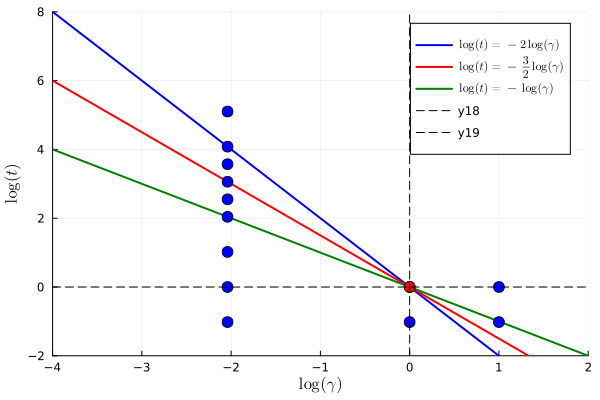

In [21]:
## afficher les sur le diagrame t , \gamma  

using Plots

function plot_graph(Points , Points_r )
    # Définir la plage de valeurs pour x
    x_values = range(-5, 5, length=400)

    # Définir les fonctions des droites
    line_1(x) = -2 * x
    line_2(x) = -3/2 * x
    line_3(x) = -x

    # Calculer les valeurs de y correspondantes
    y_1 = line_1.(x_values)
    y_2 = line_2.(x_values)
    y_3 = line_3.(x_values)

    # Tracer les droites
    plot(x_values, y_1, label=L"\log(t) = -2\log(\gamma)", color=:blue, lw=2)
    plot!(x_values, y_2, label=L"\log(t) = -\frac{3}{2}\log(\gamma)", color=:red, lw=2)
    plot!(x_values, y_3, label=L"\log(t) = -\log(\gamma)", color=:green, lw=2)

    # Tracer les points donnés
    for (x, y) in Points
        scatter!([x], [y], color=:blue, markershape=:circle, markersize=6, label=false)
    end

    if Points_r != nothing 
        for (x, y) in Points_r
            scatter!([x], [y], color=:red, markershape=:circle, markersize=6, label=false)
        end
    end 

    # Ajouter des labels et formatage
    xlabel!(L"\log(\gamma)")
    ylabel!(L"\log(t)")
    xlims!(-4, 2)
    ylims!(-2, 8)
    plot!(grid=true, legend=:topright)

    # Tracer les axes
    hline!([0], color=:black, lw=1, linestyle=:dash)
    vline!([0], color=:black, lw=1, linestyle=:dash)
end

# Exemple d'utilisation avec une liste de points
gamma = -2.04
Points = [(0, 0), (1, 0), (1, 0.5*gamma), (0, 0.5*gamma), (gamma, 0.5*gamma), 
          (gamma, 0), (gamma, -0.5*gamma), (gamma, -gamma), (gamma, (-1 -3/2)/2*gamma), 
          (gamma, -3/2*gamma), (gamma, (-3/2-2)/2*gamma), (gamma, -2*gamma), (gamma, -2.5*gamma)]

plot_graph(Points ,[ Points[1]])


In [22]:
new_date = Dates.format(Dates.today(), "yyyy-mm-dd")
#new_date = "2025-05-01"
println(new_date)
if !isdir(new_date)
    mkdir(new_date)
end

theta_max = 25
npts = 3000

function f_gamma( n , gb )
    return mass*gb/(hbar*n)
end 

function f_t( T , gb )
    return kB*T/(mass*gb^2)
end 

function f_n(gamma , gb )
    return mass*gb/hbar/gamma
end 

function f_T(t , gb )
    return t*mass*gb^2/kB
end 




2025-06-25


f_T (generic function with 1 method)

In [23]:
#new_date = "2025-03-26"

x_values = range(-3, stop= 1, length=10)
y_values = range(-1, stop=6, length=10)

Point = [ (x,y) for x in x_values for y in y_values ] 
Points = []

plot_graph(Point,Point)
theta_max = 10  


for point in Point 
    log_gam , log_t = point
    println(@sprintf("\n 🔧 Paramètre: log(γ) = %.3f, log(t) = %.3f", log_gam, log_t))

    plot_graph(Point , [point])

    mu = nothing
    n_p = f_n(10^log_gam , gbar )
    T = f_T(10^log_t , gbar )

    if log_t < 0 
        theta_max = 10 
    end 

    
    theta_max *= 3 
    if theta_max >= 1000 
        theta_max = 1000 
    end 
    
    println(@sprintf("\n 📍 theta_max * 3  = %.3f", theta_max))
    npts = round(Int , theta_max * 10)
    
    #Taille = 100

    theta_discr , nu_discr , rho_s_discr, rho_discr = save_theta_nu_rho_rho_s(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )

    theta_max = abs(minimum(theta_discr[nu_discr .>= 0.01]))

    println(@sprintf("\n 📍 theta_max = %.3f", theta_max))

    # Tracer nu_discr(theta_discr)
    plot(theta_discr, nu_discr, label="nu_discr(theta)", lw=2, xlabel="θ", ylabel="nu_discr")
    
    # Ajouter la barre verticale
    vline!([theta_max], label="θ_max", linestyle=:dash, lw=2, color=:red)
    
    # Afficher la figure
    display(plot!)
    
    # Ajouter un nouveau point dans la liste
    push!(Points, (log_gam , log_t, theta_max))
    
    # Nom du fichier et chemin
    nom = "Carte-theta-max-1"
    filename = @sprintf "%s/%s.npz" new_date nom
    
    # Convertir chaque tuple en un vecteur de Float64
    Points_array = hcat([Float64[el[1], el[2], el[3]] for el in Points]...)  # hcat pour concaténer les vecteurs horizontalement
    
    # Vérifier ce qui va être sauvegardé
    println(Points_array)
    
    # Sauvegarder dans un fichier .npz
    npzwrite(filename, Points_array)
    
    # Confirmation
    println("✅ saved : ", filename)
    
end 

#theta_discr , nu_discr , rho_s_discr, rho_discr = save_theta_nu_rho_rho_s(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )



 🔧 Paramètre: log(γ) = -3.000, log(t) = -1.000

 📍 theta_max * 3  = 30.000
✅ saved : 2025-06-25/theta_discr_30.000_300.000.npz
⚗️🧪🔋 Calule de µ 
  0.001103 seconds (242 allocations: 895.828 KiB)
✅ saved : 2025-06-25/nu_discr_71.060_0.116_30.000_300.000.npz
  0.126265 seconds (21.55 k allocations: 5.181 MiB, 97.68% compilation time)
✅ saved : 2025-06-25/rho_s_discr_71.060_0.116_30.000_300.000.npz
  0.079908 seconds (1.94 k allocations: 87.891 KiB, 99.92% compilation time)
✅ saved : 2025-06-25/rho_discr_71.060_0.116_30.000_300.000.npz

 📍 theta_max = 2.709


plot! (generic function with 4 methods)

[-3.0; -1.0; 2.7090301003344504;;]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -3.000, log(t) = -0.222

 📍 theta_max * 3  = 30.000
✅ saved : 2025-06-25/theta_discr_30.000_300.000.npz
⚗️🧪🔋 Calule de µ 
  0.009505 seconds (5.28 k allocations: 4.874 MiB)
✅ saved : 2025-06-25/nu_discr_508.626_0.693_30.000_300.000.npz
  0.004926 seconds (37 allocations: 4.132 MiB, 33.30% gc time)
✅ saved : 2025-06-25/rho_s_discr_508.626_0.693_30.000_300.000.npz
  0.000029 seconds (4 allocations: 2.469 KiB)
✅ saved : 2025-06-25/rho_discr_508.626_0.693_30.000_300.000.npz

 📍 theta_max = 3.110


plot! (generic function with 4 methods)

[-3.0 -3.0; -1.0 -0.2222222222222222; 2.7090301003344504 3.1103678929765906]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -3.000, log(t) = 0.556

 📍 theta_max * 3  = 9.331
✅ saved : 2025-06-25/theta_discr_9.331_93.000.npz
⚗️🧪🔋 Calule de µ 
  0.003478 seconds (3.70 k allocations: 1.560 MiB)
✅ saved : 2025-06-25/nu_discr_653.575_4.157_9.331_93.000.npz
  0.000331 seconds (32 allocations: 410.453 KiB)
✅ saved : 2025-06-25/rho_s_discr_653.575_4.157_9.331_93.000.npz
  0.000007 seconds (3 allocations: 880 bytes)
✅ saved : 2025-06-25/rho_discr_653.575_4.157_9.331_93.000.npz

 📍 theta_max = 3.246


plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0; -1.0 -0.2222222222222222 0.5555555555555556; 2.7090301003344504 3.1103678929765906 3.245601279627747]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -3.000, log(t) = 1.333

 📍 theta_max * 3  = 9.737
✅ saved : 2025-06-25/theta_discr_9.737_97.000.npz
⚗️🧪🔋 Calule de µ 
  0.003783 seconds (3.36 k allocations: 1.430 MiB)
✅ saved : 2025-06-25/nu_discr_652.920_24.919_9.737_97.000.npz
  0.000355 seconds (32 allocations: 446.078 KiB)
✅ saved : 2025-06-25/rho_s_discr_652.920_24.919_9.737_97.000.npz
  0.000003 seconds (3 allocations: 880 bytes)
✅ saved : 2025-06-25/rho_discr_652.920_24.919_9.737_97.000.npz

 📍 theta_max = 5.274


plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -3.000, log(t) = 2.111

 📍 theta_max * 3  = 15.822
✅ saved : 2025-06-25/theta_discr_15.822_158.000.npz
⚗️🧪🔋 Calule de µ 
  0.003127 seconds (2.37 k allocations: 1.761 MiB)
✅ saved : 2025-06-25/nu_discr_1165.962_149.383_15.822_158.000.npz
  0.000789 seconds (32 allocations: 1.150 MiB)
✅ saved : 2025-06-25/rho_s_discr_1165.962_149.383_15.822_158.000.npz
  0.000004 seconds (3 allocations: 1.391 KiB)
✅ saved : 2025-06-25/rho_discr_1165.962_149.383_15.822_158.000.npz

 📍 theta_max = 11.590


plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -3.000, log(t) = 2.889

 📍 theta_max * 3  = 34.769
✅ saved : 2025-06-25/theta_discr_34.769_348.000.npz
⚗️🧪🔋 Calule de µ 
  0.010557 seconds (4.20 k allocations: 4.767 MiB, 13.07% gc time)
✅ saved : 2025-06-25/nu_discr_1148.953_895.529_34.769_348.000.npz
  0.003071 seconds (37 allocations: 5.558 MiB)
✅ saved : 2025-06-25/rho_s_discr_1148.953_895.529_34.769_348.000.npz
  0.000007 seconds (4 allocations: 2.844 KiB)
✅ saved : 2025-06-25/rho_discr_1148.953_895.529_34.769_348.000.npz

 📍 theta_max = 28.156


plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -3.000, log(t) = 3.667

 📍 theta_max * 3  = 84.467
✅ saved : 2025-06-25/theta_discr_84.467_845.000.npz
⚗️🧪🔋 Calule de µ 
  0.036616 seconds (6.43 k allocations: 19.443 MiB, 4.28% gc time)
✅ saved : 2025-06-25/nu_discr_1100.337_5368.554_84.467_845.000.npz
  0.023420 seconds (37 allocations: 32.719 MiB, 12.95% gc time)
✅ saved : 2025-06-25/rho_s_discr_1100.337_5368.554_84.467_845.000.npz
  0.000024 seconds (4 allocations: 6.719 KiB)
✅ saved : 2025-06-25/rho_discr_1100.337_5368.554_84.467_845.000.npz

 📍 theta_max = 68.855


plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -3.000, log(t) = 4.444

 📍 theta_max * 3  = 206.564
✅ saved : 2025-06-25/theta_discr_206.564_2066.000.npz
⚗️🧪🔋 Calule de µ 
  0.272902 seconds (10.68 k allocations: 89.043 MiB, 0.72% gc time)
✅ saved : 2025-06-25/nu_discr_71.060_32183.638_206.564_2066.000.npz
  0.322583 seconds (37 allocations: 195.470 MiB, 23.97% gc time)
✅ saved : 2025-06-25/rho_s_discr_71.060_32183.638_206.564_2066.000.npz
  0.000018 seconds (4 allocations: 16.281 KiB)
✅ saved : 2025-06-25/rho_discr_71.060_32183.638_206.564_2066.000.npz

 📍 theta_max = 168.552


plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -3.000, log(t) = 5.222

 📍 theta_max * 3  = 505.657
✅ saved : 2025-06-25/theta_discr_505.657_5057.000.npz
⚗️🧪🔋 Calule de µ 
  3.313551 seconds (18.22 k allocations: 430.034 MiB, 0.32% gc time)
✅ saved : 2025-06-25/nu_discr_71.060_192935.839_505.657_5057.000.npz
  2.107714 seconds (37 allocations: 1.143 GiB, 21.22% gc time)
✅ saved : 2025-06-25/rho_s_discr_71.060_192935.839_505.657_5057.000.npz
  0.000032 seconds (4 allocations: 39.656 KiB)
✅ saved : 2025-06-25/rho_discr_71.060_192935.839_505.657_5057.000.npz

 📍 theta_max = 412.646


plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -3.000, log(t) = 6.000

 📍 theta_max * 3  = 1000.000
✅ saved : 2025-06-25/theta_discr_1000.000_10000.000.npz
⚗️🧪🔋 Calule de µ 
 14.332908 seconds (31.44 k allocations: 1.526 GiB, 3.21% gc time)
✅ saved : 2025-06-25/nu_discr_71.060_1156619.967_1000.000_10000.000.npz
  9.533631 seconds (37 allocations: 4.471 GiB, 5.77% gc time)
✅ saved : 2025-06-25/rho_s_discr_71.060_1156619.967_1000.000_10000.000.npz
  0.000060 seconds (4 allocations: 78.219 KiB)
✅ saved : 2025-06-25/rho_discr_71.060_1156619.967_1000.000_10000.000.npz

 📍 theta_max = 1000.000


plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -2.556, log(t) = -1.000

 📍 theta_max * 3  = 30.000
✅ saved : 2025-06-25/theta_discr_30.000_300.000.npz
⚗️🧪🔋 Calule de µ 
  0.001078 seconds (242 allocations: 895.828 KiB)
✅ saved : 2025-06-25/nu_discr_35.574_0.116_30.000_300.000.npz
  0.003383 seconds (37 allocations: 4.132 MiB)
✅ saved : 2025-06-25/rho_s_discr_35.574_0.116_30.000_300.000.npz
  0.000008 seconds (4 allocations: 2.469 KiB)
✅ saved : 2025-06-25/rho_discr_35.574_0.116_30.000_300.000.npz

 📍 theta_max = 2.709


plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -2.556, log(t) = -0.222

 📍 theta_max * 3  = 30.000
✅ saved : 2025-06-25/theta_discr_30.000_300.000.npz
⚗️🧪🔋 Calule de µ 
  0.009162 seconds (5.28 k allocations: 4.874 MiB)
✅ saved : 2025-06-25/nu_discr_357.039_0.693_30.000_300.000.npz
  0.002918 seconds (37 allocations: 4.132 MiB)
✅ saved : 2025-06-25/rho_s_discr_357.039_0.693_30.000_300.000.npz
  0.000004 seconds (4 allocations: 2.469 KiB)
✅ saved : 2025-06-25/rho_discr_357.039_0.693_30.000_300.000.npz

 📍 theta_max = 3.110


plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -2.556, log(t) = 0.556

 📍 theta_max * 3  = 9.331
✅ saved : 2025-06-25/theta_discr_9.331_93.000.npz
⚗️🧪🔋 Calule de µ 
  0.002655 seconds (3.70 k allocations: 1.560 MiB)
✅ saved : 2025-06-25/nu_discr_427.516_4.157_9.331_93.000.npz
  0.000277 seconds (32 allocations: 410.453 KiB)
✅ saved : 2025-06-25/rho_s_discr_427.516_4.157_9.331_93.000.npz
  0.000007 seconds (3 allocations: 880 bytes)
✅ saved : 2025-06-25/rho_discr_427.516_4.157_9.331_93.000

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -2.556, log(t) = 1.333

 📍 theta_max * 3  = 9.737
✅ saved : 2025-06-25/theta_discr_9.737_97.000.npz
⚗️🧪🔋 Calule de µ 
  0.002593 seconds (3.36 k allocations: 1.430 MiB)
✅ saved : 2025-06-25/nu_discr_393.335_24.919_9.737_97.000.npz
  0.000295 seconds (32 allocations: 446.078 KiB)
✅ saved : 2025-06-25/rho_s_discr_393.335_24.919_9.737_97.000.npz
  0.000003 seconds (3 allocations: 880 bytes

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -2.556, log(t) = 2.111

 📍 theta_max * 3  = 15.822
✅ saved : 2025-06-25/theta_discr_15.822_158.000.npz
⚗️🧪🔋 Calule de µ 
  0.004532 seconds (2.37 k allocations: 1.761 MiB)
✅ saved : 2025-06-25/nu_discr_409.377_149.383_15.822_158.000.npz
  0.000706 seconds (32 allocations: 1.150 MiB)
✅ saved : 2025-06-25/rho_s_discr_409.377_149.383

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -2.556, log(t) = 2.889

 📍 theta_max * 3  = 34.769
✅ saved : 2025-06-25/theta_discr_34.769_348.000.npz
⚗️🧪🔋 Calule de µ 
  0.012100 seconds (4.20 k allocations: 4.767 MiB, 17.34% gc time)
✅ saved : 2025-06-25/nu_discr_420.471_895.529_34.769_348.000.npz
  0.003195 seconds (37

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -2.556, log(t) = 3.667

 📍 theta_max * 3  = 84.467
✅ saved : 2025-06-25/theta_discr_84.467_845.000.npz
⚗️🧪🔋 Calule de µ 
  0.035997 seconds (6.43 k allocations: 19.443 MiB, 4.99% gc time)
✅ saved : 2025-06-25/nu_discr_4

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -2.556, log(t) = 4.444

 📍 theta_max * 3  = 206.564
✅ saved : 2025-06-25/theta_discr_206.564_2066.000.npz
⚗️🧪🔋 Calule de µ 
  0.301830 seconds (10.68 k allocation

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -2.556, log(t) = 5.222

 📍 theta_max * 3  = 505.657
✅ saved : 2025-06-25/theta_discr_505.657_5057.000.npz


plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -2.556, log(t) = 6.000

 📍 theta_max * 3  = 1000.0

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0]
✅ saved : 2025-06-25/Carte-theta-max-1.npz

 🔧 Paramètre: log(γ) = -2.111, log(t) = -1

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504]
✅ saved : 2025-06-25/Carte-theta-max-1.npz


plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.110

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.854657

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.7090301003344504 3.1103678929765906 3.245601

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367886 412.6461876243215 1000.0 2.709030

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.15568344244334 68.85465713886617 168.5521994367

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587371919144 28.1556834424

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.274102079395089 11.589587

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0; 2.7090301003344504 3.1103678929765906 3.245601279627747 5.

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222; 2.7090301003344504

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.2222

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.44

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.555555555555555

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.22222222222222

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.22

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555556 1.33333333333333

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.2222222222222222 0.5555555555555

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 -1.0 -0.222222222222

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.222222222222222 6.0 

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -0.7777777777777778; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 4.444444444444445 5.

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -0.7777777777777778 -0.7777777777777778; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889 3.6666666666666665 

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.111111111111111 2.888888888888889

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778; -1.0 -0.2222222222222222 0.5555555555555556 1.3333333333333333 2.1111111111111

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778; -1.0 -0.2222222222222222 0.5555555555555556 1.333333333333

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778; -1.0 -0.2222222222222222 0.55555555555

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778; -1.0 -0.2222222222

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778

plot! (generic function with 4 methods)

[-3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -3.0 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.5555555555555554 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -2.111111111111111 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.6666666666666667 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -1.2222222222222223 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778 -0.7777777777777778

LoadError: InterruptException:

f_theta_max (-1.5, 1) = 4.404744593780514
f_theta_max (x = -3.000,y = -1.000) = 2.709 , z = 2.709 
f_theta_max (x = -3.000,y = -0.222) = 3.110 , z = 3.110 
f_theta_max (x = -3.000,y = 0.556) = 3.246 , z = 3.246 
f_theta_max (x = -3.000,y = 1.333) = 5.274 , z = 5.274 
f_theta_max (x = -3.000,y = 2.111) = 11.590 , z = 11.590 
f_theta_max (x = -3.000,y = 2.889) = 28.156 , z = 28.156 
f_theta_max (x = -3.000,y = 3.667) = 68.855 , z = 68.855 
f_theta_max (x = -3.000,y = 4.444) = 168.552 , z = 168.552 
f_theta_max (x = -3.000,y = 5.222) = 412.646 , z = 412.646 
f_theta_max (x = -3.000,y = 6.000) = 1000.000 , z = 1000.000 
f_theta_max (x = -2.556,y = -1.000) = 2.709 , z = 2.709 
f_theta_max (x = -2.556,y = -0.222) = 3.110 , z = 3.110 
f_theta_max (x = -2.556,y = 0.556) = 3.246 , z = 3.246 
f_theta_max (x = -2.556,y = 1.333) = 5.274 , z = 5.274 
f_theta_max (x = -2.556,y = 2.111) = 11.590 , z = 11.590 
f_theta_max (x = -2.556,y = 2.889) = 28.156 , z = 28.156 
f_theta_max (x = -2.556,y = 3.667)

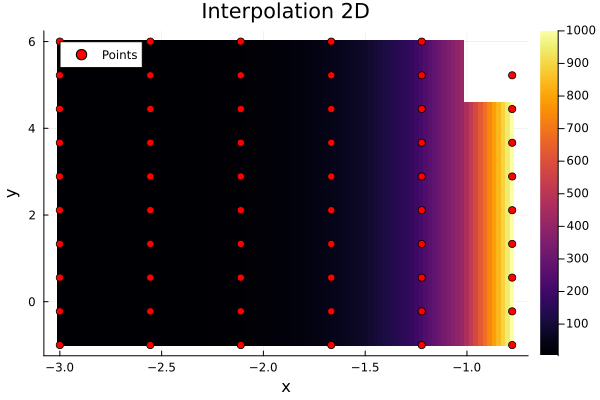

In [25]:
# ici je veux prevoir \theta_F en fonction de t et \gamma 

using Interpolations
#new_date = "2025-03-26"
function interpolation_2D(points)
    # Extraction des coordonnées
    x_vals = unique(sort([p[1] for p in points]))
    y_vals = unique(sort([p[2] for p in points]))
    
    # Création d'une matrice Z (initialisée avec NaN)
    Z = fill(NaN, length(x_vals), length(y_vals))  

    # Remplissage de Z avec les valeurs données
    for (x, y, z) in points
        i = findfirst(==(x), x_vals)
        j = findfirst(==(y), y_vals)
        if !isnothing(i) && !isnothing(j)
            Z[i, j] = z
        end
    end

    # Création de l'interpolateur linéaire avec extrapolation constante
    itp = interpolate((x_vals, y_vals), Z, Gridded(Linear()))

    # Retourne la fonction d'interpolation
    return (x, y) -> itp(x, y)
end


# === Test ===
Points = [(1.0, 1.0, 3.0), (2.0, 1.0, 4.0), (3.0, 1.0, 5.0),
          (1.0, 2.0, 2.0), (2.0, 2.0, 3.5), (3.0, 2.0, 6.0)]

nom = "Carte-theta-max-1"
filename = @sprintf "%s/%s.npz" new_date nom
Points = npzread(filename)
#println(size(Points)[2])
#println(Points[3,1])
Points = [(Points[1,i], Points[2,i], Points[3,i]) for i in 1:size(Points)[2] if Points[2,i]<7 ]

plot_graph([(x, y) for (x, y, _) in Points], nothing )
f_theta_max = interpolation_2D(Points)

# Test d'évaluation
println("f_theta_max (-1.5, 1) = ", f_theta_max(-1.5, 1))
#println("f(1, 1) = ", f(1, 1))
for point in Points
    x , y , z = point
    println(@sprintf("f_theta_max (x = %.3f,y = %.3f) = %.3f , z = %.3f ", x , y , f_theta_max(x,y) , z ) )
end 
    

# Création d'un grille pour l'évaluation de l'interpolation
x_vals = unique(sort([p[1] for p in Points]))
y_vals = unique(sort([p[2] for p in Points]))

# Grille de points pour tracer l'interpolation
xx = range(minimum(x_vals), stop=maximum(x_vals), length=100)
yy = range(minimum(y_vals), stop=maximum(y_vals), length=100)

# Calcul des valeurs d'interpolation
zz = [f_theta_max(x, y) for x in xx, y in yy]

# Création du graphique
heatmap(xx, yy, zz, xlabel="x", ylabel="y", title="Interpolation 2D")

# Optionnel : Ajouter les points originaux à la carte de chaleur
scatter!([p[1] for p in Points], [p[2] for p in Points], color=:red, label="Points")


-1.3419999999999999
1.9368093146651755


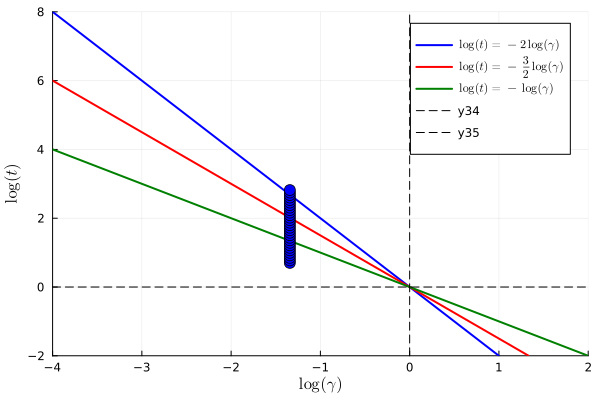

In [26]:
# à Gamma constant 

n_p = f_n(10^-1.342 , gbar )#60
log_gamma = log(f_gamma( n_p , gbar ))/log(10)
println(log_gamma)

println(log(f_t( 100 , gbar ))/log(10))

log(exp(1))

Points = [
    (0, 0 , 15), 
    (1, 0 , 15 ), 
    (1, 0.5 * log_gamma , 15), 
    (0, 0.5 * log_gamma , 15 ),  
    (log_gamma, 0.5 *log_gamma , 15 ), 
    (log_gamma, 0 , 15 ),
    (log_gamma, -0.5 * log_gamma , 15 ),
    (log_gamma,log(f_t( 100 , gbar ))/log(10) , 15 ),
    (log_gamma, -log_gamma , 25 ), 
    (log_gamma, (-1 - 3/2) / 2 * log_gamma , 30 ), 
    (log_gamma, -3/2 * log_gamma , 50 ), 
    (log_gamma, (-3/2 - 2) / 2 * log_gamma , 75), 
    (log_gamma, -2 * log_gamma , 150 ), 
    (log_gamma, -2.5 * log_gamma , 250 )
]

Points = [
    #(log_gamma, -0.65 * log_gamma , 15 ),
    (log_gamma, -0.75 * log_gamma , 15 ),
    (log_gamma, -0.85 * log_gamma , 15 ),
    (log_gamma,log(f_t( 100 , gbar ))/log(10) , 15 ),
    #(log_gamma, -log_gamma , 25 ), 
    #(log_gamma, -1.125*log_gamma , 25 ), 
    #(log_gamma, (-1 - 3/2) / 2 * log_gamma , 30 ), 
]

plot_graph([(x, y) for (x, y, _) in Points], [Points[1]])
# Fonction pour générer des points avec x constant
function generate_points(log_gamma, points_data)
    points = []
    for data in points_data
        y = data[1] * log_gamma  # Calcul du y à partir de la fonction associée
        z = data[2]  # La valeur de z
        push!(points, (log_gamma, y, z))  # Ajouter le point sous forme de tuple
    end
    return points
end

# Génération de 10 points pour y entre -0.85 et -1
y_values = range(0.7/log_gamma, stop=-2.1, length=30)

# Liste des points avec x constant
points_data = [(y_value, 30) for y_value in y_values]

# Choisir une valeur constante pour log_gamma
#log_gamma = 1.0  # Exemple de valeur pour log_gamma

# Appel de la fonction pour générer des points
Points = generate_points(log_gamma, points_data)


plot_graph([(x, y) for (x, y, _) in Points], nothing )

In [27]:
#Callcule des fluctuation 

list_logt = []
FLUC_N1 = []
FLUC_N2 = []
FLUC_E_minus_muN1  = []
FLUC_E_minus_muN2  = []

for point in Points 
    log_gam , log_t ,theta_max = point
    println(@sprintf("\n 🔧 Paramètre: log(γ) = %.3f, log(t) = %.3f", log_gam, log_t))
    theta_max =  f(log_gam,log_t)

    if theta_max > 50
        theta_max = 50 
    end 

    println(@sprintf("🏎️ θ max = %.3f µm/ms ", theta_max))
    
    mu = nothing
    n_p = f_n(10^log_gam , gbar )
    T = f_T(10^log_t , gbar )

    # calcul de mu(n_p, T)     
    if mu == nothing
        println("⚗️🧪🔋 Calule de µ ")
        mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
        mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
    end

    println(@sprintf("🌡️🔥❄️ T = %.3f nK ,  ⚗️🧪🔋 µ = %.3f nK", T, mu))
    
    #mup = mu * kB
    
    Taille = 100
    
    npts = round(Int , theta_max * 100)

    A1, A2, A3, inv_A = save_A_inv0(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    #A1, A2, A3, inv_A, inv_A1 , F , inv_A_approx, inv_A_approx_ordre = save_Fluctu_rho(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    #A1,  inv_A1 , F , inv_A_approx, = save_Fluctu_rho_rapide(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )

    theta_discr = npzread(@sprintf "%s/theta_discr_%.3f_%.3f.npz" new_date Float64(theta_max) Float64(npts))

    nom = "inv-A"
    inv_A = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts) )
    #nom = "inv-A-approx"
    #inv_A_approx = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts) )
    #nom = "inv-A-approx-ordre"
    #inv_A_approx_ordre = npzrf = f_interp.(theta_discr', theta_discr)
f = [f_interp(theta_discr[a], theta_discr[b]) for a in 1:L, b in 1:L]ead( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts) )
    
    p = plot(theta_discr, diag(inv_A), label="Diagonale de inv A", title="Tracé de la diagonale de inv A", xlabel="theta", ylabel="Valeur", marker=:o)
    #plot!(p, theta_discr, diag(inv_A_approx), label="Diagonale de inv A approx", xlabel="theta", ylabel="Valeur", marker=:o)
    #plot!(p, theta_discr, diag(inv_A_approx_ordre), label="Diagonale de inv A approx ordre", xlabel="theta", ylabel="Valeur", marker=:o)
    display(p)


    fluctu_N1 , fluctu_N2 ,  fluctu_E_minus_muN1 , fluctu_E_minus_muN2 = Fluct_test( new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar ) 

    push!(list_logt, log_t)
    
    push!(FLUC_N1, fluctu_N1)
    push!(FLUC_N2, fluctu_N2)
    push!(FLUC_E_minus_muN1, fluctu_E_minus_muN1 )
    push!(FLUC_E_minus_muN2, fluctu_E_minus_muN2 )
    
end 


 🔧 Paramètre: log(γ) = -1.342, log(t) = 0.700


LoadError: UndefVarError: `f` not defined in local scope
Suggestion: check for an assignment to a local variable that shadows a global of the same name.

In [28]:
# afficher les fluctuations

using Plots
#import Pkg; Pkg.add("Images")
using Images

function plot_and_save_graphs(new_date, list_logt, FLUC_N1, FLUC_N2, FLUC_E_minus_muN1, FLUC_E_minus_muN2, log_t_min = 2 , log_t_max = 6 )
    
    
     
    
    # Filtrer les indices qui respectent l'intervalle
    indices = findall(log_t -> log_t_min <= log_t <= log_t_max, list_logt)
    
    # Appliquer le filtrage
    list_logt_filtered = list_logt[indices]
    FLUC_N1_filtered = FLUC_N1[indices]
    FLUC_N2_filtered = FLUC_N2[indices]
    FLUC_E_minus_muN1_filtered = FLUC_E_minus_muN1[indices]
    FLUC_E_minus_muN2_filtered = FLUC_E_minus_muN2[indices]

    # Conversion en Float64 si nécessaire et affichage des valeurs en notation scientifique
    println("list_logt: ", join(@sprintf("%.3e , ", Float64(x)) for x in list_logt_filtered))
    println("FLUC_N1: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_N1_filtered))
    println("FLUC_N2: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_N2_filtered))
    println("FLUC_E_minus_muN1: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_E_minus_muN1_filtered))
    println("FLUC_E_minus_muN2: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_E_minus_muN2_filtered))


    
    # Vérifier les valeurs
    println("Bornes de list_logt_filtered : ", extrema(list_logt_filtered))
    
    # Tracé de FLUC_N1 et FLUC_N2
    p1 = plot(list_logt_filtered, FLUC_N1_filtered, label=L"N_1", lw=2, markershape=:circle , title = L"\langle N^2 \rangle, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma) )
    plot!(p1, list_logt_filtered, FLUC_N2_filtered, label=L"N_2", lw=2, markershape=:square  , ylabel=L"\langle N^2 \rangle")
    
    # Tracé de FLUC_E_minus_muN1 et FLUC_E_minus_muN2
    p2 = plot(list_logt_filtered, FLUC_E_minus_muN1_filtered, label=L"E_1 - \mu N_1", lw=2, markershape=:diamond , title = L"\langle (E - \mu N)^2 \rangle, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma))
    plot!(p2, list_logt_filtered, FLUC_E_minus_muN2_filtered, label=L"E_2 - \mu N_2", lw=2, markershape=:utriangle , ylabel=L"\langle (E - \mu N)^2 \rangle")
    
    # Affichage des deux graphes dans une seule figure (layout 1x2)
    plot(p1, p2, layout=(1,2), xlabel=L"\log t ", size=(900,400))
    
    # Sauvegarde du graphique
    filename = @sprintf("%s/fluctuations_plot_log_gamma=%.3f.png" , new_date , log_gamma)  
    savefig(filename)
    println(@sprintf("Graphique sauvegardé sous '%s'" , filename ) )
    
    # Calcul du taux de variation relatif
    mask_N = FLUC_N1_filtered .!= 0
    mask_E = FLUC_E_minus_muN1_filtered .!= 0
    
    relative_N = zeros(length(FLUC_N1_filtered))
    relative_E = zeros(length(FLUC_E_minus_muN1_filtered))
    
    relative_N[mask_N] = (FLUC_N1_filtered[mask_N] .- FLUC_N2_filtered[mask_N]) ./ FLUC_N1_filtered[mask_N] 
    relative_E[mask_E] = (FLUC_E_minus_muN1_filtered[mask_E] .- FLUC_E_minus_muN2_filtered[mask_E]) ./ FLUC_E_minus_muN1_filtered[mask_E]
    
    # Tracé du taux de variation relatif
    p3 = plot(list_logt_filtered, relative_N * 100, label="Variation relative N", lw=2, markershape=:circle , title = L"\frac{\langle N^2_1 \rangle - \langle N^2_2 \rangle}{\langle N^2_1 \rangle} \times 100, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma))
    p4 = plot(list_logt_filtered, relative_E * 100, label="Variation relative E", lw=2, markershape=:diamond , title = L"\frac{\langle (E_1 - \mu N_1)^2 \rangle - \langle (E_2 - \mu N_2)^2 \rangle}{\langle (E_1 - \mu N_1)^2 \rangle} \times 100, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma))
    
    plot(p3, p4, xlabel=L"\log t ", ylabel=L"Pourcentage %" ,layout=(1,2), size=(900,400))
    
    # Sauvegarde du graphique relatif
    #savefig("$(new_date)/fluctuations_relativ_plot_$(log_gamma).png")
    #println("Graphique sauvegardé sous '$(new_date)/fluctuations_relativ_plot_$(log_gamma).png'")
    filename_r = @sprintf("%s/fluctuations_relativ_plot_log_gamma=%.3f.png" , new_date , log_gamma)  
    savefig(filename_r)
    println(@sprintf("Graphique sauvegardé sous '%s'" , filename_r ) )

    # Affichage de l'image sauvegardée
    img = Images.load(filename)
    display(img)
    img = Images.load(filename_r)
    display(img)
end

plot_and_save_graphs(new_date, list_logt, FLUC_N1, FLUC_N2, FLUC_E_minus_muN1, FLUC_E_minus_muN2, -1 ,  3 )


list_logt: 
FLUC_N1: 
FLUC_N2: 
FLUC_E_minus_muN1: 
FLUC_E_minus_muN2: 


LoadError: ArgumentError: reducing over an empty collection is not allowed; consider supplying `init` to the reducer

2.936809314665175


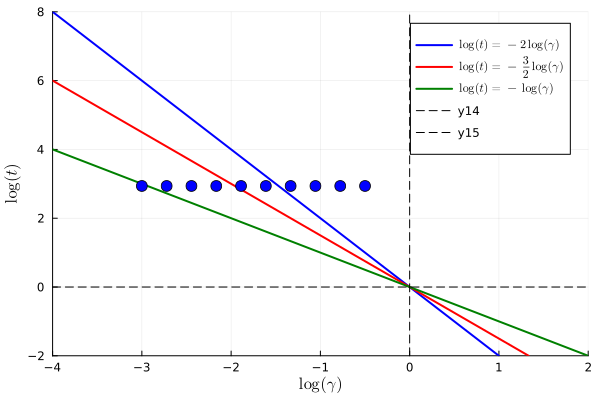

In [29]:
# A t constant 

T = 1000
log_t = log( f_t( T  , gbar ))/log(10)
println(log_t)


function generate_points(log_t , points_data)
    points = []
    for data in points_data
        x = data[1]# Calcul du y à partir de la fonction associée
        z = data[2]  # La valeur de z
        push!(points, (x, log_t , z))  # Ajouter le point sous forme de tuple
    end
    return points
end

# Génération de 10 points pour y entre -0.85 et -1
x_values = range(-3, stop=-0.5, length=10)

# Liste des points avec x constant
points_data = [(x_value, 10) for x_value in x_values]

# Choisir une valeur constante pour log_gamma
#log_gamma = 1.0  # Exemple de valeur pour log_gamma

# Appel de la fonction pour générer des points
Points = generate_points(log_t, points_data)


plot_graph([(x, y) for (x, y, _) in Points], nothing )



In [30]:
# calcules des fluctuations 

list_log_gam = []
FLUC_N1 = []
FLUC_N2 = []
FLUC_E_minus_muN1  = []
FLUC_E_minus_muN2  = []

for point in Points 
    log_gam , log_t ,theta_max = point
    println(@sprintf("\n 🔧 Paramètre: log(γ) = %.3f, log(t) = %.3f", log_gam, log_t))
    theta_max =  f(log_gam,log_t)

    if theta_max > 50
        theta_max = 50 
    end 

    println(@sprintf("🏎️ θ max = %.3f µm/ms ", theta_max))
    
    mu = nothing
    n_p = f_n(10^log_gam , gbar )
    T = f_T(10^log_t , gbar )

    # calcul de mu(n_p, T)     
    if mu == nothing
        println("⚗️🧪🔋 Calule de µ ")
        mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
        mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
    end

    println(@sprintf("🌡️🔥❄️ T = %.3f nK ,  ⚗️🧪🔋 µ = %.3f nK", T, mu))
    
    #mup = mu * kB
    
    Taille = 100
    
    npts = round(Int , theta_max * 10)

    A1, A2, A3, inv_A = save_A_inv0(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    
    theta_discr = npzread(@sprintf "%s/theta_discr_%.3f_%.3f.npz" new_date Float64(theta_max) Float64(npts))


    fluctu_N1 , fluctu_N2 ,  fluctu_E_minus_muN1 , fluctu_E_minus_muN2 = Fluct_test( new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar ) 

    push!(list_log_gam, log_gam)
    
    push!(FLUC_N1, fluctu_N1)
    push!(FLUC_N2, fluctu_N2)
    push!(FLUC_E_minus_muN1, fluctu_E_minus_muN1 )
    push!(FLUC_E_minus_muN2, fluctu_E_minus_muN2 )
    
end 


 🔧 Paramètre: log(γ) = -3.000, log(t) = 2.937


LoadError: UndefVarError: `f` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [31]:
# afficher les fluctuation 

using Plots
#import Pkg; Pkg.add("Images")
using Images

function plot_and_save_graphs(new_date, list_logt, FLUC_N1, FLUC_N2, FLUC_E_minus_muN1, FLUC_E_minus_muN2, log_gam_min = 2 , log_gam_max = 6 )
    
    
     
    
    # Filtrer les indices qui respectent l'intervalle
    indices = findall(log_gam -> log_gam_min <= log_gam <= log_gam_max, list_log_gam)
    
    # Appliquer le filtrage
    list_log_gam_filtered = list_log_gam[indices]
    FLUC_N1_filtered = FLUC_N1[indices]
    FLUC_N2_filtered = FLUC_N2[indices]
    FLUC_E_minus_muN1_filtered = FLUC_E_minus_muN1[indices]
    FLUC_E_minus_muN2_filtered = FLUC_E_minus_muN2[indices]

    # Conversion en Float64 si nécessaire et affichage des valeurs en notation scientifique
    println("list_log_gam: ", join(@sprintf("%.3e , ", Float64(x)) for x in list_log_gam_filtered))
    println("FLUC_N1: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_N1_filtered))
    println("FLUC_N2: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_N2_filtered))
    println("FLUC_E_minus_muN1: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_E_minus_muN1_filtered))
    println("FLUC_E_minus_muN2: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_E_minus_muN2_filtered))


    
    # Vérifier les valeurs
    println("Bornes de list_log_gam_filtered : ", extrema(list_log_gam_filtered))
    
    # Tracé de FLUC_N1 et FLUC_N2
    p1 = plot(list_log_gam_filtered, FLUC_N1_filtered, label=L"N_1", lw=2, markershape=:circle , title = L"\langle N^2 \rangle, ~ \log(t) = " * @sprintf("%.3f", log_t) )
    plot!(p1, list_log_gam_filtered, FLUC_N2_filtered, label=L"N_2", lw=2, markershape=:square  , ylabel=L"\langle N^2 \rangle")
    
    # Tracé de FLUC_E_minus_muN1 et FLUC_E_minus_muN2
    p2 = plot(list_log_gam_filtered, FLUC_E_minus_muN1_filtered, label=L"E_1 - \mu N_1", lw=2, markershape=:diamond , title = L"\langle (E - \mu N)^2 \rangle, ~ \log(t) = " * @sprintf("%.3f", log_t))
    plot!(p2, list_log_gam_filtered, FLUC_E_minus_muN2_filtered, label=L"E_2 - \mu N_2", lw=2, markershape=:utriangle , ylabel=L"\langle (E - \mu N)^2 \rangle")
    
    # Affichage des deux graphes dans une seule figure (layout 1x2)
    plot(p1, p2, layout=(1,2), xlabel=L"\log γ ", size=(900,400))
    
    # Sauvegarde du graphique
    filename = @sprintf("%s/fluctuations_plot_log_t=%.3f.png" , new_date , log_t)  
    savefig(filename)
    println(@sprintf("Graphique sauvegardé sous '%s'" , filename ) )
    
    # Calcul du taux de variation relatif
    mask_N = FLUC_N1_filtered .!= 0
    mask_E = FLUC_E_minus_muN1_filtered .!= 0
    
    relative_N = zeros(length(FLUC_N1_filtered))
    relative_E = zeros(length(FLUC_E_minus_muN1_filtered))
    
    relative_N[mask_N] = (FLUC_N1_filtered[mask_N] .- FLUC_N2_filtered[mask_N]) ./ FLUC_N1_filtered[mask_N] 
    relative_E[mask_E] = (FLUC_E_minus_muN1_filtered[mask_E] .- FLUC_E_minus_muN2_filtered[mask_E]) ./ FLUC_E_minus_muN1_filtered[mask_E]
    
    # Tracé du taux de variation relatif
    p3 = plot(list_log_gam_filtered, relative_N * 100, label="Variation relative N", lw=2, markershape=:circle , title = L"\frac{\langle N^2_1 \rangle - \langle N^2_2 \rangle}{\langle N^2_1 \rangle} \times 100, ~ \log(t) = " * @sprintf("%.3f", log_t))
    p4 = plot(list_log_gam_filtered, relative_E * 100, label="Variation relative E", lw=2, markershape=:diamond , title = L"\frac{\langle (E_1 - \mu N_1)^2 \rangle - \langle (E_2 - \mu N_2)^2 \rangle}{\langle (E_1 - \mu N_1)^2 \rangle} \times 100, ~ \log(t) = " * @sprintf("%.3f", log_t))
    
    plot(p3, p4, xlabel=L"\log γ ", ylabel=L"Pourcentage %" ,layout=(1,2), size=(900,400))
    
    # Sauvegarde du graphique relatif
    #savefig("$(new_date)/fluctuations_relativ_plot_$(log_gamma).png")
    #println("Graphique sauvegardé sous '$(new_date)/fluctuations_relativ_plot_$(log_gamma).png'")
    filename_r = @sprintf("%s/fluctuations_relativ_plot_log_t=%.3f.png" , new_date , log_t)  
    savefig(filename_r)
    println(@sprintf("Graphique sauvegardé sous '%s'" , filename_r ) )

    # Affichage de l'image sauvegardée
    img = Images.load(filename)
    display(img)
    img = Images.load(filename_r)
    display(img)
end

plot_and_save_graphs(new_date, list_logt, FLUC_N1, FLUC_N2, FLUC_E_minus_muN1, FLUC_E_minus_muN2, -2 ,  3 )


list_log_gam: 
FLUC_N1: 
FLUC_N2: 
FLUC_E_minus_muN1: 
FLUC_E_minus_muN2: 


LoadError: ArgumentError: reducing over an empty collection is not allowed; consider supplying `init` to the reducer

## à gamma constant 

In [32]:
new_date = Dates.format(Dates.today(), "yyyy-mm-dd")
#new_date = "2025-02-23"
#new_date = "2025-03-07"
println(new_date)
if !isdir(new_date)
    mkdir(new_date)
end

2025-06-25


n_p = 9.994062659754997
-1.3419999999999999
1.9368093146651755


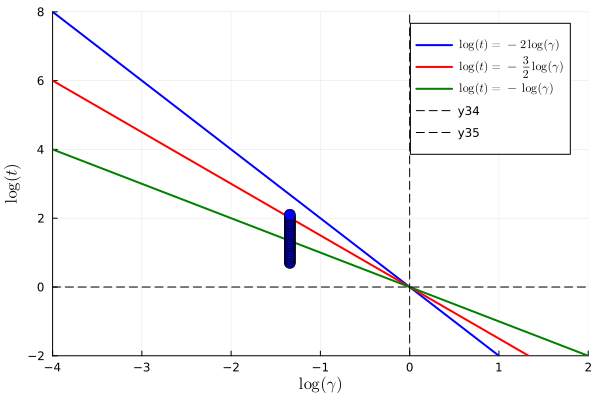

In [33]:
# à Gamma constant 

n_p = f_n(10^-1.342 , gbar )#60
#n_p = f_n(10^-2.5 , gbar )#60
println("n_p = " , n_p)
log_gamma = log(f_gamma( n_p , gbar ))/log(10)
println(log_gamma)

println(log(f_t( 100 , gbar ))/log(10))

log(exp(1))

Points = [
    (0, 0 , 15), 
    (1, 0 , 15 ), 
    (1, 0.5 * log_gamma , 15), 
    (0, 0.5 * log_gamma , 15 ),  
    (log_gamma, 0.5 *log_gamma , 15 ), 
    (log_gamma, 0 , 15 ),
    (log_gamma, -0.5 * log_gamma , 15 ),
    (log_gamma,log(f_t( 100 , gbar ))/log(10) , 15 ),
    (log_gamma, -log_gamma , 25 ), 
    (log_gamma, (-1 - 3/2) / 2 * log_gamma , 30 ), 
    (log_gamma, -3/2 * log_gamma , 50 ), 
    (log_gamma, (-3/2 - 2) / 2 * log_gamma , 75), 
    (log_gamma, -2 * log_gamma , 150 ), 
    (log_gamma, -2.5 * log_gamma , 250 )
]

Points = [
    #(log_gamma, -0.65 * log_gamma , 15 ),
    (log_gamma, -0.75 * log_gamma , 15 ),
    (log_gamma, -0.85 * log_gamma , 15 ),
    (log_gamma,log(f_t( 100 , gbar ))/log(10) , 15 ),
    #(log_gamma, -log_gamma , 25 ), 
    #(log_gamma, -1.125*log_gamma , 25 ), 
    #(log_gamma, (-1 - 3/2) / 2 * log_gamma , 30 ), 
]

plot_graph([(x, y) for (x, y, _) in Points], [Points[1]])
# Fonction pour générer des points avec x constant
function generate_points(log_gamma, points_data)
    points = []
    for data in points_data
        y = data[1] * log_gamma  # Calcul du y à partir de la fonction associée
        z = data[2]  # La valeur de z
        push!(points, (log_gamma, y, z))  # Ajouter le point sous forme de tuple
    end
    return points
end

# Génération de 10 points pour y entre -0.85 et -1
y_values = range(0.7/log_gamma, stop=2.1/log_gamma, length=30)

# Liste des points avec x constant
points_data = [(y_value, 30) for y_value in y_values]

# Choisir une valeur constante pour log_gamma
#log_gamma = 1.0  # Exemple de valeur pour log_gamma

# Appel de la fonction pour générer des points
Points = generate_points(log_gamma, points_data)


plot_graph([(x, y) for (x, y, _) in Points], nothing )

In [34]:
# calcules des fluctuations 

list_log_gam = []
list_log_t = []
FLUC_N1 = []
FLUC_N2 = []
FLUC_E_minus_muN1  = []
FLUC_E_minus_muN2  = []

inv_delta_theta = 5

for point in Points 
    log_gam , log_t ,theta_max = point
    println(@sprintf("\n 🔧 Paramètre: log(γ) = %.3f, log(t) = %.3f", log_gam, log_t))
    theta_max =  f_theta_max(log_gam,log_t)

    if theta_max > 50
        theta_max = 50 
    end 

    println(@sprintf("🏎️ θ max = %.3f µm/ms ", theta_max))
    
    mu = nothing
    n_p = f_n(10^log_gam , gbar )
    T = f_T(10^log_t , gbar )

    # calcul de mu(n_p, T)     
    if mu == nothing
        println("⚗️🧪🔋 Calule de µ ")
        mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
        mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
    end

    println(@sprintf("🌡️🔥❄️ T = %.3f nK ,  ⚗️🧪🔋 µ = %.3f nK", T, mu))
    
    #mup = mu * kB
    
    Taille = 100
    
    npts = round(Int , theta_max * 10)
    npts = round(Int , 2*theta_max * inv_delta_theta)

    #A1, A2, A3, A , inv_A , inv_A10, Critere_Neuman , Irreg ,  Reg , C   = save_A_inv0(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    Irreg ,  Reg ,  C = save_A_inv01(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    #F_Pi = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts) )
    nom = "inv-A"
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts)
    npzwrite(filename, Taille^2 * (Irreg + Reg) )
    println("✅ saved : ", filename)
    theta_discr = npzread(@sprintf "%s/theta_discr_%.3f_%.3f.npz" new_date Float64(theta_max) Float64(npts))


    fluctu_N1 , fluctu_N2 ,  fluctu_E_minus_muN1 , fluctu_E_minus_muN2 = Fluct_test( new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar ) 

    push!(list_log_gam, log_gam)
    push!(list_log_t, log_t)
    
    push!(FLUC_N1, fluctu_N1)
    push!(FLUC_N2, fluctu_N2)
    push!(FLUC_E_minus_muN1, fluctu_E_minus_muN1 )
    push!(FLUC_E_minus_muN2, fluctu_E_minus_muN2 )
    
end 


 🔧 Paramètre: log(γ) = -1.342, log(t) = 0.700
🏎️ θ max = 3.622 µm/ms 
⚗️🧪🔋 Calule de µ 
🌡️🔥❄️ T = 5.797 nK ,  ⚗️🧪🔋 µ = 23.805 nK
✅ saved : 2025-06-25/theta_discr_3.622_36.000.npz
🧠 ⚡ 🔥 🚀 ===================On recalcule Irrg er Reg de Jérome : Calcul des matrices... =======================
✅ saved : 2025-06-25/theta_discr_3.622_36.000.npz
  0.001007 seconds (3.65 k allocations: 665.406 KiB)
✅ saved : 2025-06-25/nu_discr_23.805_5.797_3.622_36.000.npz
  0.000073 seconds (32 allocations: 63.109 KiB)
✅ saved : 2025-06-25/rho_s_discr_23.805_5.797_3.622_36.000.npz
  0.000006 seconds (3 allocations: 400 bytes)
✅ saved : 2025-06-25/rho_discr_23.805_5.797_3.622_36.000.npz
  0.103332 seconds (23.49 k allocations: 1.236 MiB, 99.94% compilation time)
✅ saved : 2025-06-25/Irreg_23.805_5.797_100.000_3.622_36.000.npz
  0.049510 seconds (16.06 k allocations: 3.025 MiB, 97.35% compilation time)
✅ saved : 2025-06-25/C_23.805_5.797_100.000_3.622_36.000.npz
Progression: 100.0%
 ✅ Calcul terminé!
  0.21839

Excessive output truncated after 524323 bytes.

 🧠 Progression: 100.0%
 🏁 Calcul terminé!
✅ saved : 2025-06-25/fluctu_N2_27.500_93.344_100.000_9.931_99.000.npz
🌊 ⚛️ fluctu N1 = 2.99911e+03 , fluctu N2 = 2.98719e+03
🧠 ⚡ 🔥 🚀 Calcul de fluctu_E_minus_muN1 ...
✅ saved : 2025-06-25/fluctu_E_minus_muN1_27.500_93.344_100.000_9.931_99.000.npz
🧠 ⚡ 🔥 🚀 Calcul de fluctu_E_minus_muN2 ...
beta_charge [-3.7968249370048817e-25 0.0 1.44e-25]
 🧠 Progression: 6.5%

list_log_t: 7.000e-01 , 7.483e-01 , 7.966e-01 , 8.448e-01 , 8.931e-01 , 9.414e-01 , 9.897e-01 , 1.038e+00 , 1.086e+00 , 1.134e+00 , 1.183e+00 , 1.231e+00 , 1.279e+00 , 1.328e+00 , 1.376e+00 , 1.424e+00 , 1.472e+00 , 1.521e+00 , 1.569e+00 , 1.617e+00 , 1.666e+00 , 1.714e+00 , 1.762e+00 , 1.810e+00 , 1.859e+00 , 1.907e+00 , 1.955e+00 , 2.003e+00 , 2.052e+00 , 2.100e+00 , 
FLUC_N1: 2.384e+02 , 2.645e+02 , 2.968e+02 , 3.323e+02 , 3.719e+02 , 4.165e+02 , 4.667e+02 , 5.233e+02 , 5.873e+02 , 6.597e+02 , 7.423e+02 , 8.364e+02 , 9.436e+02 , 1.065e+03 , 1.202e+03 , 1.352e+03 , 1.516e+03 , 1.689e+03 , 1.868e+03 , 2.051e+03 , 2.231e+03 , 2.407e+03 , 2.574e+03 , 2.730e+03 , 2.872e+03 , 2.999e+03 , 3.109e+03 , 3.202e+03 , 3.278e+03 , 3.336e+03 , 
FLUC_N2: 2.380e+02 , 2.626e+02 , 2.959e+02 , 3.308e+02 , 3.700e+02 , 4.142e+02 , 4.638e+02 , 5.196e+02 , 5.825e+02 , 6.533e+02 , 7.337e+02 , 8.252e+02 , 9.297e+02 , 1.049e+03 , 1.186e+03 , 1.340e+03 , 1.510e+03 , 1.693e+03 , 1.882e+03 , 2.069e+03 , 2.249e+0

┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194


Graphique sauvegardé sous '2025-06-25/fluctuations_plot_log_gamma=-1.342.png'
Graphique sauvegardé sous '2025-06-25/fluctuations_relativ_plot_log_gamma=-1.342.png'


ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


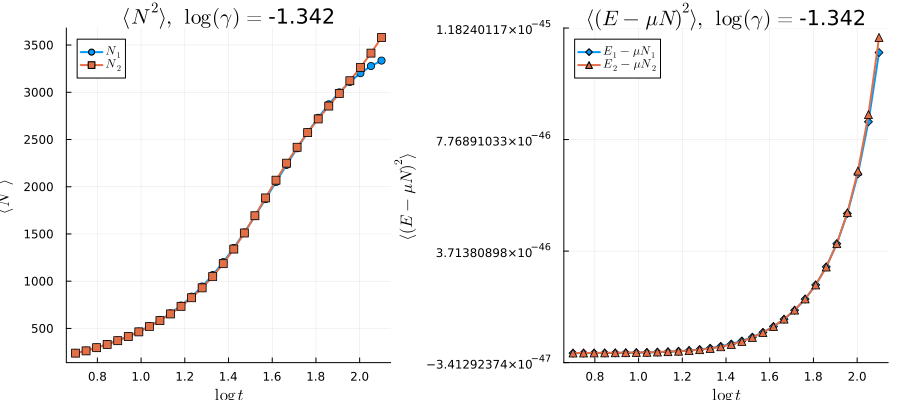

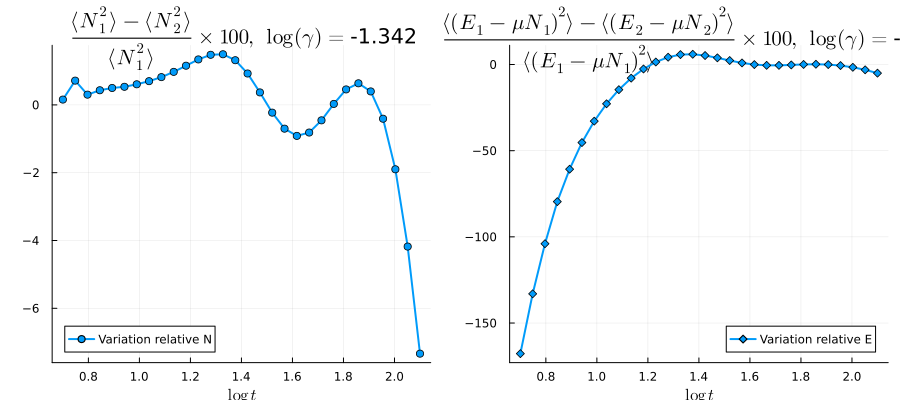

In [35]:
# afficher les fluctuations

using Plots
#import Pkg; Pkg.add("Images")
using Images

function plot_and_save_graphs(new_date, list_log_t, FLUC_N1, FLUC_N2, FLUC_E_minus_muN1, FLUC_E_minus_muN2, log_t_min = 2 , log_t_max = 6 )
    
    
     
    
    # Filtrer les indices qui respectent l'intervalle
    indices = findall(log_t -> log_t_min <= log_t <= log_t_max, list_log_t)
    
    # Appliquer le filtrage
    list_log_t_filtered = list_log_t[indices]
    FLUC_N1_filtered = FLUC_N1[indices]
    FLUC_N2_filtered = FLUC_N2[indices]
    FLUC_E_minus_muN1_filtered = FLUC_E_minus_muN1[indices]
    FLUC_E_minus_muN2_filtered = FLUC_E_minus_muN2[indices]

    # Conversion en Float64 si nécessaire et affichage des valeurs en notation scientifique
    println("list_log_t: ", join(@sprintf("%.3e , ", Float64(x)) for x in list_log_t_filtered))
    println("FLUC_N1: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_N1_filtered))
    println("FLUC_N2: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_N2_filtered))
    println("FLUC_E_minus_muN1: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_E_minus_muN1_filtered))
    println("FLUC_E_minus_muN2: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_E_minus_muN2_filtered))


    
    # Vérifier les valeurs
    println("Bornes de list_log_t_filtered : ", extrema(list_log_t_filtered))
    
    # Tracé de FLUC_N1 et FLUC_N2
    p1 = plot(list_log_t_filtered, FLUC_N1_filtered, label=L"N_1", lw=2, markershape=:circle , title = L"\langle N^2 \rangle, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma) )
    plot!(p1, list_log_t_filtered, FLUC_N2_filtered, label=L"N_2", lw=2, markershape=:square  , ylabel=L"\langle N^2 \rangle")
    
    # Tracé de FLUC_E_minus_muN1 et FLUC_E_minus_muN2
    p2 = plot(list_log_t_filtered, FLUC_E_minus_muN1_filtered, label=L"E_1 - \mu N_1", lw=2, markershape=:diamond , title = L"\langle (E - \mu N)^2 \rangle, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma))
    plot!(p2, list_log_t_filtered, FLUC_E_minus_muN2_filtered, label=L"E_2 - \mu N_2", lw=2, markershape=:utriangle , ylabel=L"\langle (E - \mu N)^2 \rangle")
    
    # Affichage des deux graphes dans une seule figure (layout 1x2)
    plot(p1, p2, layout=(1,2), xlabel=L"\log t ", size=(900,400))
    
    # Sauvegarde du graphique
    filename = @sprintf("%s/fluctuations_plot_log_gamma=%.3f.png" , new_date , log_gamma)  
    savefig(filename)
    println(@sprintf("Graphique sauvegardé sous '%s'" , filename ) )
    
    # Calcul du taux de variation relatif
    mask_N = FLUC_N1_filtered .!= 0
    mask_E = FLUC_E_minus_muN1_filtered .!= 0
    
    relative_N = zeros(length(FLUC_N1_filtered))
    relative_E = zeros(length(FLUC_E_minus_muN1_filtered))
    
    relative_N[mask_N] = (FLUC_N1_filtered[mask_N] .- FLUC_N2_filtered[mask_N]) ./ FLUC_N1_filtered[mask_N] 
    relative_E[mask_E] = (FLUC_E_minus_muN1_filtered[mask_E] .- FLUC_E_minus_muN2_filtered[mask_E]) ./ FLUC_E_minus_muN1_filtered[mask_E]
    
    # Tracé du taux de variation relatif
    p3 = plot(list_log_t_filtered, relative_N * 100, label="Variation relative N", lw=2, markershape=:circle , title = L"\frac{\langle N^2_1 \rangle - \langle N^2_2 \rangle}{\langle N^2_1 \rangle} \times 100, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma))
    p4 = plot(list_log_t_filtered, relative_E * 100, label="Variation relative E", lw=2, markershape=:diamond , title = L"\frac{\langle (E_1 - \mu N_1)^2 \rangle - \langle (E_2 - \mu N_2)^2 \rangle}{\langle (E_1 - \mu N_1)^2 \rangle} \times 100, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma))
    
    plot(p3, p4, xlabel=L"\log t ", ylabel=L"Pourcentage %" ,layout=(1,2), size=(900,400))
    
    # Sauvegarde du graphique relatif
    #savefig("$(new_date)/fluctuations_relativ_plot_$(log_gamma).png")
    #println("Graphique sauvegardé sous '$(new_date)/fluctuations_relativ_plot_$(log_gamma).png'")
    filename_r = @sprintf("%s/fluctuations_relativ_plot_log_gamma=%.3f.png" , new_date , log_gamma)  
    savefig(filename_r)
    println(@sprintf("Graphique sauvegardé sous '%s'" , filename_r ) )

    # Affichage de l'image sauvegardée
    img = Images.load(filename)
    display(img)
    img = Images.load(filename_r)
    display(img)
end

plot_and_save_graphs(new_date, list_log_t, FLUC_N1, FLUC_N2, FLUC_E_minus_muN1, FLUC_E_minus_muN2, -3 ,  8 )


## Test 

2.203981043068189


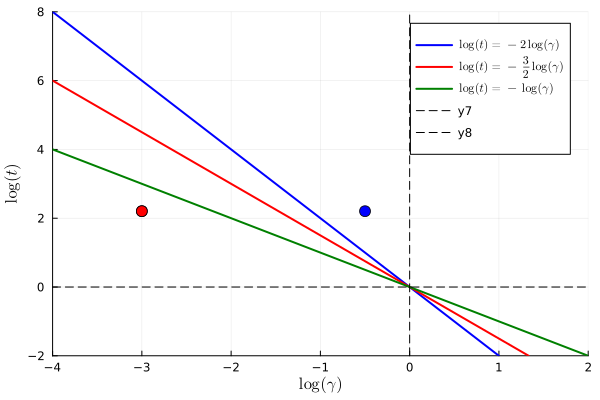

In [86]:
# on veux test la convergenc en faisant varient ∂theta

T = 18.5
T = 185
log_t = log( f_t( T  , gbar ))/log(10)
println(log_t)


function generate_points(log_t , points_data)
    points = []
    for data in points_data
        x = data[1]# Calcul du y à partir de la fonction associée
        z = data[2]  # La valeur de z
        push!(points, (x, log_t , z))  # Ajouter le point sous forme de tuple
    end
    return points
end

# Génération de 10 points pour y entre -0.85 et -1
x_values = range(-3, stop=-0.5, length=2)

#x_values = [-3]


# Liste des points avec x constant
points_data = [(x_value, 10) for x_value in x_values]

# Choisir une valeur constante pour log_gamma
#log_gamma = 1.0  # Exemple de valeur pour log_gamma

# Appel de la fonction pour générer des points
Points = generate_points(log_t, points_data)
#Points = [(-3,2,10)]


plot_graph([(x, y) for (x, y, _) in Points], [Points[1]] )

In [87]:
# fonction pour inverser localement matrice avec thechique de schur

using LinearAlgebra

# Inversion par Complément de Schur (méthode alternative)
function schur_inverse(A::Matrix{Float64})
    n = size(A, 1)
    if n == 1 
        return [1.0 ./ A[1]]
    elseif n == 0 
        return 1 
    end 
    
    k = div(n, 2)  # Division en blocs
    #println("k , n  , A =" , k ," , " ,  n , " , " , A )
    A11 = A[1:k, 1:k]
    A12 = A[1:k, k+1:end]
    A21 = A[k+1:end, 1:k]
    A22 = A[k+1:end, k+1:end]
    #println(A11 , ", " , A12 , ", " , A21 , ", " , A22 )

    inv_A11 = schur_inverse(A11)
    S = A22 - A21 * inv_A11 * A12  # Complément de Schur
    inv_S = schur_inverse(S)

    # Reconstruction de l'inverse
    inv_A = [inv_A11 + inv_A11 * A12 * inv_S * A21 * inv_A11   -inv_A11 * A12 * inv_S
             -inv_S * A21 * inv_A11                             inv_S]
    
    return inv_A
end

function compute_inverse_restricted00(F, F_perp, u)
    # Extraire les blocs de la matrice u
    u_F = u[F, F]  # Bloc correspondant à F
    u_F_perp = u[F_perp, F_perp]  # Bloc correspondant à F^\perp
    u_F_Fperp = u[F, F_perp]  # Bloc reliant F et F^\perp
    u_Fperp_F = u[F_perp, F]  # Bloc reliant F^\perp et F
    
    # Calcul de l'inverse des blocs

    u_F_inv = schur_inverse(u_F)
    S = u_F_perp - u_Fperp_F * u_F_inv  * u_F_Fperp  # Complément de Schur
    inv_S = schur_inverse(S)
    
    
    # Calcul de l'inverse restreint de u sur F
    #u_inv_F = u_F_inv + u_F_inv * u_F_Fperp * u_F_perp_inv * u_Fperp_F * u_F_inv
    
    return u_F_Fperp * inv_S * u_Fperp_F * u_F_inv
end

function compute_inverse_restricted0(F, F_perp, u)
    # Extraire les blocs de la matrice u
    u_F = u[F, F]  # Bloc correspondant à F
    u_F_perp = u[F_perp, F_perp]  # Bloc correspondant à F^\perp
    u_F_F_perp = u[F, F_perp]  # Bloc reliant F et F^\perp
    u_F_perp_F = u[F_perp, F]  # Bloc reliant F^\perp et F
    
    # Calcul de l'inverse des blocs
    u_F_inv = schur_inverse(u_F)
    u_F_perp_inv = schur_inverse(u_F_perp)
    S = u_F_perp - u_F_perp_F * u_F_inv  * u_F_F_perp  # Complément de Schur
    inv_S = schur_inverse(S)
    
    
    return u_F_inv , u_F_F_perp , u_F_perp_inv, u_F_perp_F , inv_S
end
### pars besoins 
function compute_inverse_restricted(F, F_perp, u)
    u_F_inv , u_F_F_perp , u_F_perp_inv, u_F_F_perp , inv_S  = compute_inverse_restricted0(F, F_perp, u)
    
    return u_F_inv + u_F_inv*u_F_Fperp*inv_S*u_F_perp_F*u_F_inv
end

function compute_full_inverse(u)
    n = size(u, 1)
    full_inverse = zeros(n, n)
    
    # Construire l'inverse en explorant toutes les décompositions possibles de F et F_perp
    for i in 1:n
        for j in i:n
            F = collect(1:i)
            F_perp = collect((i+1):n)
            if !isempty(F) && !isempty(F_perp)
                inv_F = compute_inverse_restricted(F, F_perp, u)
                full_inverse[F, F] = inv_F
                full_inverse[F_perp, F_perp] = inv(u[F_perp, F_perp])  # Ajout de l'autre bloc
            end
        end
    end
    return full_inverse
end

function compute_full_inverse(u)
    n = size(u, 1)
    full_inverse = zeros(n, n)
    
    # Construire l'inverse en explorant toutes les décompositions possibles de F et F_perp
    for i in 1:n
        for j in i+1:n
            F = [i, j]
            F_perp = setdiff(1:n, F)  # Correction pour obtenir F_perp correctement
            
            if  length(F_perp) > 0
                inv_F = compute_inverse_restricted(F, F_perp, u)
                #println( i , ", " ,  j , ", " , F , ", " , F_perp, ", " , inv_F )
                full_inverse[i, i] = inv_F[1,1]  # Extraction correcte
                full_inverse[j, j] = inv_F[2,2]  # Extraction correcte
                
                full_inverse[i, j] = inv_F[1,2]  # Extraction correcte
                full_inverse[j, i] = full_inverse[i, j]  # Remplissage symétrique
            else 
                
                return  compute_inverse_restricted(F, F_perp, u)   
                    
            end
        end
    end
    
    return full_inverse
end

function fonc_1(u_F_inv , u_F_perp_inv , p1 , p1_ast , p2 , p2_ast , max_iter) 

    tol = 1e-10   # tolérance

    p12 , p12_ast , B = p1*p2 , p2_ast*p1_ast ,  u_F_inv+p1*u_F_perp_inv*p1_ast 
    S = B
    prev = S
    Ai = B 
    #max_iter = 1
    
    for i in 1:max_iter
        Ai = p12 * prev * p12_ast
        S += Ai
        if norm(S - prev) < tol
            println("Convergence atteinte à l'itération $i")
            return S
            break
        end
        prev = Ai
    end
    return S
end 

fonc_1 (generic function with 1 method)


 🔧 Paramètre: log(γ) = -3.000, log(t) = 2.204
🏎️ θ max = 13.568 µm/ms 
⚗️🧪🔋 Calule de µ 
🌡️🔥❄️ T = 185.000 nK ,  ⚗️🧪🔋 µ = 6752.658 nK




🏎️ ∂θ = 0.100000 µm/ms , # = 271.000000 , 1/∂θ = 10.000000 ms/µm
✅ saved : 2025-05-07/theta_discr_13.568_271.000.npz
✅ =================Le fichier existe déjà, chargement des matrices... =======================
✅ On ne recalcule pas l'inverse 
🔲 Verifiecation de la symetrie
✅ A est symetrique
✅ saved : 2025-05-07/theta_discr_13.568_271.000.npz
✅ ================= Calcule Jerome dejais fais : Le fichier existe déjà, chargement des matrices... =======================
🔲 Verifiecation de la symetrie Jérome 
❌ A n'est pas symetrique
🔲 Norme de de la projection sur Sn sur Norme de A 
📊 🔵 / 🏁 Norme Frobenius :  norm(A-B)/norm(A) = 1.0
📊 ➕ / 🏙️ Norme L1 :  norm(A-B)/norm(A) = 1.0
📊 🔵 / 🏁 Norme L2 :  norm(A-B)/norm(A) = 1.0
📊 ⏳ / 🔝 Norme de l'infini :  norm(A-B)/norm(A) = 1.0
🔳 Norme de de la projection sur An sur Norme de A 
📊 🔵 / 🏁 Norme Frobenius :  norm(

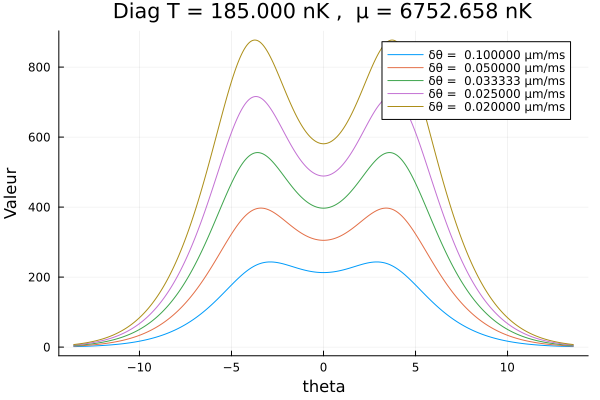

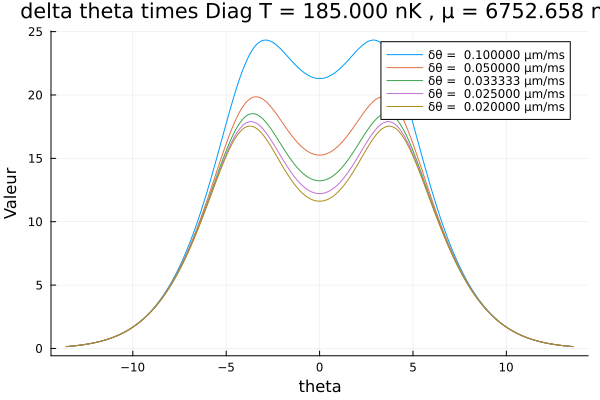

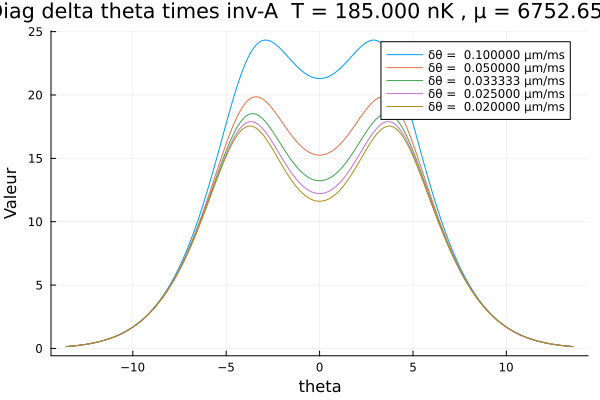

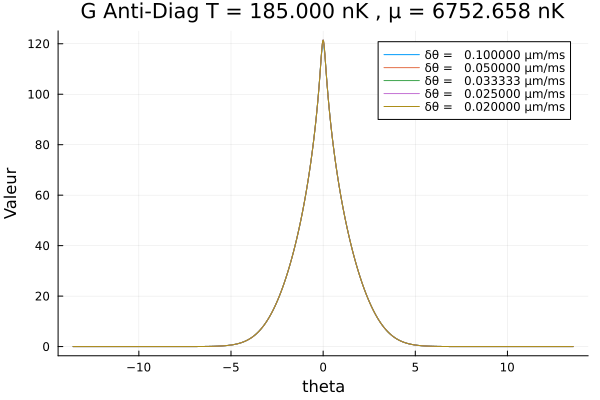

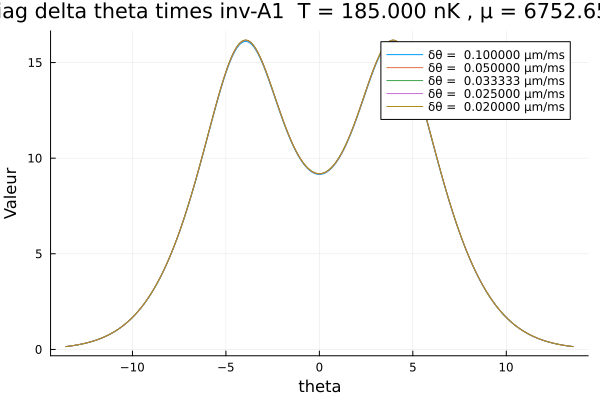

...

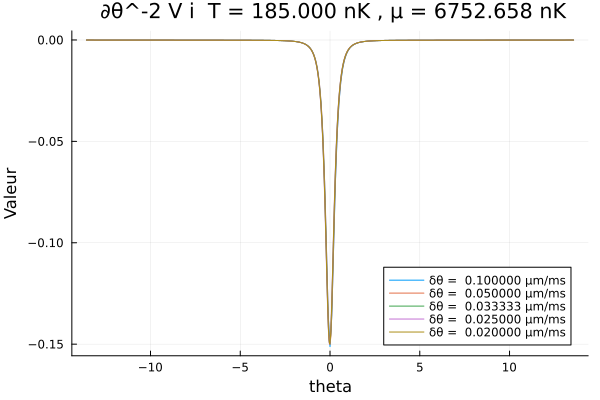

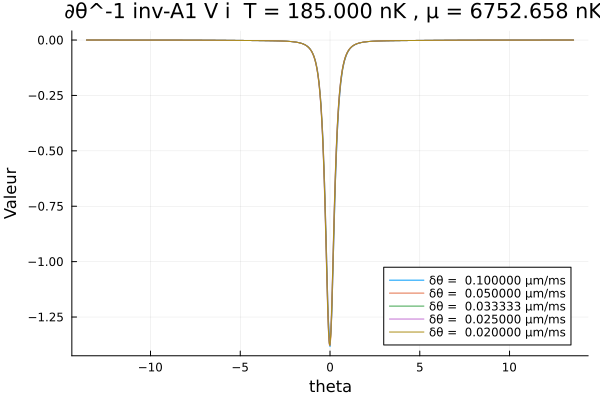

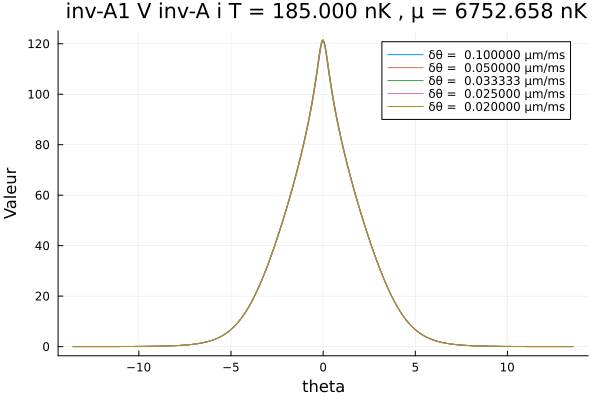

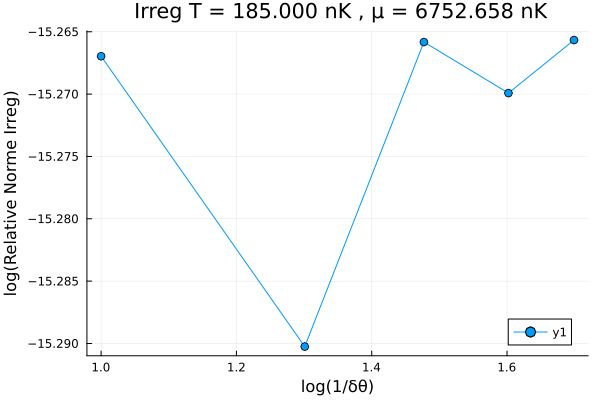

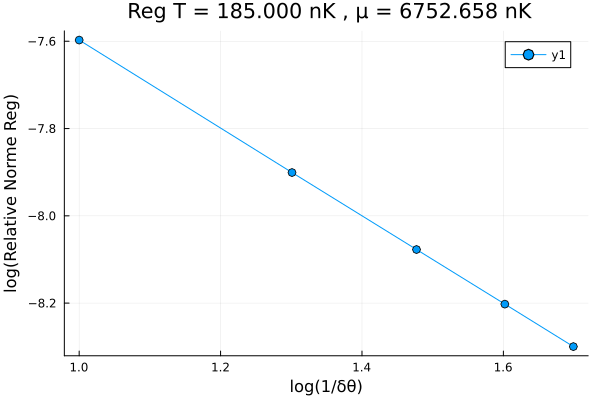

In [90]:
# calcule des fluctuation 
new_date = "2025-05-07"
#new_date = "2025-03-27"

inv_delta_theta_values = range(10, stop=50, length=5)
log_gam , log_t ,theta_max = Points[1]
println(@sprintf("\n 🔧 Paramètre: log(γ) = %.3f, log(t) = %.3f", log_gam, log_t))
theta_max =  f_theta_max(log_gam,log_t)

if theta_max > 50
    theta_max = 50 
end 

println(@sprintf("🏎️ θ max = %.3f µm/ms ", theta_max))
    
mu = nothing
n_p = f_n(10^log_gam , gbar )
T = f_T(10^log_t , gbar )

# calcul de mu(n_p, T)     
if mu == nothing
    println("⚗️🧪🔋 Calule de µ ")
    mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
    mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
end

println(@sprintf("🌡️🔥❄️ T = %.3f nK ,  ⚗️🧪🔋 µ = %.3f nK", T, mu))

#mup = mu * kB

Taille = 100
p_com1 = plot(title=@sprintf("Diag T = %.3f nK ,  µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
p_com2 = plot(title=@sprintf("delta theta times Diag T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
p_com5 = plot(title=@sprintf("Anti-Diag T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")

fini = 0

antidiag(M) = [M[i, end-i+1] for i in 1:size(M, 1)]

p_com9 = plot(title=@sprintf("Diag delta theta times inv-A  T = %.3f nK , µ = %.3f nK", T, mu), xlabel="theta", ylabel="Valeur")
p_com10 = plot(title=@sprintf("G Anti-Diag T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
p_com11 = plot(title=@sprintf("Diag delta theta times inv-A1  T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")

p_com14 = plot(title=@sprintf("diag ∂θ^-2 V  T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
p_com15 = plot(title=@sprintf("anti-diag ∂θ^-2 V  T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
p_com16 = plot(title=@sprintf("diag ∂θ^-1 inv-A1 V   T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
p_com17 = plot(title=@sprintf("anti-diag ∂θ^-1 inv-A1 V   T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
p_com18 = plot(title=@sprintf("diag inv-A1 V inv-A T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
p_com19 = plot(title=@sprintf("anti-diag inv-A1 V inv-A  T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")

p_com20 = plot(title=@sprintf("diag inv-A1 V inv-A - inv-A V inv-A1  T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
p_com21 = plot(title=@sprintf("anti-diag inv-A1 V inv-A - inv-A V inv-A1  T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")

p_com22 = plot(title=@sprintf("diag inv-A - inv-A1 + inv-A1 V inv-A  T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
p_com23 = plot(title=@sprintf("antidiag inv-A - inv-A1 + inv-A1 V inv-A  T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")

p_com24 = plot(title=@sprintf(" ∂θ^-2 V i  T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
p_com25 = plot(title=@sprintf(" ∂θ^-1 inv-A1 V i  T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
p_com26 = plot(title=@sprintf(" inv-A1 V inv-A i T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")





if fini == 1  
    p_com3 = plot(title=@sprintf("Diag delta theta times G  T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
    p_com6 = plot(title=@sprintf("G Anti-Diag T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
    p_com8 = plot(title=@sprintf("Diag delta theta times inv A1  T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
   
    
    inv_delta_theta = inv_delta_theta_values[end]
    npts = round(Int , 2*theta_max * inv_delta_theta)
    theta_discr_f = npzread(@sprintf "%s/theta_discr_%.3f_%.3f.npz" new_date Float64(theta_max) Float64(npts))
    delta_theta = 1/inv_delta_theta 
    nom = "inv-A"
    inv_Af = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts) )
    nom = "A2"
    A2f = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts) )
    nom = "A3"
    A3f = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts) )
    nom = "inv-A1"
    inv_A1f = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts) )
    #ftheta = inv_A

    println("✅ ✅ ✅ ✅ ✅ " , delta_theta )
    itp_inv_Af = interpolate((theta_discr_f, theta_discr_f), inv_Af , Gridded(Linear()))
    itp_inv_A1f = interpolate((theta_discr_f, theta_discr_f), inv_A1f , Gridded(Linear()))
    itp_inv_A1fVfinv_Af = interpolate((theta_discr_f, theta_discr_f), -inv_A1f*(A2f+A3f)*inv_Af , Gridded(Linear()))
    #itp = interpolate((theta_discr, theta_discr), ftheta, BSpline(Cubic()))
    #itp = extrapolate(interpolate((theta_discr, theta_discr), ftheta, BSpline(Cubic())), Flat())

    
    # Création de la fonction d'interpolation
    f_interp = (θi, θj) -> itp_inv_Af(θi, θj)
    f_ireg = (θi, θj) -> itp_inv_A1f(θi, θj)
    f_reg = (θi, θj) -> itp_inv_A1fVfinv_Af(θi, θj)
    #f_ireg = (θi, θj) -> θi == θj ? itp(θi, θj) : 0.0 
    #f_reg = (θi, θj) -> θi == θj ? 0.0 : itp(θi, θj)

    #ftheta_no_diag = copy(ftheta)
    #for i in 1:min(size(ftheta)...)
    #    ftheta_no_diag[i, i] = 0  # ou 0.0000001        
    #end

    plot!(p_com9,theta_discr_f, diag(inv_Af.*delta_theta), label="f_ireg * ∂θ", linewidth=4, linecolor=:blue) #,  marker=:o 
    plot!(p_com10, theta_discr_f, antidiag(-inv_A1f*(A2f+A3f)*inv_Af),label="f_reg" , linewidth=4, linecolor=:red)
    plot!(p_com11,theta_discr_f, diag(inv_A1f.*delta_theta), label="f_ireg * ∂θ", linewidth=4, linecolor=:red)

end 



f_inv_A = (θi, θj) -> 0
Compar_Norm , Compar_Norm_G ,  Compar_delta_theta = [] , [] ,  []

Compar_Norm_f_ireg , Compar_Norm_f_reg = [] , []

Liste_inv_A , Liste_inv_A1_delta_theta , Liste_V_delta_theta2 , Liste_inv_A1_V_delta_theta , Liste_G =  [] , [] , [] , [] , [] 

Liste_Irreg_delta_theta , Liste_Reg , Liste_C =  [] , [], []

Norm_Irreg , Norm_Reg =  [] , []

for inv_delta_theta in inv_delta_theta_values

    println("\n\n\n")
    println("=====================================================")
    npts = round(Int , 2*theta_max * inv_delta_theta)
    println(@sprintf("🏎️ ∂θ = %.6f µm/ms , # = %.6f , 1/∂θ = %.6f ms/µm", 1/inv_delta_theta , npts , inv_delta_theta ))

    A1, A2, A3, A , inv_A , inv_A10, Critere_Neuman , Irreg ,  Reg , C   = save_A_inv0(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )

    # test 
    #F = [round(Int, npts/2 ) ,  round(Int, npts/2 ) + 10 , 1 ]
    #F = 1:(npts - 1)
    #F = round(Int, npts/4 ):round(Int, npts*3/4 )
    #F_perp = setdiff(1:npts, F)
    #u_F_inv10 = compute_inverse_restricted00(F, F_perp, A)
    #u_F_inv , u_F_F_perp , u_F_perp_inv, u_F_perp_F , inv_S = compute_inverse_restricted0(F, F_perp, A)
    #p1 = u_F_inv*u_F_F_perp
    #p1_ast = u_F_perp_F*u_F_inv
    #u_F_inv1 = p1*inv_S*p1_ast
    #p2 = u_F_perp_inv*u_F_perp_F
    #p2_ast = u_F_F_perp*u_F_perp_inv 
    #println("\n Nome ") 
    #Norme_Neuman_n([u_F_inv10 , u_F_inv , u_F_inv1 , inv(u_F_inv)*u_F_inv1])
    #println("\n Nome p1 , p2 ") 
    #p12 = p1*p2
    #println("\n Nome test") 
    #Norme_relative_n([[inv_A[F,F] , u_F_inv  ] , [inv_A[F,F] , u_F_inv + p1*u_F_perp_inv*p1_ast ] , 
    #        [ inv_A[F,F] , fonc_1(u_F_inv , u_F_perp_inv , p1 , p1_ast , p2 , p2_ast , 1 ) ] ,
    #        [ inv_A[F,F] , fonc_1(u_F_inv , u_F_perp_inv , p1 , p1_ast , p2 , p2_ast , 2 )] , 
    #        [inv_A[F,F] , fonc_1(u_F_inv , u_F_perp_inv , p1 , p1_ast , p2 , p2_ast , 10 )] ,
    #        [inv_A[F,F] , fonc_1(u_F_inv , u_F_perp_inv , p1 , p1_ast , p2 , p2_ast , 100 )]])
    #Norme_Neuman_n([p1 , p1_ast , p2 , p2_ast , p12 , p2_ast*p1_ast])
    #println("test inv A1  " )
    #inv_A1 = inv(A1) 
    #Norme_relative_n([[inv_A1 , inv_A10]])
    #println(" test Critere_Neuman " )
    #Norme_relative_n([[inv_A1*(A2+A3) , Critere_Neuman]])
    #println(" Norme Critere_Neuman " )
    #Norme_Neuman_n([ Critere_Neuman])
    #println(" test Neuman " ) 
    
    #Norme_Neuman_n([inv_A1*(A2+A3)])
    #Norme_relative_n([[ inv_A , fun_A_inv_approx(inv_A1 , A2 + A3 , 1 ) ] ,
    #        [ inv_A , fun_A_inv_approx(inv_A1 , A2 + A3 , 2 ) ],
    #        [ inv_A , fun_A_inv_approx(inv_A1 , A2 + A3 , 10 ) ] , 
    #        [ inv_A , fun_A_inv_approx(inv_A1 , A2 + A3 , 20 ) ]] ) 
    #println("\n Nome p1*p2  = " , p12 , " vp = " , eigvals(p12)) 

    #fun_A_inv_approx(inv_A1 , A2 + A3 , 1 )

    #n = size(p12, 1)  # taille de la matrice
    #Ai = Matrix{Float64}(I, n, n)  # matrice identité n×n
    #Ai = p12
    #prev = Ai
    #tol = 1e-10
    #max_iter = 1
    
    #println("\n🔁 Itération 0 : ‖(p₁p₂)^{2^0}‖ = ", @sprintf("%.6e", norm(Ai)), 
    #        " | Valeurs propres = ", join(round.(eigvals(Ai); digits=6), ", "))
    
    #for i in 1:max_iter
    #    Ai = Ai*Ai #p12 * prev
    #    vp = eigvals(Ai)
    #    norme = norm(Ai)
    
    #    println("\n🔁 Itération $(i) : ‖(p₁p₂)^{2^{$(i)}}‖ = ", @sprintf("%.6e", norme), 
    #        " | Valeurs propres = ", join(round.(vp; digits=6), ", "))

    
    #    if norm(Ai - prev) < tol
    #        println("✅ Convergence atteinte à l'itération $i")
    #        break
    #    end
    
    #    prev = Ai
    #end
    
    #println("\n📌 Dernière norme (p₁p₂)^i : ", @sprintf("%.6e", norm(Ai)))
    
    theta_discr = npzread(@sprintf "%s/theta_discr_%.3f_%.3f.npz" new_date Float64(theta_max) Float64(npts))

    println(@sprintf("🏎️ ∂θ = %.6f µm/ms , # = %.6f , 1/∂θ = %.6f ms/µm", theta_discr[2] - theta_discr[1] , 2*theta_max/(theta_discr[2] - theta_discr[1]) , 1/(theta_discr[2] - theta_discr[1]) ))

    nom = "inv-A"
    inv_A = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts) )
    
    plot!(p_com1,theta_discr, diag(inv_A), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    plot!(p_com2,theta_discr, diag(inv_A)./inv_delta_theta, label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    plot!(p_com5, theta_discr, antidiag(inv_A),label=@sprintf("δθ = %.6f µm/ms", 1/inv_delta_theta))
    
    V = A2 + A3 
    G = -inv_A10*V*inv_A
    
    if fini == 1 
        #println(size(inv_A))
        fthe_ireg = f_ireg.(theta_discr', theta_discr)
        fthe_reg = f_reg.(theta_discr', theta_discr)

        plot!(p_com3,theta_discr, diag(inv_A./inv_delta_theta - delta_theta*fthe_ireg), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
        plot!(p_com8,theta_discr, diag(inv_A10./inv_delta_theta - delta_theta*fthe_ireg), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
       
        plot!(p_com6, theta_discr, antidiag(inv_A-fthe_reg),label=@sprintf("δθ =   %.6f µm/ms", 1/inv_delta_theta))
     
        #itp_inv_A = interpolate((theta_discr, theta_discr), inv_A, Gridded(Linear()))
        #f_D = (θi, θj) -> θi == θj ? itp_inv_A(θi, θj) : 0.0
        #inv_A_diag = zeros(npts, npts)
        #for i in 1:npts
        #    inv_A_diag[i,i] = inv_A[i,i]  # ou 0.0000001  
        #end
        push!( Compar_Norm_f_ireg , norm(inv_A10./inv_delta_theta  .- delta_theta*f_ireg.(theta_discr', theta_discr))/norm(delta_theta*f_ireg.(theta_discr', theta_discr) ))
        #push!( Compar_Norm_f_ireg , norm(inv_A_diag./inv_delta_theta  .- delta_theta*f_ireg.(theta_discr', theta_discr))/norm(delta_theta*f_ireg.(theta_discr', theta_discr))  )
        
        #f_G = (θi, θj) -> θi == θj ? 0.0 : itp_inv_A(θi, θj)
        #inv_A_no_diag = copy(inv_A)
        #for i in 1:npts
        #    inv_A_diag[i, i] = 0  # ou 0.0000001   
        #end
            
        push!( Compar_Norm_f_reg , norm(G .- f_reg.(theta_discr', theta_discr))/norm(f_reg.(theta_discr', theta_discr))  )
        #push!( Compar_Norm_f_reg , norm(inv_A_no_diag .- f_reg.(theta_discr', theta_discr))/norm(f_reg.(theta_discr', theta_discr))  )
        
        push!( Compar_Norm_G , norm(G)  )       
        #push!( Compar_Norm_G , norm(inv_A_no_diag ))
        
    end 

    plot!(p_com9,theta_discr, diag(inv_A./inv_delta_theta), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    plot!(p_com10, theta_discr, antidiag(G),label=@sprintf("δθ =   %.6f µm/ms", 1/inv_delta_theta))
    plot!(p_com11,theta_discr, diag(inv_A10./inv_delta_theta), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))

    V = A2 + A3 
    plot!(p_com14,theta_discr, diag(V.*inv_delta_theta^2), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    plot!(p_com15,theta_discr, antidiag(V.*inv_delta_theta^2), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    plot!(p_com16,theta_discr, diag(inv_A10*V.*inv_delta_theta), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    plot!(p_com17,theta_discr, antidiag(inv_A10*V.*inv_delta_theta), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    plot!(p_com18,theta_discr, diag(-inv_A10*V*inv_A), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    plot!(p_com19,theta_discr, antidiag(-inv_A10*V*inv_A), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    plot!(p_com20,theta_discr, diag(inv_A10*V*inv_A.-inv_A*V*inv_A10), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    plot!(p_com21,theta_discr, antidiag(inv_A10*V*inv_A.-inv_A*V*inv_A10), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    plot!(p_com22,theta_discr, diag(inv_A .- inv_A10 .+inv_A10*V*inv_A), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    plot!(p_com23,theta_discr, antidiag(inv_A .- inv_A10 .+inv_A10*V*inv_A), label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))

    theta_discr_ft = LinRange(-theta_max, theta_max , 500)
    
    itp =  interpolate((theta_discr, theta_discr), inv_A, Gridded(Linear()))
    f_itp = (θi, θj) -> itp(θi, θj)
    push!(Liste_inv_A , f_itp.(theta_discr_ft', theta_discr_ft))

    itp =  interpolate((theta_discr, theta_discr), inv_A10./inv_delta_theta, Gridded(Linear()))
    f_itp = (θi, θj) -> itp(θi, θj)
    push!(Liste_inv_A1_delta_theta , f_itp.(theta_discr_ft', theta_discr_ft))
    
    M = V
    itp =  interpolate((theta_discr, theta_discr), M.*inv_delta_theta^2, Gridded(Linear()))
    f_itp = (θi, θj) -> itp(θi, θj)
    push!(Liste_V_delta_theta2 , f_itp.(theta_discr_ft', theta_discr_ft))
    plot!(p_com24,theta_discr, [M[i, round(Int, npts/2 )] for i in 1:size(M, 1)].*inv_delta_theta^2, label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    
    M = inv_A10*V
    itp =  interpolate((theta_discr, theta_discr), M.*inv_delta_theta, Gridded(Linear()))
    f_itp = (θi, θj) -> itp(θi, θj)
    push!(Liste_inv_A1_V_delta_theta , f_itp.(theta_discr_ft', theta_discr_ft))
    plot!(p_com25,theta_discr, [M[i, round(Int, npts/2 )] for i in 1:size(M, 1)].*inv_delta_theta, label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))
    
    M = -inv_A10*V*inv_A
    itp =  interpolate((theta_discr, theta_discr), M, Gridded(Linear()))
    f_itp = (θi, θj) -> itp(θi, θj)
    push!(Liste_G , f_itp.(theta_discr_ft', theta_discr_ft))
    plot!(p_com26,theta_discr, [M[i, round(Int, npts/2 )] for i in 1:size(M, 1)], label=@sprintf("δθ =  %.6f µm/ms",1/inv_delta_theta))

    #heatmap(inv_A10, title=" 1111", color=:plasma)
    #display(current())

    #heatmap(Irreg.*(Taille^2), title=" 1111", color=:plasma)
    #display(current())
    
    #heatmap(log10.((abs.(inv_A10 .- Taille^2*Irreg).+ 1e-100)./(abs.(inv_A10).+ 1e-100)), title=" 1111", color=:plasma)
    #display(current())
    
    push!( Norm_Irreg , norm(inv_A10 .- Taille^2*Irreg)/norm(inv_A10)  )
    push!( Norm_Reg , norm(inv_A .- inv_A10 .- Taille^2*Reg)/norm(inv_A .- inv_A10)  )

    M = Irreg
    itp =  interpolate((theta_discr, theta_discr), M./inv_delta_theta, Gridded(Linear()))
    f_itp = (θi, θj) -> itp(θi, θj)
    push!(Liste_Irreg_delta_theta , f_itp.(theta_discr_ft', theta_discr_ft))

    M = Reg
    itp =  interpolate((theta_discr, theta_discr), M, Gridded(Linear()))
    f_itp = (θi, θj) -> itp(θi, θj)
    push!(Liste_Reg , f_itp.(theta_discr_ft', theta_discr_ft))

    M = C
    itp =  interpolate((theta_discr, theta_discr), M, Gridded(Linear()))
    f_itp = (θi, θj) -> itp(θi, θj)
    push!(Liste_C , f_itp.(theta_discr_ft', theta_discr_ft))
        
    
    #println(@sprintf("NNNNN🏎️ ∂θ = %.6f µm/ms , # = %.6f , 1/∂θ = %.6f ms/µm", 1/inv_delta_theta , npts , inv_delta_theta ))
    Norme_relative_n([[inv_A*V*inv_A10 ,  inv_A10*V*inv_A]])
    Norme_relative_n([[inv_A .- inv_A10 ,  -inv_A*V*inv_A10]])
    #println(size(fthe))
    push!( Compar_Norm , norm(inv_A .- f_inv_A.(theta_discr', theta_discr))/norm(inv_A)  )
    push!( Compar_delta_theta , 1/inv_delta_theta )

    itp_inv_A = interpolate((theta_discr, theta_discr), inv_A, Gridded(Linear()))
    f_inv_A = (θi, θj) -> itp_inv_A(θi, θj)
end 



   

display(p_com1)
display(p_com2)
#display(p_com3)
#display(p_com8)
display(p_com9)
display(p_com10)
display(p_com11)

p_com4 = plot(title=@sprintf("Compare T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="- Log(δθ)", ylabel="Valeur")
plot!(p_com4,-log.(Compar_delta_theta[2:end])/log(10), Compar_Norm[2:end],   marker=:o)
display(p_com4)

display(p_com5)
#display(p_com6)

p_com7 = plot(title=@sprintf("Compare G to f_reg T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="1/δθ", ylabel="Norme G")
plot!(p_com7,1.0 ./ Compar_delta_theta, Compar_Norm_f_reg,   marker=:o)
display(p_com7)

p_com12 = plot(title=@sprintf("Compare δθ * D to f_ireg T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="1/δθ", ylabel="Norme D")
plot!(p_com12,1.0 ./ Compar_delta_theta, Compar_Norm_f_ireg,   marker=:o)
display(p_com12)

p_com13 = plot(title=@sprintf("Compare G to 0 T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="1/δθ", ylabel="Norme G")
plot!(p_com13,1.0 ./ Compar_delta_theta, Compar_Norm_G,   marker=:o)
display(p_com13)


display(p_com14)
display(p_com15)
display(p_com16)
display(p_com17)
display(p_com18)
display(p_com19)
display(p_com20)
display(p_com21)
display(p_com22)
display(p_com23)


display(p_com24)
display(p_com25)
display(p_com26)

p_com27 = plot(title=@sprintf(" Irreg T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="log(1/δθ)", ylabel="log(Relative Norme Irreg)")
plot!(p_com27,log.(1.0 ./ Compar_delta_theta)./log(10), log.(Norm_Irreg)./log(10),   marker=:o)
display(p_com27)

p_com28 = plot(title=@sprintf(" Reg T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="log(1/δθ)", ylabel="log(Relative Norme Reg)")
plot!(p_com28,log.(1.0 ./ Compar_delta_theta)./log(10), log.(Norm_Reg)./log(10),   marker=:o)
display(p_com28)

In [91]:
heatmap(log10.(Irreg), title="Écart-type norme : $nom", color=:plasma)

LoadError: UndefVarError: `Irreg` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [92]:
heatmap(log10.((abs.(inv_A10./inv_delta_theta/Taille^2 - Irreg ).+ 1e-100)./(abs.(Irreg).+ 1e-100)), title="Écart-type norme : $nom", color=:plasma)
display(current())

LoadError: UndefVarError: `inv_A10` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [93]:
# ffichage moyenne est ecartite pour tester si ∂θ D^-1  ,  ∂θ^-2 V ,  ∂θ^-1 D^{-1} V  et D^{-1} V A^{-1} , tres bien convergent

using Plots
using Statistics

function ecart_type_matrices(liste_matrices)
    # Convertir la liste en un tableau 3D : (N, N, M)
    array3d = cat(liste_matrices...; dims=3)
    return mapslices(std, array3d; dims=3)[:, :, 1]  # écart-type sur la 3e dimension
end

function moyenne_matrices(liste_matrices)
    # Convertir la liste en un tableau 3D : (N, N, M)
    array3d = cat(liste_matrices...; dims=3)
    return mapslices(mean, array3d; dims=3)[:, :, 1]  # moyenne sur la 3e dimension
end



moyenne_matrices (generic function with 1 method)

In [ ]:
noms_listes = ["Liste_inv_A", "Liste_inv_A1_delta_tehta", "Liste_V_delta_tehta2", "Liste_inv_A1_V_delta_tehta", "Liste_G"]
listes = [Liste_inv_A, Liste_inv_A1_delta_theta, Liste_V_delta_theta2, Liste_inv_A1_V_delta_theta, Liste_G]
listes_reduites = [ [liste[1], liste[end]] for liste in listes ]
for (nom, liste) in zip(noms_listes, listes_reduites)
    std_mat = ecart_type_matrices(liste)
    mean_mat = moyenne_matrices(liste)
    #heatmap(std_mat, title="Écart-type : $nom", color=:plasma)
    #display(current())  # Pour forcer l'affichage dans certaines interfaces
    #heatmap(mean_mat, title="Moyenne : $nom", color=:plasma)
    #display(current())  # Pour forcer l'affichage dans certaines interfaces
    #heatmap(std_mat./(abs.(mean_mat).+ 1e-10), title="Écart-type norme : $nom", color=:plasma)
    #display(current())  # Pour forcer l'affichage dans certaines interfaces
    heatmap(log10.((std_mat.+ 1e-100)./(abs.(mean_mat).+ 1e-100)), title="Écart-type norme : $nom", color=:plasma)
    display(current())  # Pour forcer l'affichage dans certaines interfaces
    #p = plot(diag(std_mat./(abs.(mean_mat).+ 1e-10)), title=@sprintf(" diagi T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
    #display(p)
    #p = plot(antidiag(std_mat./(abs.(mean_mat).+ 1e-10)) , title=@sprintf(" antdiagi T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
    #display(p)
end


In [ ]:
nom  = "Freg"
liste = Liste_G

liste = [Liste_G[1] , Liste_G[end]] 
liste = [Liste_G[1] , Liste_G[end]] 

std_mat = ecart_type_matrices(liste)
mean_mat = moyenne_matrices(liste)
heatmap(std_mat./(abs.(mean_mat).+ 1e-10), title="Écart-type norme : $nom", color=:plasma)
display(current())

heatmap(log10.(std_mat./(abs.(mean_mat).+ 1e-10)), title="Écart-type norme : $nom", color=:plasma)
display(current())

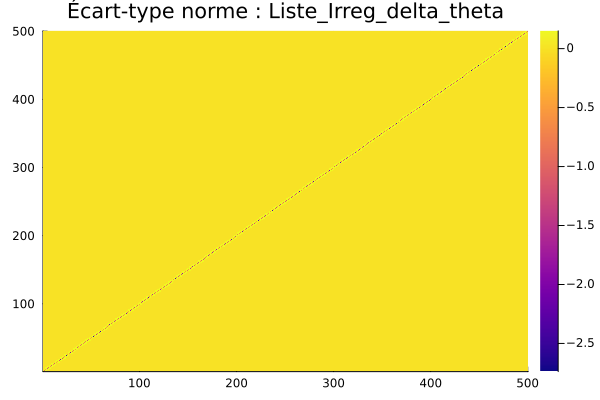

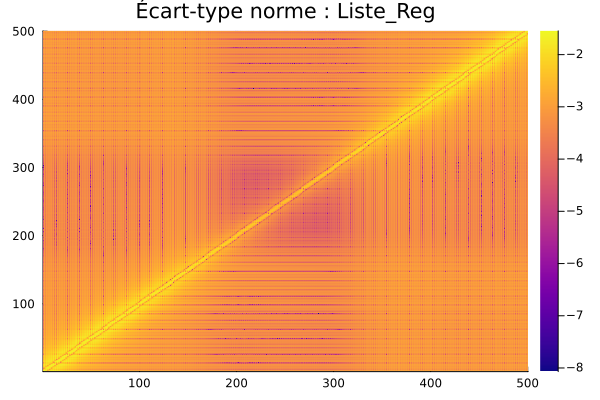

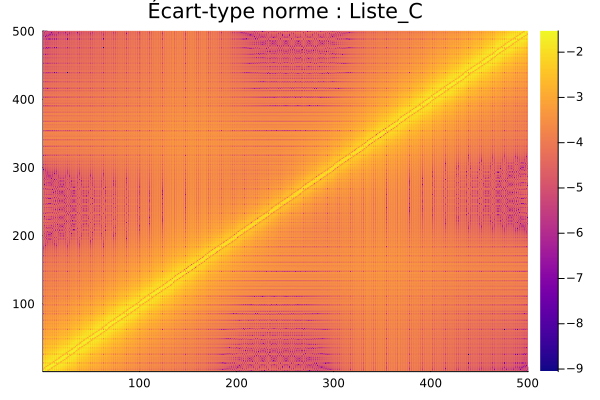

In [94]:
# 
noms_listes = ["Liste_Irreg_delta_theta", "Liste_Reg", "Liste_C"]
listes = [Liste_Irreg_delta_theta, Liste_Reg, Liste_C]
listes_reduites = [ [liste[1], liste[end]] for liste in listes ]
for (nom, liste) in zip(noms_listes, listes_reduites)
    std_mat = ecart_type_matrices(liste)
    mean_mat = moyenne_matrices(liste)
    #heatmap(std_mat, title="Écart-type : $nom", color=:plasma)
    #display(current())  # Pour forcer l'affichage dans certaines interfaces
    #heatmap(mean_mat, title="Moyenne : $nom", color=:plasma)
    #display(current())  # Pour forcer l'affichage dans certaines interfaces
    #heatmap(std_mat./(abs.(mean_mat).+ 1e-10), title="Écart-type norme : $nom", color=:plasma)
    #display(current())  # Pour forcer l'affichage dans certaines interfaces
    heatmap(log10.((std_mat.+ 1e-100)./(abs.(mean_mat).+ 1e-100)), title="Écart-type norme : $nom", color=:plasma)
    display(current())  # Pour forcer l'affichage dans certaines interfaces
    #p = plot(diag(std_mat./(abs.(mean_mat).+ 1e-10)), title=@sprintf(" diagi T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
    #display(p)
    #p = plot(antidiag(std_mat./(abs.(mean_mat).+ 1e-10)) , title=@sprintf(" antdiagi T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="theta", ylabel="Valeur")
    #display(p)
end

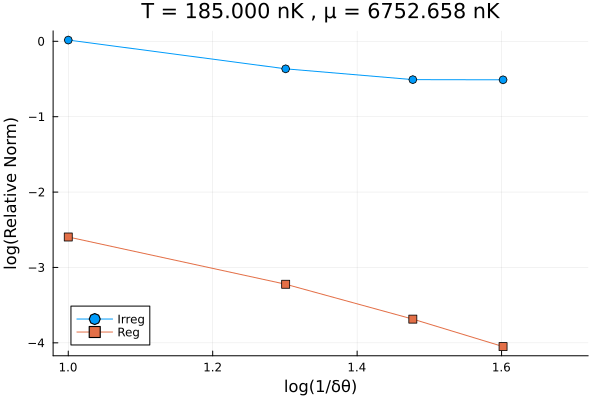

In [96]:
# Convergence des la techieque de Jérome 


using Plots

# Axe X : log(1/δθ)
xvals = log10.(1.0 ./ Compar_delta_theta)

# Axe Y pour Irreg
y_irreg = log10.([norm(Liste_Irreg_delta_theta[i] .- Liste_Irreg_delta_theta[end]) / norm(Liste_Irreg_delta_theta[end])
                  for i in 1:length(Compar_delta_theta)])#.+ 1e-100) 

# Axe Y pour Reg
y_reg = log10.([norm(Liste_Reg[i] .- Liste_Reg[end]) / norm(Liste_Reg[end])
                for i in 1:length(Compar_delta_theta)])#.+ 1e-100)

# Tracé
p = plot(xvals, y_irreg, marker=:o, label="Irreg", xlabel="log(1/δθ)", ylabel="log(Relative Norm)",
         title=@sprintf("T = %.3f nK , µ = %.3f nK", T, mu))
plot!(p, xvals, y_reg, marker=:square, label="Reg")

display(p)

In [ ]:
# tous les convergences 

display(p_com7)
display(p_com12)
display(p_com13)

In [ ]:
import Pkg
#Pkg.add("Dates")
using Dates

# Formater la date selon le format spécifié
new_date = Dates.format(Dates.today(), "yyyy-mm-dd")
new_date = "2025-02-23"
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

In [ ]:
import Pkg
#Pkg.add("Dates")
using Dates

# Formater la date selon le format spécifié
new_date = Dates.format(Dates.today(), "yyyy-mm-dd")
new_date = "2025-02-23"
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

In [ ]:
import Pkg
#Pkg.add("Dates")
using Dates

# Formater la date selon le format spécifié
new_date = Dates.format(Dates.today(), "yyyy-mm-dd")
new_date = "2025-02-23"
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

In [ ]:
import Pkg
#Pkg.add("Dates")
using Dates

# Formater la date selon le format spécifié
new_date = Dates.format(Dates.today(), "yyyy-mm-dd")
new_date = "2025-02-23"
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

In [ ]:
import Pkg
#Pkg.add("Dates")
using Dates

# Formater la date selon le format spécifié
new_date = Dates.format(Dates.today(), "yyyy-mm-dd")
new_date = "2025-02-23"
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

In [ ]:
display(p_com9)
display(p_com10)
display(p_com11)

In [ ]:
display(p_com14)
display(p_com15)
display(p_com16)
display(p_com17)
display(p_com18)
display(p_com19)
display(p_com20)
display(p_com21)
display(p_com22)
display(p_com23)



In [ ]:
display(p_com24)
display(p_com25)
display(p_com26)

In [ ]:
#display(p_com1) # La diagonale 

In [ ]:
display(p_com2) # La diagonale * δθ

In [ ]:
#display(p_com3) # (La diagonale (inv_A - f_ireg) )* δθ

In [ ]:
display(p_com4) # convergence inv_A(n) - inv_A(n-1)

In [ ]:
display(p_com5) # antidiag inv_A

In [ ]:
#display(p_com6) # antidiag inv_A - f_reg 

In [ ]:
display(p_com7) # norme hors diagonale

In [ ]:
#display(p_com8) # (La diagonale (inv_A1 - f_ireg) )* δθ

In [ ]:
display(p_com9) # diage ∂θ * inv-A 

In [ ]:
display(p_com10) # antdiage  inv-A 

In [ ]:
display(p_com11) # diage ∂θ * inv-A1 

In [ ]:
display(p_com12) # norme compare diag inv_A - 

In [ ]:
display(p_com13)

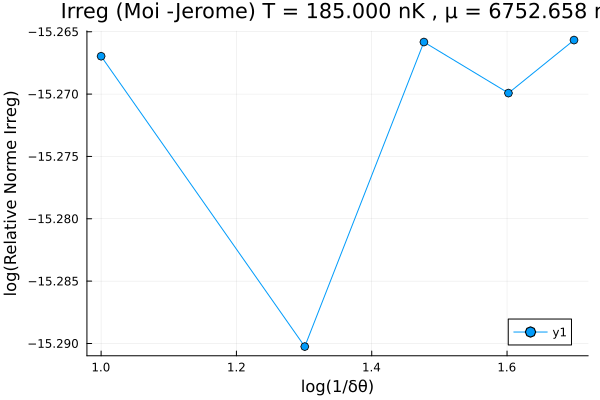

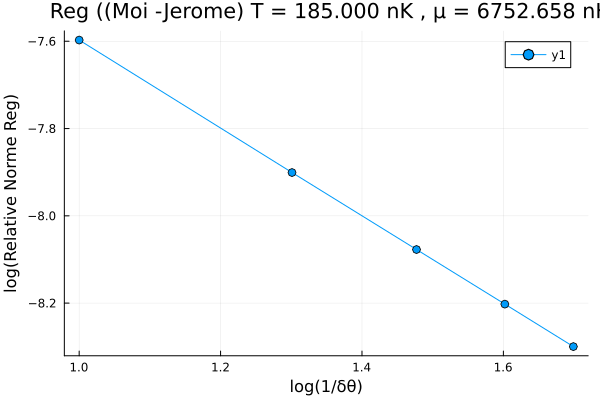

In [97]:
p_com27 = plot(title=@sprintf(" Irreg (Moi -Jerome) T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="log(1/δθ)", ylabel="log(Relative Norme Irreg)")
plot!(p_com27,log.(1.0 ./ Compar_delta_theta)./log(10), log.(Norm_Irreg)./log(10),   marker=:o)
display(p_com27)

p_com28 = plot(title=@sprintf(" Reg ((Moi -Jerome) T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="log(1/δθ)", ylabel="log(Relative Norme Reg)")
plot!(p_com28,log.(1.0 ./ Compar_delta_theta)./log(10), log.(Norm_Reg)./log(10),   marker=:o)
display(p_com28)

In [ ]:
#display(p_com1)
display(p_com2)
display(p_com3)
display(p_com8)

p_com4 = plot(title=@sprintf("Compare T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="- Log(δθ)", ylabel="Valeur")
plot!(p_com4,-log.(Compar_delta_theta[2:end])/log(10), Compar_Norm[2:end],   marker=:o)
display(p_com4)

display(p_com5)
display(p_com6)

p_com7 = plot(title=@sprintf("Compare T = %.3f nK , µ = %.3f nK", T, mu ), xlabel="1/δθ", ylabel="Norme G")
plot!(p_com7,1.0 ./ Compar_delta_theta, Compar_Norm_G,   marker=:o)
display(p_com7)
println(Compar_Norm_G)

In [ ]:
using Plots
#Pkg.add("PyPlot")
pyplot()  # Pour un rendu proche de Matplotlib
using LinearAlgebra

function plot_heatmap_with_cuts(A::Array{Float64,2}, x::Vector{Float64}; cut_row_index::Int=div(size(A,1),2), cut_column_index::Int=div(size(A,2),2))
    normalisation = size(A,1) / (3 * maximum(abs.(A))) * 0.5

    #heatmap(A, color=:inferno, aspect_ratio=1, legend=false, xlabel="θ (μm/ms)", ylabel="θ (μm/ms)", title="Heatmap of A⁻¹", titlefontsize=20, xrotation=0)
    #colorbar!(fontsize=15)
    heatmap(
        A,
        color=:inferno,
        aspect_ratio=1,
        xlabel="θ (μm/ms)",
        ylabel="θ (μm/ms)",
        title="Heatmap of A⁻¹",
        titlefontsize=20,
        xrotation=0,
        colorbar_title="Amplitude",
        colorbar_titlefontsize=15,
        colorbar_tickfontsize=12
    )
    
    # Coupe horizontale
    plot!(1:size(A,2), cut_row_index .+ A[cut_row_index, :] .* normalisation, color="white", linewidth=2)
    plot!(1:size(A,2),[cut_row_index for _ in 1:size(A,2)],  linestyle=:dot, color="white", linewidth=0.1)
    
    # Coupe verticale
    plot!(cut_column_index .+ A[:, cut_column_index] .* normalisation, 1:size(A,2), color="white", linewidth=2)
    plot!([cut_column_index for _ in 1:size(A,1)], 1:size(A,2),  linestyle=:dot, color="white", linewidth=0.1)

    # Fonctions de rotation
    function rot_x(x, y, x0, y0, θ)
        return x0 + (x - x0) * cos(θ) / abs(cos(θ)) - (y - y0) * sin(θ) / abs(cos(θ))
    end

    function rot_y(x, y, x0, y0, θ)
        return y0 + (x - x0) * sin(θ) / abs(sin(θ)) + (y - y0) * cos(θ) / abs(sin(θ))
    end

    # Diagonale
    θ = π / 4
    rotated_x = [rot_x(i, A[i,i] * normalisation, 0, 0, θ) for i in 1:size(A,1)]
    rotated_y = [rot_y(i, A[i,i] * normalisation, 0, 0, θ) for i in 1:size(A,1)]
    plot!(rotated_x, rotated_y, color="white", linewidth=2)

    base_diag_x = [rot_x(i, 0, 0, 0, θ) for i in 1:size(A,1)]
    base_diag_y = [rot_y(i, 0, 0, 0, θ) for i in 1:size(A,1)]
    plot!(base_diag_x, base_diag_y, linestyle=:dot, color="white", linewidth=0.1)

    # Antidiagonale
    θ = -π / 4
    rotated_x = [rot_x(i, A[i,end - i + 1] * normalisation, size(A,1)-1, 0, θ) for i in 1:size(A,1)]
    rotated_y = [rot_y(i, A[i,end - i + 1] * normalisation, size(A,2)-1, 0, θ) for i in 1:size(A,1)]
    plot!(rotated_x, rotated_y, color="white", linewidth=2)

    base_anti_x = [rot_x(i, 0, size(A,1)-1, 0, θ) for i in 1:size(A,1)]
    base_anti_y = [rot_y(i, 0, size(A,2)-1, 0, θ) for i in 1:size(A,1)]
    plot!(base_anti_x, base_anti_y, linestyle=:dot, color="white", linewidth=0.1)

    # Axes et labels
    xticks!([1, size(A,1)], [@sprintf("%.2f", x[1]), @sprintf("%.2f", x[end])])
    yticks!([1, size(A,1)], [@sprintf("%.2f", x[1]), @sprintf("%.2f", x[end])])
    xlims!(1, size(A,1))
    ylims!(1, size(A,2))

    savefig("fluctu.png")
end


In [ ]:
A1, A2, A3, A , inv_A , inv_A10, Critere_Neuman = save_A_inv0(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )

In [ ]:
plot_heatmap_with_cuts(Critere_Neuman, theta_discr ; cut_row_index=500, cut_column_index= 1500)

In [ ]:
plot_heatmap_with_cuts(A1, theta_discr)

In [ ]:
plot_heatmap_with_cuts(A2, theta_discr)

In [ ]:
plot_heatmap_with_cuts(A3, theta_discr)

In [ ]:
plot_heatmap_with_cuts(A, theta_discr)

In [ ]:
inv_A = inv(A)
plot_heatmap_with_cuts(inv_A, theta_discr)

In [ ]:
plot_heatmap_with_cuts(log(inv_A), theta_discr)

In [ ]:
A_plot = copy(inv_A)
for i in 1:min(size(A)...)
    A_plot[i, i] = 1e-7  # ou 0.0000001
end

plot_heatmap_with_cuts(A_plot, theta_discr)

## À \mu constant 

9.994062659754997
-1.3419999999999999
⚗️🧪🔋 Calule de µ 
Any[(-1.3419999999999999, 0.6999999999999998, 5), (-1.3419999999999999, 0.8555555555555555, 5), (-1.3419999999999999, 1.011111111111111, 5), (-1.3419999999999999, 1.1666666666666667, 5), (-1.3419999999999999, 1.3222222222222222, 5), (-1.3419999999999999, 1.4777777777777776, 5), (-1.3419999999999999, 1.6333333333333333, 5), (-1.3419999999999999, 1.7888888888888888, 5), (-1.3419999999999999, 1.9444444444444446, 5), (-1.3419999999999999, 2.1, 5)]
(-1.3419999999999999, 0.6999999999999998, 5)
-1.3419999999999999
save_A_inv0 🌡️🔥❄️ T = 0.053 nK ,  ⚗️🧪🔋 µ = 23.755 nK


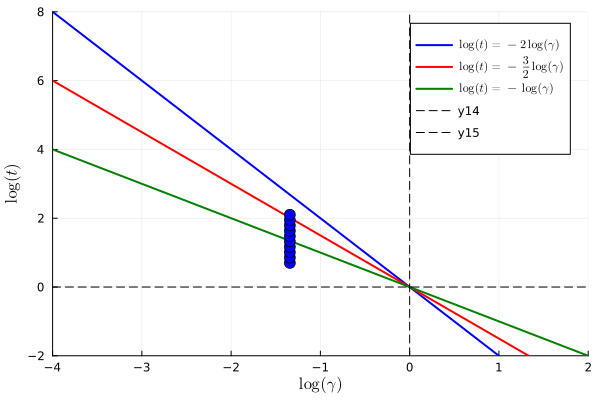

In [55]:
new_date  = "2025-06-25" 

n_p = f_n(10^-1.342 , gbar )#60
println(n_p)
log_gamma = log(f_gamma( n_p , gbar ))/log(10)
println(log_gamma)


function generate_points(log_gamma, points_data)
    points = []
    for data in points_data
        y = data[1] * log_gamma  # Calcul du y à partir de la fonction associée
        z = data[2]  # La valeur de z
        push!(points, (log_gamma, y, z))  # Ajouter le point sous forme de tuple
    end
    return points
end

# Génération de 10 points pour y entre -0.85 et -1
y_values = range(0.7/log_gamma, stop=2.1/log_gamma, length=10)

# Liste des points avec x constant
points_data = [(y_value, 5) for y_value in y_values]

# Choisir une valeur constante pour log_gamma
#log_gamma = 1.0  # Exemple de valeur pour log_gamma

# Appel de la fonction pour générer des points
Points = generate_points(log_gamma, points_data)



# calcul de mu(n_p, T)   
mu = nothing
if mu == nothing
    println("⚗️🧪🔋 Calule de µ ")
    mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
    println(Points)
    println(Points[1])
    println(Points[1][1])
    T = f_T(10^Points[1][1] , gbar )
    mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
end

println(@sprintf("save_A_inv0 🌡️🔥❄️ T = %.3f nK ,  ⚗️🧪🔋 µ = %.3f nK", T, mu))

mu = nothing
plot_graph([(x, y) for (x, y, _) in Points], nothing )


 🔧 Paramètre: log(γ) = -1.342, log(t) = 0.700
🏎️ θ max = 3.985 µm/ms 
⚗️🧪🔋 Calule de µ 
🌡️🔥❄️ T = 5.797 nK ,  ⚗️🧪🔋 µ = 23.804 nK , 📈🧵📏 n = 9.994 (μm)^{-1}
✅ saved : 2025-06-25/theta_discr_3.985_1000.000.npz
✅ =================Le fichier existe déjà, chargement des matrices... =======================
✅ On ne recalcule pas l'inverse 
🔲 Verifiecation de la symetrie
✅ A est symetrique
✅ saved : 2025-06-25/theta_discr_3.985_1000.000.npz
✅ ================= Calcule Jerome dejais fais : Le fichier existe déjà, chargement des matrices... =======================
🔲 Verifiecation de la symetrie Jérome 
❌ A n'est pas symetrique
🔲 Norme de de la projection sur Sn sur Norme de A 
📊 🔵 / 🏁 Norme Frobenius :  norm(A-B)/norm(A) = 1.0
📊 ➕ / 🏙️ Norme L1 :  norm(A-B)/norm(A) = 1.0
📊 🔵 / 🏁 Norme L2 :  norm(A-B)/norm(A) = 1.0
📊 ⏳ / 🔝 Norme de l'infini :  norm(A-B)/norm(A) = 1.0
🔳 Norme de de la projection sur An sur Norme de A 
📊 🔵 / 🏁 Norme Frobenius :  norm(A-B)/norm(A) = 8.648036116859781e-17
📊 ➕ / 🏙️ No

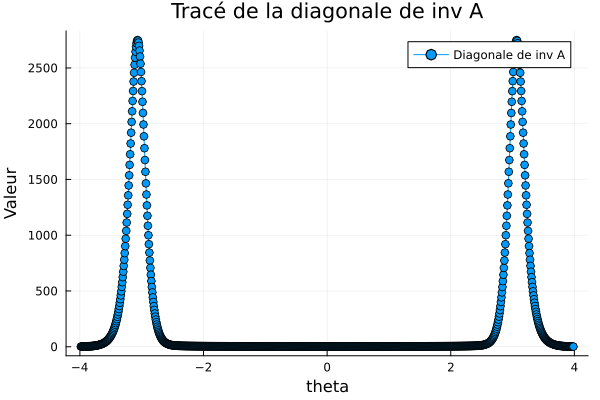

🌡️🔥❄️ T = 5.797 nK ,  ⚗️🧪🔋 µ = 23.804 nK , 📈🧵📏 n__p = 9.994 (μm)^{-1}
🌡️🔥❄️ T = 5.797 nK ,  ⚗️🧪🔋 µ = 23.804 nK
✅ fluctu_N1 existe déjà, chargement ...
✅ fluctu_N2  existe déjà, chargement ...
🌊 ⚛️ fluctu N1 = 2.36899e+02 , fluctu N2 = 2.36483e+02
✅ fluctu_E_minus_muN1 existe déjà, chargement ...
✅ fluctu_E_minus_muN2 existe déjà, chargement ...
 🌊 ⚡ fluctu E_minus_muN1 = 3.08133e-49 , fluctu E_minus_muN2 = 8.25060e-49

 🔧 Paramètre: log(γ) = -1.342, log(t) = 0.856
🏎️ θ max = 4.431 µm/ms 
⚗️🧪🔋 Calule de µ 
🌡️🔥❄️ T = 8.294 nK ,  ⚗️🧪🔋 µ = 23.874 nK , 📈🧵📏 n = 9.994 (μm)^{-1}
✅ saved : 2025-06-25/theta_discr_4.431_1000.000.npz
🧠 ⚡ 🔥 🚀 ===================Calcul des matrices... =======================
✅ saved : 2025-06-25/theta_discr_4.431_1000.000.npz
  0.038528 seconds (5.74 k allocations: 22.326 MiB)
✅ saved : 2025-06-25/nu_discr_23.874_8.294_4.431_1000.000.npz
  0.028849 seconds (37 allocations: 45.815 MiB, 6.45% gc time)
✅ saved : 2025-06-25/rho_s_discr_23.874_8.294_4.431_1000.000.npz
  

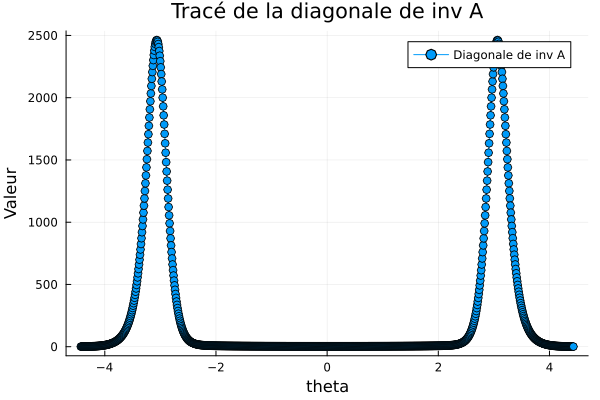

🌡️🔥❄️ T = 8.294 nK ,  ⚗️🧪🔋 µ = 23.874 nK , 📈🧵📏 n__p = 9.994 (μm)^{-1}
🌡️🔥❄️ T = 8.294 nK ,  ⚗️🧪🔋 µ = 23.874 nK
🧠 ⚡ 🔥 🚀 Calcul de fluctu_N2 ...
✅ saved : 2025-06-25/fluctu_N1_23.874_8.294_100.000_4.431_1000.000.npz
🧠 ⚡ 🔥 🚀 Calcul de fluctu_N2 ...
beta_charge [1.0 -0.0 -0.0]
 🧠 Progression: 100.0%
 🏁 Calcul terminé!
✅ saved : 2025-06-25/fluctu_N2_23.874_8.294_100.000_4.431_1000.000.npz
🌊 ⚛️ fluctu N1 = 3.40262e+02 , fluctu N2 = 3.38729e+02
🧠 ⚡ 🔥 🚀 Calcul de fluctu_E_minus_muN1 ...
✅ saved : 2025-06-25/fluctu_E_minus_muN1_23.874_8.294_100.000_4.431_1000.000.npz
🧠 ⚡ 🔥 🚀 Calcul de fluctu_E_minus_muN2 ...
beta_charge [-3.296098611504271e-25 0.0 1.44e-25]
 🧠 Progression: 100.0%
 🏁 Calcul terminé!
✅ saved : 2025-06-25/fluctu_E_minus_muN2_23.874_8.294_100.000_4.431_1000.000.npz
 🌊 ⚡ fluctu E_minus_muN1 = 8.65011e-49 , fluctu E_minus_muN2 = 1.50714e-48

 🔧 Paramètre: log(γ) = -1.342, log(t) = 1.011
🏎️ θ max = 4.877 µm/ms 
⚗️🧪🔋 Calule de µ 
🌡️🔥❄️ T = 11.866 nK ,  ⚗️🧪🔋 µ = 24.006 nK , 📈🧵📏 n = 9.99

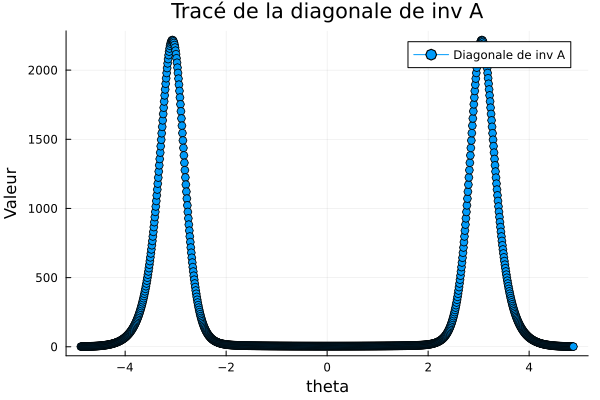

🌡️🔥❄️ T = 11.866 nK ,  ⚗️🧪🔋 µ = 24.006 nK , 📈🧵📏 n__p = 9.994 (μm)^{-1}
🌡️🔥❄️ T = 11.866 nK ,  ⚗️🧪🔋 µ = 24.006 nK
🧠 ⚡ 🔥 🚀 Calcul de fluctu_N2 ...
✅ saved : 2025-06-25/fluctu_N1_24.006_11.866_100.000_4.877_1000.000.npz
🧠 ⚡ 🔥 🚀 Calcul de fluctu_N2 ...
beta_charge [1.0 -0.0 -0.0]
 🧠 Progression: 100.0%
 🏁 Calcul terminé!
✅ saved : 2025-06-25/fluctu_N2_24.006_11.866_100.000_4.877_1000.000.npz
🌊 ⚛️ fluctu N1 = 4.90504e+02 , fluctu N2 = 4.87302e+02
🧠 ⚡ 🔥 🚀 Calcul de fluctu_E_minus_muN1 ...
✅ saved : 2025-06-25/fluctu_E_minus_muN1_24.006_11.866_100.000_4.877_1000.000.npz
🧠 ⚡ 🔥 🚀 Calcul de fluctu_E_minus_muN2 ...
beta_charge [-3.31433854727271e-25 0.0 1.44e-25]
 🧠 Progression: 100.0%
 🏁 Calcul terminé!
✅ saved : 2025-06-25/fluctu_E_minus_muN2_24.006_11.866_100.000_4.877_1000.000.npz
 🌊 ⚡ fluctu E_minus_muN1 = 2.40167e-48 , fluctu E_minus_muN2 = 3.06606e-48

 🔧 Paramètre: log(γ) = -1.342, log(t) = 1.167
🏎️ θ max = 5.323 µm/ms 
⚗️🧪🔋 Calule de µ 
🌡️🔥❄️ T = 16.977 nK ,  ⚗️🧪🔋 µ = 24.259 nK , 📈🧵📏 n =

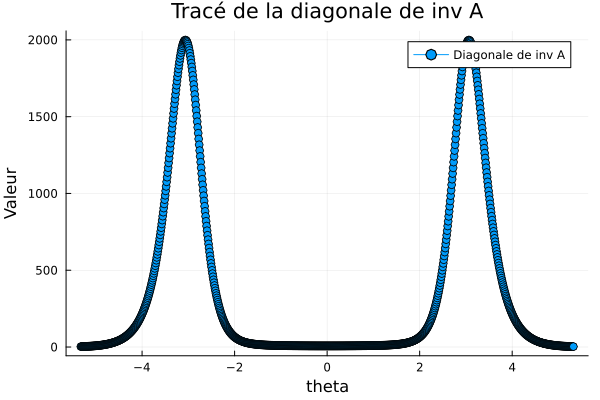

🌡️🔥❄️ T = 16.977 nK ,  ⚗️🧪🔋 µ = 24.259 nK , 📈🧵📏 n__p = 9.994 (μm)^{-1}
🌡️🔥❄️ T = 16.977 nK ,  ⚗️🧪🔋 µ = 24.259 nK
🧠 ⚡ 🔥 🚀 Calcul de fluctu_N2 ...
✅ saved : 2025-06-25/fluctu_N1_24.259_16.977_100.000_5.323_1000.000.npz
🧠 ⚡ 🔥 🚀 Calcul de fluctu_N2 ...
beta_charge [1.0 -0.0 -0.0]
 🧠 Progression: 100.0%
 🏁 Calcul terminé!
✅ saved : 2025-06-25/fluctu_N2_24.259_16.977_100.000_5.323_1000.000.npz
🌊 ⚛️ fluctu N1 = 7.12951e+02 , fluctu N2 = 7.05096e+02
🧠 ⚡ 🔥 🚀 Calcul de fluctu_E_minus_muN1 ...
✅ saved : 2025-06-25/fluctu_E_minus_muN1_24.259_16.977_100.000_5.323_1000.000.npz
🧠 ⚡ 🔥 🚀 Calcul de fluctu_E_minus_muN2 ...
beta_charge [-3.3492893273216956e-25 0.0 1.44e-25]
 🧠 Progression: 100.0%
 🏁 Calcul terminé!
✅ saved : 2025-06-25/fluctu_E_minus_muN2_24.259_16.977_100.000_5.323_1000.000.npz
 🌊 ⚡ fluctu E_minus_muN1 = 6.66011e-48 , fluctu E_minus_muN2 = 6.92410e-48

 🔧 Paramètre: log(γ) = -1.342, log(t) = 1.322
🏎️ θ max = 5.770 µm/ms 
⚗️🧪🔋 Calule de µ 
🌡️🔥❄️ T = 24.289 nK ,  ⚗️🧪🔋 µ = 24.746 nK , 📈🧵📏 n

In [ ]:
list_log_gamma = []
list_log_t = []
FLUC_N1 = []
FLUC_N2 = []
FLUC_E_minus_muN1  = []
FLUC_E_minus_muN2  = []

Points2 = [] 

for point in Points 
    log_gam , log_t ,theta_max = point
    println(@sprintf("\n 🔧 Paramètre: log(γ) = %.3f, log(t) = %.3f", log_gam, log_t))
    theta_max =  1.1*f_theta_max(log_gam,log_t)

    if theta_max > 50
        theta_max = 50 
    end 

    println(@sprintf("🏎️ θ max = %.3f µm/ms ", theta_max))
    
    mu = nothing
    #n_p = f_n(10^log_gam , gbar )
    T = f_T(10^log_t , gbar )

    # calcul de mu(n_p, T)     
    if mu == nothing
        println("⚗️🧪🔋 Calule de µ ")
        mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
        mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
    end

    println(@sprintf("🌡️🔥❄️ T = %.3f nK ,  ⚗️🧪🔋 µ = %.3f nK , 📈🧵📏 n = %.3f (μm)^{-1}", T, mu , f_n(10^log_gam , gbar )))
    
    #mup = mu * kB
    
    Taille = 100
    
    npts = 1000#round(Int , theta_max * 100)

    A1, A2, A3, A , inv_A = save_A_inv0(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    #A1, A2, A3, inv_A, inv_A1 , F , inv_A_approx, inv_A_approx_ordre = save_Fluctu_rho(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    #A1,  inv_A1 , F , inv_A_approx, = save_Fluctu_rho_rapide(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )

    theta_discr = npzread(@sprintf "%s/theta_discr_%.3f_%.3f.npz" new_date Float64(theta_max) Float64(npts))

    nom = "inv-A"
    inv_A = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mu T Taille Float64(theta_max) Float64(npts) )
    #nom = "inv-A-approx"
    #inv_A_approx = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts) )
    #nom = "inv-A-approx-ordre"
    #inv_A_approx_ordre = npzrf = f_interp.(theta_discr', theta_discr)
    #f = [f_interp(theta_discr[a], theta_discr[b]) for a in 1:L, b in 1:L]ead( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts) )
    
    p = plot(theta_discr, diag(inv_A), label="Diagonale de inv A", title="Tracé de la diagonale de inv A", xlabel="theta", ylabel="Valeur", marker=:o)
    #plot!(p, theta_discr, diag(inv_A_approx), label="Diagonale de inv A approx", xlabel="theta", ylabel="Valeur", marker=:o)
    #plot!(p, theta_discr, diag(inv_A_approx_ordre), label="Diagonale de inv A approx ordre", xlabel="theta", ylabel="Valeur", marker=:o)
    display(p)


    beta = [-mu/T 0 mass/(kB*T)] 
    n_discr = yangyang(gbar,beta, theta_discr)    
    n__p = mass/hbar * charge_density(gbar, theta_discr , n_discr , ones(size(theta_discr)[1]) , [1 0 0] ) 

    println(@sprintf("🌡️🔥❄️ T = %.3f nK ,  ⚗️🧪🔋 µ = %.3f nK , 📈🧵📏 n__p = %.3f (μm)^{-1}", T, mu, n__p))

    push!(list_log_t, log_t)
    log_gam = log(f_gamma( n__p , gbar ))/log(10)
    push!(list_log_gamma, log_gam)

    fluctu_N1 , fluctu_N2 ,  fluctu_E_minus_muN1 , fluctu_E_minus_muN2 = Fluct_test( new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar ) 
    
    push!(FLUC_N1, fluctu_N1)
    push!(FLUC_N2, fluctu_N2)
    push!(FLUC_E_minus_muN1, fluctu_E_minus_muN1 )
    push!(FLUC_E_minus_muN2, fluctu_E_minus_muN2 )
    push!(Points2, (log_gam , log_t , mu)  )
    
end 

In [ ]:
plot_graph([(x, y) for (x, y , _ ) in Points2], nothing )

In [ ]:
plot_graph([(x, y) for (x, y , _ ) in Points2], [(x, y) for (x, y , z ) in Points2 if y<2] )

In [ ]:
typeof(FLUC_N1)
#eltype(FLUC_N1)
println(FLUC_N1)

In [ ]:
using NPZ

nom  = "Points_2"
filename = @sprintf "%s/%s.npz" new_date nom
# Conversion du vecteur de tuples en une matrice 2D (chaque ligne = un point)
P = reduce(hcat, [[x, y, z] for (x, y , z ) in Points2])'
#println(Points2) 
#println(P)
npzwrite(filename, P)

nom  = "FLUC_N1_2"
filename = @sprintf "%s/%s.npz" new_date nom
println(FLUC_N1)
P = reduce(hcat, [ x for x in FLUC_N1])'
println(P)
npzwrite(filename, P)

nom  = "FLUC_N2_2"
filename = @sprintf "%s/%s.npz" new_date nom
P = reduce(hcat, [ x for x in FLUC_N2])'
#println(P)
npzwrite(filename, P)

nom  = "FLUC_E_minus_muN1_2"
filename = @sprintf "%s/%s.npz" new_date nom
P = reduce(hcat, [ x for x in FLUC_E_minus_muN1])'
#println(P)
npzwrite(filename, P)

nom  = "FLUC_E_minus_muN2_2"
filename = @sprintf "%s/%s.npz" new_date nom
P = reduce(hcat, [ x for x in FLUC_E_minus_muN2])'
npzwrite(filename, P)


In [ ]:
using Plots
#import Pkg; Pkg.add("Images")
using Images

function plot_and_save_graphs(new_date, list_log_t, FLUC_N1, FLUC_N2, FLUC_E_minus_muN1, FLUC_E_minus_muN2, log_t_min = 2 , log_t_max = 6 )
    
    
     
    
    # Filtrer les indices qui respectent l'intervalle
    indices = findall(log_t -> log_t_min <= log_t <= log_t_max, list_log_t)
    
    # Appliquer le filtrage
    list_logt_filtered = list_logt[indices]
    FLUC_N1_filtered = FLUC_N1[indices]
    FLUC_N2_filtered = FLUC_N2[indices]
    FLUC_E_minus_muN1_filtered = FLUC_E_minus_muN1[indices]
    FLUC_E_minus_muN2_filtered = FLUC_E_minus_muN2[indices]

    # Conversion en Float64 si nécessaire et affichage des valeurs en notation scientifique
    println("list_logt: ", join(@sprintf("%.3e , ", Float64(x)) for x in list_logt_filtered))
    println("FLUC_N1: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_N1_filtered))
    println("FLUC_N2: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_N2_filtered))
    println("FLUC_E_minus_muN1: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_E_minus_muN1_filtered))
    println("FLUC_E_minus_muN2: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_E_minus_muN2_filtered))


    
    # Vérifier les valeurs
    println("Bornes de list_logt_filtered : ", extrema(list_logt_filtered))
    
    # Tracé de FLUC_N1 et FLUC_N2
    p1 = plot(list_logt_filtered, FLUC_N1_filtered, label=L"N_1", lw=2, markershape=:circle , title = L"\langle N^2 \rangle, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma) )
    plot!(p1, list_logt_filtered, FLUC_N2_filtered, label=L"N_2", lw=2, markershape=:square  , ylabel=L"\langle N^2 \rangle")
    
    # Tracé de FLUC_E_minus_muN1 et FLUC_E_minus_muN2
    p2 = plot(list_logt_filtered, FLUC_E_minus_muN1_filtered, label=L"E_1 - \mu N_1", lw=2, markershape=:diamond , title = L"\langle (E - \mu N)^2 \rangle, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma))
    plot!(p2, list_logt_filtered, FLUC_E_minus_muN2_filtered, label=L"E_2 - \mu N_2", lw=2, markershape=:utriangle , ylabel=L"\langle (E - \mu N)^2 \rangle")
    
    # Affichage des deux graphes dans une seule figure (layout 1x2)
    plot(p1, p2, layout=(1,2), xlabel=L"\log t ", size=(900,400))
    
    # Sauvegarde du graphique
    filename = @sprintf("%s/fluctuations_plot_log_gamma=%.3f.png" , new_date , log_gamma)  
    savefig(filename)
    println(@sprintf("Graphique sauvegardé sous '%s'" , filename ) )
    
    # Calcul du taux de variation relatif
    mask_N = FLUC_N1_filtered .!= 0
    mask_E = FLUC_E_minus_muN1_filtered .!= 0
    
    relative_N = zeros(length(FLUC_N1_filtered))
    relative_E = zeros(length(FLUC_E_minus_muN1_filtered))
    
    relative_N[mask_N] = (FLUC_N1_filtered[mask_N] .- FLUC_N2_filtered[mask_N]) ./ FLUC_N1_filtered[mask_N] 
    relative_E[mask_E] = (FLUC_E_minus_muN1_filtered[mask_E] .- FLUC_E_minus_muN2_filtered[mask_E]) ./ FLUC_E_minus_muN1_filtered[mask_E]
    
    # Tracé du taux de variation relatif
    p3 = plot(list_logt_filtered, relative_N * 100, label="Variation relative N", lw=2, markershape=:circle , title = L"\frac{\langle N^2_1 \rangle - \langle N^2_2 \rangle}{\langle N^2_1 \rangle} \times 100, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma))
    p4 = plot(list_logt_filtered, relative_E * 100, label="Variation relative E", lw=2, markershape=:diamond , title = L"\frac{\langle (E_1 - \mu N_1)^2 \rangle - \langle (E_2 - \mu N_2)^2 \rangle}{\langle (E_1 - \mu N_1)^2 \rangle} \times 100, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma))
    
    plot(p3, p4, xlabel=L"\log t ", ylabel=L"Pourcentage %" ,layout=(1,2), size=(900,400))
    
    # Sauvegarde du graphique relatif
    #savefig("$(new_date)/fluctuations_relativ_plot_$(log_gamma).png")
    #println("Graphique sauvegardé sous '$(new_date)/fluctuations_relativ_plot_$(log_gamma).png'")
    filename_r = @sprintf("%s/fluctuations_relativ_plot_log_gamma=%.3f.png" , new_date , log_gamma)  
    savefig(filename_r)
    println(@sprintf("Graphique sauvegardé sous '%s'" , filename_r ) )

    # Affichage de l'image sauvegardée
    img = Images.load(filename)
    display(img)
    img = Images.load(filename_r)
    display(img)
end

plot_and_save_graphs(new_date, list_log_t, FLUC_N1, FLUC_N2, FLUC_E_minus_muN1, FLUC_E_minus_muN2, 1 ,  4 )

Any[(-1.3420000003918462, 0.6999999999999998, 23.80435550210377), (-1.342000003003157, 1.3999999999999997, 25.115371267259377), (-1.3420000081555434, 2.1, 24.760118120032594)]
[0.6999999999999998, 1.3999999999999997, 2.1]
X: 7.000e-01 , 1.400e+00 , 2.100e+00 , 
FLUC_N1: 2.369e+02 , 1.274e+03 , 3.330e+03 , 
FLUC_N2: 2.365e+02 , 1.259e+03 , 3.576e+03 , 
FLUC_E_minus_muN1: 3.081e-49 , 2.968e-47 , 1.130e-45 , 
FLUC_E_minus_muN2: 8.251e-49 , 2.794e-47 , 1.182e-45 , 
X: 1.400e+00 , 2.100e+00 , 
FLUC_N1: 1.274e+03 , 3.330e+03 , 
FLUC_N2: 1.259e+03 , 3.576e+03 , 
FLUC_E_minus_muN1: 2.968e-47 , 1.130e-45 , 
FLUC_E_minus_muN2: 2.794e-47 , 1.182e-45 , 
Bornes de X_filtered : (1.3999999999999997, 2.1)
Graphique sauvegardé sous '2025-06-25/fluctuations_plot_log_gamma=-1.342.png'
Graphique sauvegardé sous '2025-06-25/fluctuations_relativ_plot_log_gamma=-1.342.png'


┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


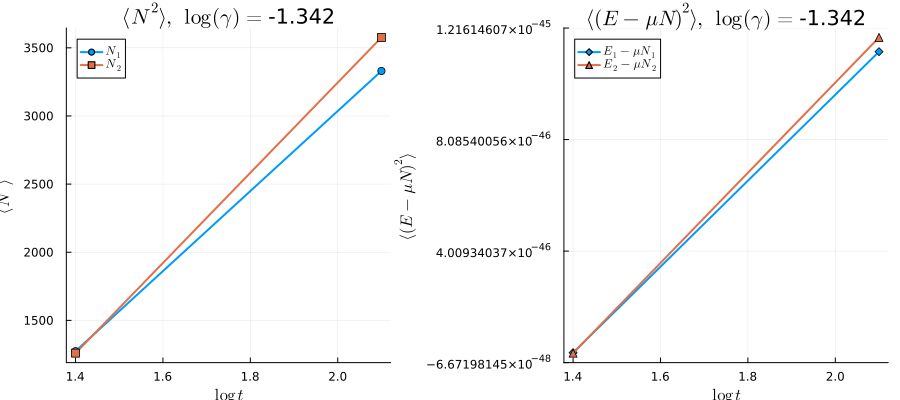

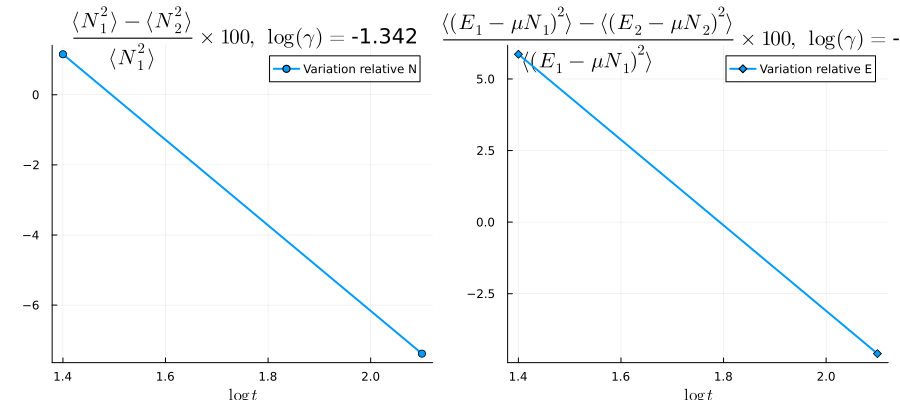

In [54]:
function plot_and_save_graphs(new_date, Points, FLUC_N1, FLUC_N2, FLUC_E_minus_muN1, FLUC_E_minus_muN2, indice_x , indice_const, min = 2 , max = 6 )
    
    
    if indice_x == 1 
        X = [x for (x, _ , _ ) in Points]
        xlabel = L"\log \gamma"
    elseif indice_x == 2
        X = [y for (_, y , _ ) in Points]
        xlabel = L"\log t"
    else 
        X = [z for (_, _ , z ) in Points]
        xlabel = L"\mu (nK)"
    end 

    println(Points) 
    println(X)

    println("X: ", join(@sprintf("%.3e , ", Float64(x)) for x in X))
    println("FLUC_N1: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_N1))
    println("FLUC_N2: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_N2))
    println("FLUC_E_minus_muN1: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_E_minus_muN1))
    println("FLUC_E_minus_muN2: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_E_minus_muN2))
    
    # Filtrer les indices qui respectent l'intervalle
    indices = findall(x -> min <= x <= max, X)
    
    # Appliquer le filtrage
    X_filtered = X[indices]
    FLUC_N1_filtered = FLUC_N1[indices]
    FLUC_N2_filtered = FLUC_N2[indices]
    FLUC_E_minus_muN1_filtered = FLUC_E_minus_muN1[indices]
    FLUC_E_minus_muN2_filtered = FLUC_E_minus_muN2[indices]

    # Conversion en Float64 si nécessaire et affichage des valeurs en notation scientifique
    println("X: ", join(@sprintf("%.3e , ", Float64(x)) for x in X_filtered))
    println("FLUC_N1: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_N1_filtered))
    println("FLUC_N2: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_N2_filtered))
    println("FLUC_E_minus_muN1: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_E_minus_muN1_filtered))
    println("FLUC_E_minus_muN2: ", join(@sprintf("%.3e , ", Float64(x)) for x in FLUC_E_minus_muN2_filtered))


    
    # Vérifier les valeurs
    println("Bornes de X_filtered : ", extrema(X_filtered))

    if indice_const == 1 
        log_gamma = Points[1][1] 
        titre1 = L"\langle N^2 \rangle, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma)
        titre2 = L"\langle (E - \mu N)^2 \rangle, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma)
        titre3 = L"\frac{\langle N^2_1 \rangle - \langle N^2_2 \rangle}{\langle N^2_1 \rangle} \times 100, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma)
        titre4 = L"\frac{\langle (E_1 - \mu N_1)^2 \rangle - \langle (E_2 - \mu N_2)^2 \rangle}{\langle (E_1 - \mu N_1)^2 \rangle} \times 100, ~ \log(\gamma) = " * @sprintf("%.3f", log_gamma)
    elseif indice_const == 2
        log_t = Points[1][2] 
        titre1 = L"\langle N^2 \rangle, ~ \log(t) = " * @sprintf("%.3f", log_t)
        titre2 = L"\langle (E - \mu N)^2 \rangle, ~ \log(t) = " * @sprintf("%.3f", log_t)
        titre3 = L"\frac{\langle N^2_1 \rangle - \langle N^2_2 \rangle}{\langle N^2_1 \rangle} \times 100, ~ \log(t) = " * @sprintf("%.3f", log_t)
        titre4 = L"\frac{\langle (E_1 - \mu N_1)^2 \rangle - \langle (E_2 - \mu N_2)^2 \rangle}{\langle (E_1 - \mu N_1)^2 \rangle} \times 100, ~ \log(t) = " * @sprintf("%.3f", log_t)
    else 
        mu = Points[1][3] 
        titre1 = L"\langle N^2 \rangle, ~ \log(t) = " * @sprintf("%.3f nK", mu)
        titre2 = L"\langle (E - \mu N)^2 \rangle, ~ \log(t) = " * @sprintf("%.3f nK", mu)
        titre3 = L"\frac{\langle N^2_1 \rangle - \langle N^2_2 \rangle}{\langle N^2_1 \rangle} \times 100, ~ \log(t) = " * @sprintf("%.3f nK", mu)
        titre4 = L"\frac{\langle (E_1 - \mu N_1)^2 \rangle - \langle (E_2 - \mu N_2)^2 \rangle}{\langle (E_1 - \mu N_1)^2 \rangle} \times 100, ~ \mu = " * @sprintf("%.3f nK", mu)
    end 

    
    # Tracé de FLUC_N1 et FLUC_N2
    p1 = plot(X_filtered, FLUC_N1_filtered, label=L"N_1", lw=2, markershape=:circle , title = titre1 )
    plot!(p1, X_filtered, FLUC_N2_filtered, label=L"N_2", lw=2, markershape=:square  , ylabel=L"\langle N^2 \rangle")
    
    # Tracé de FLUC_E_minus_muN1 et FLUC_E_minus_muN2
    p2 = plot(X_filtered, FLUC_E_minus_muN1_filtered, label=L"E_1 - \mu N_1", lw=2, markershape=:diamond , title = titre2)
    plot!(p2, X_filtered, FLUC_E_minus_muN2_filtered, label=L"E_2 - \mu N_2", lw=2, markershape=:utriangle , ylabel=L"\langle (E - \mu N)^2 \rangle")
    
    # Affichage des deux graphes dans une seule figure (layout 1x2)
    plot(p1, p2, layout=(1,2), xlabel=xlabel, size=(900,400))
    
    # Sauvegarde du graphique
    filename = @sprintf("%s/fluctuations_plot_log_gamma=%.3f.png" , new_date , log_gamma)  
    savefig(filename)
    println(@sprintf("Graphique sauvegardé sous '%s'" , filename ) )
    
    # Calcul du taux de variation relatif
    mask_N = FLUC_N1_filtered .!= 0
    mask_E = FLUC_E_minus_muN1_filtered .!= 0
    
    relative_N = zeros(length(FLUC_N1_filtered))
    relative_E = zeros(length(FLUC_E_minus_muN1_filtered))
    
    relative_N[mask_N] = (FLUC_N1_filtered[mask_N] .- FLUC_N2_filtered[mask_N]) ./ FLUC_N1_filtered[mask_N] 
    relative_E[mask_E] = (FLUC_E_minus_muN1_filtered[mask_E] .- FLUC_E_minus_muN2_filtered[mask_E]) ./ FLUC_E_minus_muN1_filtered[mask_E]
    
    # Tracé du taux de variation relatif
    p3 = plot(X_filtered, relative_N * 100, label="Variation relative N", lw=2, markershape=:circle , title = titre3)
    p4 = plot(X_filtered, relative_E * 100, label="Variation relative E", lw=2, markershape=:diamond , title = titre4)
    
    plot(p3, p4, xlabel=xlabel, ylabel=L"Pourcentage %" ,layout=(1,2), size=(900,400))
    
    # Sauvegarde du graphique relatif
    #savefig("$(new_date)/fluctuations_relativ_plot_$(log_gamma).png")
    #println("Graphique sauvegardé sous '$(new_date)/fluctuations_relativ_plot_$(log_gamma).png'")
    filename_r = @sprintf("%s/fluctuations_relativ_plot_log_gamma=%.3f.png" , new_date , log_gamma)  
    savefig(filename_r)
    println(@sprintf("Graphique sauvegardé sous '%s'" , filename_r ) )

    # Affichage de l'image sauvegardée
    img = Images.load(filename)
    display(img)
    img = Images.load(filename_r)
    display(img)
end

plot_and_save_graphs(new_date, Points2, FLUC_N1, FLUC_N2, FLUC_E_minus_muN1, FLUC_E_minus_muN2, 2, 1,  1 , 6 )
    

In [ ]:
using Pkg
#Pkg.add(["Plots", "LaTeXStrings"])
using Plots
using LaTeXStrings

n_p = 100
log_gamma = log(f_gamma( n_p , gbar ))/log(10)
println(log_gamma)

println(log(f_t( n_p , gbar ))/log(10))
log(exp(1))

Points = [
    (0.5 * log_gamma , 15 ),
    (0 , 15 ), 
    ( -0.5 * log_gamma , 15 ),
    (log(f_t( 100 , gbar ))/log(10) , 15 ),
    ( -log_gamma , 25 ), 
    ( (-1 - 3/2) / 2 * log_gamma , 30 ), 
    ( -3/2 * log_gamma , 50 ), 
    ( (-3/2 - 2) / 2 * log_gamma , 75), 
    ( -2 * log_gamma , 150 ), 
    ( -2.5 * log_gamma , 250 )
]

mu = 650
Points_r  = [(log(f_gamma( model_mu(f_T(10^x , gbar )*ones(1) , mu*kB/hbar*ones(1) )  , gbar ))/log(10) ,  x) for (x, _) in Points]

for (x, _) in Points
    fT_val = f_T(10^x, gbar)
    println("f_T(10^$x , $gbar ) = $fT_val")

    model_mu_val = model_mu(fT_val * ones(1), mu * kB / hbar * ones(1))
    println("model_mu(f_T(10^$x , $gbar ) * ones(1) , mu*kB/hbar*ones(1)) = $model_mu_val")

    log_val = log(f_gamma(model_mu_val, gbar)) / log(10)
    println("log(f_gamma(model_mu_val, gbar)) / log(10) = $log_val")

    println("-----------------------------")  # Pour séparer les valeurs entre chaque itération
end


println(Points_r)
plot_graph(Points_r)

In [ ]:
list_logt = []
FLUC_N1 = []
FLUC_N2 = []
FLUC_E_minus_muN1  = []
FLUC_E_minus_muN2  = []

for point in Points 
    log_t ,theta_max = point

    
    #n_p = f_n(10^log_gam , gbar )
    T = f_T(10^log_t , gbar )

    Taille = 100
    #if log_gam >= 0 
    #    theta_max = 1 #4*sqrt(10^log_gam)
    #else
    #    theta_max = 25 #2*pi*10^log_gam/(10^log_gam+2)
    #end 
    
    npts = Int(theta_max * 10)
    #npts = 1000

    A1, A2, A3, inv_A = save_A_inv0(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    #A1, A2, A3, inv_A, inv_A1 , F , inv_A_approx, inv_A_approx_ordre = save_Fluctu_rho(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    #A1,  inv_A1 , F , inv_A_approx, = save_Fluctu_rho_rapide(new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar )
    
    #println("npts :" , npts)
    #theta_discr = npzread(@sprintf "%s/theta_discr_%.3f_%.3f.npz" new_date Float64(theta_max) Float64(npts))

    #nom = "inv-A"
    #inv_A = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts) )
    #nom = "inv-A-approx"
    #inv_A_approx = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts) )
    #nom = "inv-A-approx-ordre"
    #inv_A_approx_ordre = npzread( @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Taille Float64(theta_max) Float64(npts) )
    
    #p = plot(theta_discr, diag(inv_A), label="Diagonale de inv A", title="Tracé de la diagonale de inv A", xlabel="theta", ylabel="Valeur", marker=:o)
    #plot!(p, theta_discr, diag(inv_A_approx), label="Diagonale de inv A approx", xlabel="theta", ylabel="Valeur", marker=:o)
    #plot!(p, theta_discr, diag(inv_A_approx_ordre), label="Diagonale de inv A approx ordre", xlabel="theta", ylabel="Valeur", marker=:o)
    
    #p = plot(theta_discr, diag(inv_A_approx) - diag(inv_A_approx_ordre), label="Diagonale de inv A", title="Tracé de la diagonale de inv A", xlabel="theta", ylabel="Valeur", marker=:o)
    #display(p)

    #p = plot(theta_discr, diag(inv_A_approx), label="Diagonale de inv A", title="Tracé de la diagonale de inv A", xlabel="theta", ylabel="Valeur", marker=:o)
    #display(p)
    
    #println("testetest")
    #Norme_relative(inv_A_approx , inv_A_approx_ordre ) 

    fluctu_N1 , fluctu_N2 ,  fluctu_E_minus_muN1 , fluctu_E_minus_muN2 = Fluct_test( new_date , theta_max ,npts ,  n_p  , mu , T ,  Taille ,   gbar ) 

    push!(list_logt, log_t)
    
    push!(FLUC_N1, fluctu_N1)
    push!(FLUC_N2, fluctu_N2)
    push!(FLUC_E_minus_muN1, fluctu_E_minus_muN1 )
    push!(FLUC_E_minus_muN2, fluctu_E_minus_muN2 )
    
    
end 


In [ ]:
plot_and_save_graphs(new_date, list_logt, FLUC_N1, FLUC_N2, FLUC_E_minus_muN1, FLUC_E_minus_muN2, 0 ,  6 )

In [ ]:
using Plots

println(list_logt)  
println(FLUC_N1 , FLUC_N2 , FLUC_E_minus_muN1 , FLUC_E_minus_muN2)  
println(extrema(list_logt))  # Vérifie les valeurs min et max
println(any(isnan, list_logt))  # Vérifie s'il y a des NaN
println(any(isinf, list_logt))  # Vérifie s'il y a des Inf

# Tracé de FLUC_N et FLUC_N2
p1 = plot(list_logt, FLUC_N1, label=L"\langle N1^2\rangle(\log (t) )", lw=2, markershape=:circle)
plot!(p1, list_logt, FLUC_N2, label=L"\text{FLUC}_N2", lw=2, markershape=:square)

# Tracé de FLUC_E_minus_muN et FLUC_E_minus_muN2
p2 = plot(list_logt, FLUC_E_minus_muN1, label=L"\langle (E - \mu N)^2\rangle(\log (t) )", lw=2, markershape=:diamond)
plot!(p2, list_logt, FLUC_E_minus_muN2, label=L"\text{FLUC}_{E - \mu N}2", lw=2, markershape=:utriangle) # Alternative correcte

# Affichage des deux graphes
plot(p1, p2, xlabel=L"\log t ", ylabel=L"\langle , \rangle", layout=(1,2), size=(900,400))


In [ ]:
t_min, t_max = 2, 6  # Ajuste ces bornes en fonction de tes données

# Filtrer les indices qui respectent l'intervalle
indices = findall(t -> t_min ≤ t ≤ t_max, list_logt)

# Appliquer le filtrage
list_logt_filtered = list_logt[indices]
FLUC_N1_filtered = FLUC_N1[indices]
FLUC_N2_filtered = FLUC_N2[indices]
FLUC_E_minus_muN1_filtered = FLUC_E_minus_muN1[indices]
FLUC_E_minus_muN2_filtered = FLUC_E_minus_muN2[indices]


In [ ]:
using Plots

# Vérifier si les valeurs sont correctes
println(extrema(list_logt_filtered))  # Vérifier les nouvelles bornes

# Tracé de FLUC_N1 et FLUC_N2
p1 = plot(list_logt_filtered, FLUC_N1_filtered, label=L"\langle N^2\rangle_1", lw=2, markershape=:circle)
plot!(p1, list_logt_filtered, FLUC_N2_filtered, label=L"\langle N^2\rangle_2", lw=2, markershape=:square)

# Tracé de FLUC_E_minus_muN1 et FLUC_E_minus_muN2
p2 = plot(list_logt_filtered, FLUC_E_minus_muN1_filtered, label=L"\langle (E - \mu N)^2\rangle_1", lw=2, markershape=:diamond)
plot!(p2, list_logt_filtered, FLUC_E_minus_muN2_filtered, label=L"\langle (E - \mu N)^2\rangle_2", lw=2, markershape=:utriangle)

# Affichage des deux graphes
plot(p1, p2, layout=(1,2),  xlabel=L"\log t ", ylabel=L"\langle , \rangle", size=(900,400))

In [ ]:
# Sauvegarde du graphique
savefig(@sprintf "%s/fluctuations_plot.png" new_date)
println("Graphique sauvegardé sous 'fluctuations_plot.png'")

In [ ]:
using Plots

# Vérifier si les valeurs sont correctes
println("Bornes de list_logt_filtered : ", extrema(list_logt_filtered))

# ⚠️ Éviter la division par zéro avec un masque
mask_N = FLUC_N1_filtered .!= 0
mask_E = FLUC_E_minus_muN1_filtered .!= 0

relative_N = zeros(length(FLUC_N1_filtered))
relative_E = zeros(length(FLUC_E_minus_muN1_filtered))

relative_N[mask_N] = (FLUC_N1_filtered[mask_N] .- FLUC_N2_filtered[mask_N]) ./ FLUC_N1_filtered[mask_N] 
relative_E[mask_E] = (FLUC_E_minus_muN1_filtered[mask_E] .- FLUC_E_minus_muN2_filtered[mask_E]) ./ FLUC_E_minus_muN1_filtered[mask_E]

# Tracé du taux de variation relatif
p3 = plot(list_logt_filtered, relative_N * 100, label=L"\frac{\langle N^2\rangle_1 - \langle N^2\rangle_2}{\langle N^2\rangle_1} (\log (t))", lw=2, markershape=:circle)
p4 = plot(list_logt_filtered, relative_E * 100, label=L"\frac{\langle (E - \mu N)^2\rangle_1 - \langle (E - \mu N)^2\rangle_2}{\langle (E - \mu N)^2\rangle_1} (\log (t))", lw=2, markershape=:diamond)

plot(p3, p4, xlabel=L"\log t ", ylabel=L"\%" ,layout=(1,2), size=(900,400))

In [ ]:
# Sauvegarde du graphique
savefig(@sprintf "%s/fluctuations_relativ_plot.png" new_date)
println("Graphique sauvegardé sous 'fluctuations_plot.png'")

In [ ]:



using Plots

# Utilisation de plotly pour rendre la heatmap interactive
gr()  # Utiliser le backend `gr` pour des graphiques interactifs (ou `plotly()` si tu veux plus d'interaction)


# Tracer la heatmap avec le backend GR
p = heatmap(inv_A, color=:inferno, title="Heatmap of A^{-1}", xlabel=L"\theta", ylabel=L"\theta", axis=:equal, size=(600, 600))

normalisation = 0.5 
# Sélectionner dynamiquement une ligne à couper (afficher les données pour cette ligne)
cut_row_index = Int(size(inv_A, 1)/2)  # Exemple de ligne à couper (coupe horizontale)
plot!(p, inv_A[cut_row_index, :].*normalisation .+ cut_row_index,1:size(inv_A, 2), label="Cut row", color=:white, linewidth=2)
plot!(p, ones(size(inv_A, 2)) .* cut_row_index,1:size(inv_A, 2), color=:white, linestyle=:dot, linewidth=1)

# Sélectionner dynamiquement une colonne à couper (afficher les données pour cette colonne)
cut_column_index = round(Int, size(inv_A, 2)*2/3) # Exemple de colonne à couper (coupe verticale)
plot!(p, 1:size(inv_A, 1),inv_A[:, cut_column_index].*normalisation .+ cut_column_index,  label="Cut column", color=:white, linewidth=2)
plot!(p, 1:size(inv_A, 1),ones(size(inv_A, 2)) .* cut_column_index,  color=:white, linestyle=:dot, linewidth=1)

# Diagonale + Antidiagonal


# Fonction de rotation autour du point (x0, y0)
rot_x = (x, y, x0, y0, theta) -> x0 + (x - x0) * cos(theta) /abs(cos(theta)) - (y - y0) * sin(theta)/abs(cos(theta))
rot_y = (x, y, x0, y0, theta) -> y0 + (x - x0) * sin(theta)/abs(sin(theta)) + (y - y0) * cos(theta)/abs(sin(theta))



theta = π / 4  # 45° en radians
rotated_x = [rot_x(i, inv_A[i, i].*normalisation + 1 , 1 , 1 ,    theta)[1] for i in 1:size(inv_A, 1)]
rotated_y = [rot_y(i, inv_A[i, i].*normalisation +1, 1 , 1 , theta)[1] for i in 1:size(inv_A, 1)]
plot!(p, rotated_x, rotated_y, label="Diagonal", color=:white, linewidth=2)

rotated_x = [rot_x(i, 1 , 1 ,  1, theta)[1] for i in 1:size(inv_A, 1)]
rotated_y = [rot_y(i, 1, 1 ,  1, theta)[1] for i in 1:size(inv_A, 2)]
plot!(p, rotated_x, rotated_y, color=:white, linestyle=:dot, linewidth=1)

theta = -π / 4  # 135 en radians
rotated_x = [rot_x(i, inv_A[i, size(inv_A, 2) - i + 1].*normalisation + 1 ,size(inv_A, 1) ,  1,  theta)[1] for i in 1:size(inv_A, 1)]
rotated_y = [rot_y(i, inv_A[i, size(inv_A, 2) - i + 1].*normalisation + 1,size(inv_A, 2) ,  1,  theta)[1] for i in 1:size(inv_A, 1)]
plot!(p, rotated_x, rotated_y, label="Diagonal", color=:white, linewidth=2)

rotated_x = [rot_x(i, 1 ,size(inv_A, 1) , 1, theta)[1] for i in 1:size(inv_A, 1)]
rotated_y = [rot_y(i, 1, size(inv_A, 2) , 1, theta)[1] for i in 1:size(inv_A, 1)]
plot!(p, rotated_x, rotated_y, color=:white, linestyle=:dot, linewidth=1)

#legend!(label="", position=:topright, fontsize=12, background_color=:white, border_color=:black)

display(p)

In [ ]:
using LsqFit
theta_max = 30
npts = 300


theta_discr = LinRange(-theta_max, theta_max , npts) 
nom = "theta_discr"
filename = @sprintf "%s/%s_%.3f_%.3f.npz" new_date nom Float64(theta_max) Float64(npts)
println("saved : ", filename)
npzwrite(filename, theta_discr)


    
# Afficher la date formatée
println(new_date)
#mup = 50 * kB
mu = nothing
n_p = 70#"None"
println(n_p)
T = 600 
Taille = 10 

function model_prel_mu_1(T,mu)
    #println(@sprintf "T = %.3f ,mu = %.3f " T mu)
    
    theta_discr_integrer = LinRange(-theta_max, theta_max, 600)
    mup = mu * kB
    beta = [-mup / (kB * T) 0 mass /(kB * T)]
    nu_discr = yangyang(gbar, beta, theta_discr)
    nu_fun = LinearInterpolation(theta_discr, nu_discr)
    thet2 , thet1 , npts_integral = theta_discr_integrer[1], theta_discr_integrer[600] , 600
    lam_discr = LinRange(thet2,thet1,npts_integral)
    nu_discr = nu_fun.(lam_discr)    
    densite = mass/hbar* charge_density(gbar, lam_discr, nu_discr, ones(size(lam_discr)[1]) )
    #println(densite)
    return densite
end

function model_mu_1(T,mu)
    
    OutDensite = 0*ones(size(T)[1])
    for i in 1:size(T)[1]
        #println(@sprintf "i =, T = %.3f ,mu = %.3f " i T[i] mu[i])
        OutDensite[i] = model_prel_mu(T[i],mu[i])
        #println("OutDensite = " ,OutDensite )
    end
    
    if 1 == 0                                                                    
        # Création du graphique
        p = plot(xlabel="mu", ylabel="densite", legend=:topright)
        # Ajout des points avec des marqueurs personnalisés
        plot!(p, mu, OutDensite, seriestype=:scatter, markersize=12, markerstrokewidth=2, markerstrokecolor=:DarkSlateGrey)
        # Affichage du graphique
        display(p)
    end
    
    #println(OutDensite)
    return OutDensite
    
end

println("mu = ", mu)
if mu == nothing
    println("mu is nothing")
    mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
    println("mu = ", mu)
    mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
end
     
println("mu = ", mu)
println("T = ", T) 

print("Taille = ", Taille)
println("n_p , model_mu(T , mu) ", model_mu(T*ones(1) , mu*ones(1)))
mup = mu*kB
println("mup = ", mup)


beta = [-mup / (kB * T) 0 mass /(kB * T)]

# Définir la date sous forme de chaîne

@time nu_discr = yangyang(gbar, beta, theta_discr)
nom  = "nu_discr"
filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
npzwrite(filename, nu_discr )
println("saved : ", filename)
#montrer_les_rho(theta_discr , nu_discr)

@time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
nom  = "rho_s_discr"
filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
npzwrite(filename, rho_s_discr )
println("saved : ", filename)

@time rho_discr = nu_discr .* rho_s_discr
nom  = "rho_discr"
filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
npzwrite(filename, rho_discr )
println("saved : ", filename)

Delta_Mat =  DeltaMat(theta_discr , gbar )
Delta_theta =  Delta(theta_discr)


In [ ]:
l = Taille
#Pi_s_discr , Pi_discr = rho_s_theta_discr_moy, rho_theta_discr_moy 
#Pi_s_discr , Pi_discr = rho_s_discr*Taille , rho_discr*Taille
#l = 1 
Pi_s_discr , Pi_discr = l*rho_s_discr , l*rho_discr
Pi_s_minus_Pi_discr = Pi_s_discr - Pi_discr
Pi_over_Pi_s_discr = Pi_discr ./ Pi_s_discr


In [ ]:
using Plots

# Création du graphique
# Tracé des courbes
p = plot(
    theta_discr, Pi_s_discr,
    label="Πs_discr(θ)",  # Ajout d'une étiquette pour la légende
    linewidth=2,
    color=:blue
)
plot!( p , 
    theta_discr, Pi_discr,
    label="Π_discr(θ)",  # Ajout d'une étiquette pour la légende
    linewidth=2,
    color=:red
)

# Ajout des détails au graphique
xlabel!(p, "θ (radians)")
ylabel!(p, "Valeur de Π")
title!(p, "Tracé de Πs_discr(θ) et Π_discr(θ)")
#grid!(true)  # Active la grille

# Affichage
display(p)


In [ ]:
#using Pkg
#Pkg.add("Images")

#using Images
#Pkg.add("Plots")
#Pkg.add("ColorTypes")   # Pour utiliser des couleurs spécifiques

#Spp1 = diagm(0 => (1.0 ./ (Pi_minus_Pi_s_discr .* Pi_over_Pi_s_discr)) .* Delta_theta


    

println(typeof(Delta_Mat))  # Doit être Array{Float64, 2} pour une matrice
println(typeof(Deux_Pi_minus_Pi_s_discr_moy_Mat))  # Devrait être Array ou similaire
println(typeof(Delta_theta))  # Devrait être Vector{Float64}


#Spp2 = Delta_Mat .* Deux_Pi_minus_Pi_s_discr_moy_Mat  .* Delta_theta .* transpose(Delta_theta) ./ (2 .* π)


# Initialiser la matrice M
Spp3 = zeros(L, L)

# Afficher les dimensions des matrices pour déboguer
println("Dimensions de theta_discr: ", size(theta_discr))
println("Dimensions de Delta_theta: ", size(Delta_theta))
println("Dimensions de Delta_Mat: ", size(Delta_Mat))
println("Dimensions de rho_discr: ", size(rho_discr))

# Remplir la matrice M avec la somme
#for c in 1:L  # Pour chaque colonne c de Delta_Mat
#    for b in 1:L  # Pour chaque colonne b de Delta_Mat
        # Calculer le terme correspondant
#        term = -Delta_theta .* Pi_over_Pi_s_discr ./ Pi_minus_Pi_s_discr  # Un vecteur avec la même dimension que Delta_theta
#        term *= Delta_theta[c] * Delta_theta[b]   # Multiplier par les éléments c et b de Delta_theta, ce sont des scalaires
#        Spp3[c, b] = sum(term .* Delta_Mat[:, c] .* Delta_Mat[:, b])/(4*π^2)  # Multiplication élément par élément
#    end
#end
# Calculer les termes nécessaires de manière vectorisée
#term = -Delta_theta ./(nu_discr .* fun_3_discr)  # Un vecteur avec la même dimension que Delta_theta
#Delta_theta_product = Delta_theta' * Delta_theta  # Matrice de taille LxL où chaque élément (c,b) = Delta_theta[c] * Delta_theta[b]
#Delta_Mat_product = Delta_Mat .* Delta_Mat'  # Multiplication élément par élément, produit matriciel des matrices de Delta_Mat
#M .= (term .* Delta_Mat_product) * Delta_theta_product ./ (4 * π^2)




In [ ]:
using Pkg
#Pkg.add("GR")

#Pkg.add("Images")
using Plots
#gr()  # Active le backend GR

#using Images
#Pkg.add("Plots")
#Pkg.add("ColorTypes")   # Pour utiliser des couleurs spécifiques


using Plots

function cherche_indice(ind_cible, liste; plotflag=false)
    L = length(liste)
    liste_ind = Int[]  # Initialise une liste vide pour les indices

    # dans notre cas Pi == 0 que quans il temperature nul quelque par 
    if liste[ind_cible] == 0 
        return [ind_cible]
    end 
    
    # Parcours de la liste
    for i in 1:(L-1)
        if ((liste[i] - liste[ind_cible]) * (liste[i+1] - liste[ind_cible]) <= 0 && liste[ind_cible] != liste[i+1]) ||
   (liste[i] == liste[ind_cible] && liste[ind_cible] == liste[i+1])
            push!(liste_ind, i)
        end
 
    end

    if liste[L] == liste[ind_cible] 
        push!(liste_ind, L)
    end

    # Tracé si plotflag est activé
    if plotflag
        x = 1:L  # Axes des indices
        valeur_cible = liste[ind_cible]

        # Création du graphique
        p = plot(
            x, liste,
            label="Liste",
            linewidth=2,
            legend=:top,
            color=:blue,
            grid=true  # Active la grille
        )
        scatter!(
            p, liste_ind, liste[liste_ind],
            color=:red,
            label="Intersections"
        )
        hline!(
            p, [valeur_cible],
            color=:green,
            linestyle=:dash,
            label="Valeur cible"
        )
        title!(p, "Intersections avec la valeur cible")
        xlabel!(p, "Indice")
        ylabel!(p, "Valeur")

        # Afficher explicitement le graphique
        display(p)
    end

    return liste_ind
end


In [ ]:
using Plots

# Assurer que theta_discr et Delta_theta sont bien définis
p = plot(
    theta_discr, Delta_theta,
    label=L"\delta \theta",  # Utilisation de L"" pour LaTeX
    linewidth=2,
    legend=:top,
    color=:blue,
    grid=true  # Active la grille
)

# Ajouter le titre et les labels des axes avec du LaTeX
title!(p, L"\delta \theta")
xlabel!(p, L"\theta")
ylabel!(p, L"\delta \theta")

# Afficher le graphique
display(p)


In [ ]:
using Plots

# Assurer que theta_discr et Delta_theta sont bien définis
p = plot(
    theta_discr, Pi_s_minus_Pi_discr,
    label=L"\Pi_s - \Pi",  # Utilisation de L"" pour LaTeX
    linewidth=2,
    legend=:top,
    color=:blue,
    grid=true  # Active la grille
)

# Ajouter le titre et les labels des axes avec du LaTeX
title!(p, L"\Pi_s - \Pi")
xlabel!(p, L"\delta \theta")
ylabel!(p, L"\Pi_s - \Pi")

# Afficher le graphique
display(p)

In [ ]:
L = size(theta_discr)[1]


Syy1 = zeros(L, L)

for b in 1:L
    Syy1[b ,b] += 1.0 / (Pi_s_minus_Pi_discr[b] * Pi_over_Pi_s_discr[b]) * Delta_theta[b] 
end

Syy1 = fun_Spp1(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr ,  Delta_theta)

nom  = "Syy1"
filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
npzwrite(filename, Syy1 )
println("saved : ", filename)

#println([Spp1[i,i] for i in 1:L])

In [ ]:
heatmap(Syy1)

In [ ]:
heatmap(Syy1.>=0)

In [ ]:
heatmap(log10.(abs.(Syy1)))

In [ ]:
# Création du graphique
p = plot(
    theta_discr, [Syy1[i,i] for i in 1:L],
    label="Liste",
    xlabel="theta_discr",
    ylabel="Spp1 Diagonale"
)

display(p)

p = plot( 
    theta_discr, Pi_discr ,
    label="Liste",
)

display(p)

In [ ]:
# Création du graphique
p = plot(
    Pi_discr, log10.(abs.([Syy1[i, i] for i in 1:L])),  # Pi_discr contre les éléments diagonaux de Spp1
    label="Liste",
    xlabel="Pi_discr",
    ylabel="log Spp1 Diagonale"
)

# Affichage du graphique
display(p)

In [ ]:
# Création du graphique
p = plot(
    theta_discr, log10.(abs.([Syy1[i, i] for i in 1:L])),  # Pi_discr contre les éléments diagonaux de Spp1
    label="Liste",
    xlabel="theta_discr",
    ylabel="log Spp1 Diagonale"
)

# Affichage du graphique
display(p)

In [ ]:
Syy2 = zeros(L, L)

total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c

last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début


for b in 1:L
    for c in 1:L
        Syy2[b ,c] = -(1.0/Pi_s_minus_Pi_discr[b] + 1.0/Pi_s_minus_Pi_discr[c])*Delta_Mat[b,c]/(2* π)* Delta_theta[b] * Delta_theta[c] 

        # Calcul du pourcentage
        progress = (b - 1) * L + c  # Itération courante
        percentage = 100 * progress / total_iterations
        
        # Arrondir à 0.5% près
        rounded_percentage = round(percentage * 2) / 2
        
        # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
        if rounded_percentage >= last_percentage + 0.5
            @printf("\rProgression: %.1f%%", rounded_percentage)  # Affichage
            last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
        end
    end 
end 
#Spp2 = Symmetric(Spp2)

Syy2 = fun_Spp2(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr , Delta_Mat ,  Delta_theta)

nom  = "Syy2"
filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
npzwrite(filename, Syy2 )
println("saved : ", filename)


In [ ]:
heatmap(Syy2)

In [ ]:
heatmap(Syy2.>=0)

In [ ]:
heatmap(log10.(abs.(Syy2)))

In [ ]:
heatmap(Syy1.>=-Syy2)

In [ ]:
#Spp3 = zeros(L, L)


#for b in 1:L
#    for c in 1:L
#        sum = 0 
#        for a in 1:L
#            sum += Pi_over_Pi_s_discr[a]/Pi_s_minus_Pi_discr[a]*Delta_Mat[a,b]/(2*π)*Delta_Mat[a,c]/(2*π)*Delta_theta[a] 
#        end 
#        Spp3[b ,c] = sum*Delta_theta[b]*Delta_theta[c]
#    end 
#end 

#Spp3 = Symmetric(Spp3)

#println(Spp3)

In [ ]:
#heatmap(Spp3)

In [ ]:
using Printf

Syy3 = zeros(L, L)

total_iterations = L^2  # Le nombre total d'itérations dans la boucle b et c

last_percentage = -0.5  # Initialiser un pourcentage précédent pour commencer à 0,5% au début

for b in 1:L
    for c in 1:L
        sum = 0 
        for a in 1:L
            sum += Pi_over_Pi_s_discr[a]/Pi_s_minus_Pi_discr[a]*Delta_Mat[a,b]/(2*π)*Delta_Mat[a,c]/(2*π)*Delta_theta[a]
        end 
        Syy3[b ,c] = sum * Delta_theta[b] * Delta_theta[c]
        
        # Calcul du pourcentage
        progress = (b - 1) * L + c  # Itération courante
        percentage = 100 * progress / total_iterations
        
        # Arrondir à 0.5% près
        rounded_percentage = round(percentage * 2) / 2
        
        # N'afficher que si le pourcentage a augmenté de 0.5% par rapport au précédent
        if rounded_percentage >= last_percentage + 0.49
            @printf("\rProgression: %.1f%%", rounded_percentage)  # Affichage
            last_percentage = rounded_percentage  # Mémorisation du pourcentage actuel
        end
    end
end

println("\nCalcul terminé!")

Syy3 = fun_Spp3(L , Pi_s_minus_Pi_discr , Pi_over_Pi_s_discr, Delta_Mat ,  Delta_theta)


nom  = "Syy3"
filename = @sprintf "%s/%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T Float64(theta_max) Float64(npts)
npzwrite(filename, Syy3 )
println("saved : ", filename)


In [ ]:
heatmap(Syy3)

In [ ]:
heatmap(Syy3.>=0)

In [ ]:
heatmap(log10.(abs.(Syy3)))

In [ ]:
Syy = Syy1 + Syy2 + Syy3

In [ ]:
heatmap(Syy)

In [ ]:
heatmap(Syy.>=0)

In [ ]:
heatmap(log10.(abs.(Syy)))

In [ ]:
# Vérifier le déterminant  
det_Syy = det(Syy) 
println("Déterminant de Syy: ", det_Syy)
cond_Syy = cond(Syy)
println("Nombre de conditionnement de Syy: ", cond_Syy)


# Si le déterminant est non nul, on peut inverser la matrice
cond_Syy = 4.4922701486291e51
println("cond_Syy: ", cond_Syy)
println("10^60: ", 10.0^60)
println("Is cond_Spp <= 10^60? ", cond_Syy <= 10.0^60)  # Cela devrait retourner true

if  det_Syy != 0 && cond_Syy<= 10.0^60
    A_1 = inv(Syy)   
else 
    println("La matrice Spp n'est pas inversible.")
    using LinearAlgebra
    A_1 = pinv(Syy)
end

In [ ]:
nom = "A-1"

println(new_date)
println(nom)

filename = @sprintf "%s/%s_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
println("saved : ", filename)
npzwrite(filename, A_1)

In [ ]:
heatmap(A_1, color=:inferno, title="Heatmap of A^{-1}", xlabel="X-axis", ylabel="Y-axis")

In [ ]:
using Plots

# Utilisation de plotly pour rendre la heatmap interactive
gr()  # Utiliser le backend `gr` pour des graphiques interactifs (ou `plotly()` si tu veux plus d'interaction)

# Exemple de matrice A
#A = rand(10, 10)  # Exemple d'une matrice 10x10

# Tracer la heatmap avec le backend GR
p = heatmap(A_1, color=:inferno, title="Heatmap of A^{-1}", xlabel=L"\theta", ylabel=L"\theta", axis=:equal, size=(600, 600))

normalisation = 0.5 
# Sélectionner dynamiquement une ligne à couper (afficher les données pour cette ligne)
cut_row_index = 80  # Exemple de ligne à couper (coupe horizontale)
plot!(p, A_1[cut_row_index, :].*normalisation .+ cut_row_index,1:size(A_1, 2), label="Cut row", color=:white, linewidth=2)
plot!(p, ones(size(A_1, 2)) .* cut_row_index,1:size(A_1, 2), color=:white, linestyle=:dot, linewidth=1)

# Sélectionner dynamiquement une colonne à couper (afficher les données pour cette colonne)
cut_column_index = 100  # Exemple de colonne à couper (coupe verticale)
plot!(p, 1:size(A_1, 1),A_1[:, cut_column_index].*normalisation .+ cut_column_index,  label="Cut column", color=:white, linewidth=2)
plot!(p, 1:size(A_1, 1),ones(size(A_1, 2)) .* cut_column_index,  color=:white, linestyle=:dot, linewidth=1)

# Diagonale + Antidiagonal


# Fonction de rotation autour du point (x0, y0)
rot_x = (x, y, x0, y0, theta) -> x0 + (x - x0) * cos(theta) /abs(cos(theta)) - (y - y0) * sin(theta)/abs(cos(theta))
rot_y = (x, y, x0, y0, theta) -> y0 + (x - x0) * sin(theta)/abs(sin(theta)) + (y - y0) * cos(theta)/abs(sin(theta))



theta = π / 4  # 45° en radians
rotated_x = [rot_x(i, A_1[i, i].*normalisation + 1 , 1 , 1 ,    theta)[1] for i in 1:size(A_1, 1)]
rotated_y = [rot_y(i, A_1[i, i].*normalisation +1, 1 , 1 , theta)[1] for i in 1:size(A_1, 1)]
plot!(p, rotated_x, rotated_y, label="Diagonal", color=:white, linewidth=2)

rotated_x = [rot_x(i, 1 , 1 ,  1, theta)[1] for i in 1:size(A_1, 1)]
rotated_y = [rot_y(i, 1, 1 ,  1, theta)[1] for i in 1:size(A_1, 2)]
plot!(p, rotated_x, rotated_y, color=:white, linestyle=:dot, linewidth=1)

theta = -π / 4  # 135 en radians
rotated_x = [rot_x(i, A_1[i, size(A, 2) - i + 1].*normalisation + 1 ,size(A_1, 1) ,  1,  theta)[1] for i in 1:size(A_1, 1)]
rotated_y = [rot_y(i, A_1[i, size(A, 2) - i + 1].*normalisation + 1,size(A_1, 2) ,  1,  theta)[1] for i in 1:size(A_1, 1)]
plot!(p, rotated_x, rotated_y, label="Diagonal", color=:white, linewidth=2)

rotated_x = [rot_x(i, 1 ,size(A, 1) , 1, theta)[1] for i in 1:size(A_1, 1)]
rotated_y = [rot_y(i, 1, size(A, 2) , 1, theta)[1] for i in 1:sizeA_1A, 1)]
plot!(p, rotated_x, rotated_y, color=:white, linestyle=:dot, linewidth=1)

#legend!(label="", position=:topright, fontsize=12, background_color=:white, border_color=:black)

display(p)

In [ ]:
i = 200
x = i 
y = A_1[i, size(A, 2) - i + 1].*normalisation
#println(y)
x0 = size(A, 1)
y0 = 0
println(rot_x(x, y , x0 ,  y0,  theta))
println((x - x0) * cos(theta) )
println((y - y0) * sin(theta))
println(x0 + (x - x0) * cos(theta) - (y - y0) * sin(theta))
println(size(A, 1)/2)
println(size(A, 2))

In [ ]:
using Plots

# Utilisation du backend GR pour des graphiques interactifs
gr()  # ou `plotly()` si tu veux plus d'interaction

# Exemple de matrice A
#A = rand(10, 10)  # Exemple d'une matrice 10x10

# Tracer la heatmap avec le backend GR
heatmap(A_1, color=:inferno, title="Heatmap of A", xlabel="X-axis", ylabel="Y-axis", axis=:equal)

# Sélectionner dynamiquement une ligne à couper (afficher les données pour cette ligne)
cut_row_index = 5  # Exemple de ligne à couper (coupe horizontale)
plot!(1:size(A, 2), A[cut_row_index, :] .+ cut_row_index, label="Cut row", color=:white, linewidth=2)
plot!(1:size(A, 2), ones(size(A, 2)) .* cut_row_index, color=:white, linestyle=:dot, linewidth=1)

# Sélectionner dynamiquement une colonne à couper (afficher les données pour cette colonne)
cut_column_index = 6  # Exemple de colonne à couper (coupe verticale)
plot!(A[:, cut_column_index] .+ cut_column_index, 1:size(A, 1), label="Cut column", color=:white, linewidth=2)
plot!(ones(size(A, 1)) .* cut_column_index, 1:size(A, 1), color=:white, linestyle=:dot, linewidth=1)

# Diagonale 
plot!(1:size(A, 2), 1:size(A, 2), color=:white, linestyle=:dot, linewidth=1)

# Extraire la diagonale de la matrice
diagonal_values = [A[i, i] for i in 1:size(A, 1)]

# Créer une transformation pour "faire pivoter" la ligne de 45° (en radians)
theta = π / 4  # 45° en radians

# Rotation 2D
rot_x = (x, y) -> cos(theta) * x - sin(theta) * y
rot_y = (x, y) -> sin(theta) * x + cos(theta) * y

# Appliquer la rotation à la diagonale
rotated_x = [rot_x(i, A[i, i])[1] for i in 1:size(A, 1)] / cos(theta)
rotated_y = [rot_y(i, A[i, i])[1] for i in 1:size(A, 1)] / sin(theta)

# Tracer la ligne avec la transformation appliquée
plot!(rotated_x, rotated_y, label="Rotated Diagonal", color=:white, linewidth=1)

# Personnalisation des graduations (par exemple, de 0 à 10, avec un pas de 1)
xticks = [0:10:size(A, 2)] .- size(A, 2)/2
yticks = [0:10:size(A, 1)] .- size(A, 1)/2

# Appliquer les graduations personnalisées
xticks!(xticks)
yticks!(yticks)


In [ ]:
heatmap(A_1.>=0)

In [ ]:
A_p = [Pi_discr[i] != 0 || Pi_discr[j] != 0 ? A_1[i, j] : 0 for i in 1:L, j in 1:L]
#A_p = A

#println("- Inverse de Spp: ", A_p)
#A_log10 = log10.(abs.(A))
# Afficher la matrice en niveaux de gris
#heatmap(A_log10, color=:inferno, title="Heatmap of log10(A)", xlabel="X-axis", ylabel="Y-axis")
#heatmap(A_p, color=:inferno, title="Heatmap of A", xlabel="X-axis", ylabel="Y-axis")

    
# Tracer la diagonale
#plot(theta_discr, log10.(diag(A)), label="Diagonale de log 10 A", title="Tracé de la diagonale de A", xlabel="theta", ylabel="Valeur", marker=:o)
#plot(theta_discr, diag(A), label="Diagonale de A", title="Tracé de la diagonale de A", xlabel="theta", ylabel="Valeur", marker=:o)


In [ ]:
heatmap(A_p, color=:inferno, title="Heatmap of A", xlabel="X-axis", ylabel="Y-axis")

In [ ]:
plot(theta_discr, diag(A_1), label="Diagonale de A", title="Tracé de la diagonale de A", xlabel="theta", ylabel="Valeur", marker=:o)

In [ ]:
plot(theta_discr, [A_1[i, size(A_1, 2) - i + 1] for i in 1:size(A_1, 1)], label="Antidiagonale de A", 
     title="Tracé de l'antidiagonale de A", xlabel="theta", ylabel="Valeur", 
     marker=:o)

In [ ]:
heatmap(log10.(abs.(A_1)), color=:inferno, title="Heatmap of log10(|A|)", xlabel="X-axis", ylabel="Y-axis")

In [ ]:
heatmap(log10.(A_1), color=:inferno, title="Heatmap of log10(A)", xlabel="X-axis", ylabel="Y-axis")

In [ ]:
plot(theta_discr, log10.(diag(abs.(A_1))), label="Diagonale de log10(|A_1|)", title="Tracé de la diagonale de A", xlabel="theta", ylabel="Valeur", marker=:o)


In [ ]:
using LinearAlgebra


# Calcul des différentes normes
frobenius_norm = norm(Spp1)
L1_norm = norm(Spp1, 1)
L2_norm = norm(Spp1, 2)
inf_norm = norm(Spp1, Inf)

# Affichage des résultats
println("Norme Frobenius : ", norm(Spp1) , " , " ,  norm(Spp2) , " , " ,  norm(Spp3))
println("Norme L1 : ",  norm(Spp1 , 1) , " , " ,  norm(Spp2, 1 ) , " , " ,  norm(Spp3, 1))
println("Norme L2 : ",  norm(Spp1 , 2) , " , " ,  norm(Spp2, 2 ) , " , " ,  norm(Spp3, 2))
println("Norme de l'infini : ",  norm(Spp1 , Inf) , " , " ,  norm(Spp2, Inf ) , " , " ,  norm(Spp3, Inf))

# Calcul de la norme d'une colonne et d'une ligne
column_norm = norm(A[:, 1])
row_norm = norm(A[1, :])

println("Norme de la première colonne : ", column_norm)
println("Norme de la première ligne : ", row_norm)


# Démonstration de la formule

$$
(A + H)^{-1} = \sum_{k=0}^\infty (-1)^k (A^{-1} H)^k A^{-1}
$$

## Hypothèse de départ

Soit \( A \) une matrice inversible et \( H \) une perturbation telle que \( \| A^{-1} H \| < 1 \).  
Cette condition garantit la convergence de la série géométrique matricielle. Nous cherchons à exprimer l’inverse de \( A + H \) en termes de \( A^{-1} \) et \( H \).

---

## Étapes de la démonstration

### Étape 1 : Formulation du problème

On commence avec l'identité matricielle fondamentale :

\[
(A + H)(A + H)^{-1} = I,
\]

où \( I \) est la matrice identité. Multiplions par \( A^{-1} \) à gauche :

\[
A^{-1}(A + H)(A + H)^{-1} = A^{-1}.
\]

En développant le produit matriciel :

\[
(I + A^{-1} H)(A + H)^{-1} = A^{-1}.
\]

Posons \( B = (A + H)^{-1} \). Cela donne :

\[
(I + A^{-1} H)B = A^{-1}.
\]

---

### Étape 2 : Résolution de l’équation

Réorganisons pour isoler \( B \) :

\[
B = (I + A^{-1} H)^{-1} A^{-1}.
\]

Développons \( (I + A^{-1} H)^{-1} \). Si \( \| A^{-1} H \| < 1 \), nous pouvons appliquer la formule de la série géométrique matricielle :

\[
(I + A^{-1} H)^{-1} = \sum_{k=0}^\infty (-1)^k (A^{-1} H)^k.
\]

Substituons cette expression dans \( B \) :

\[
B = \left( \sum_{k=0}^\infty (-1)^k (A^{-1} H)^k \right) A^{-1}.
\]

En réorganisant :

\[
(A + H)^{-1} = \sum_{k=0}^\infty (-1)^k (A^{-1} H)^k A^{-1}.
\]

---

## Conditions de validité

La série converge si \( \| A^{-1} H \| < 1 \), c’est-à-dire que \( H \) est suffisamment "petite" par rapport à \( A \).  
Cette condition garantit que \( (I + A^{-1} H)^{-1} \) est bien définie et que la série géométrique converge.

---

## Applications

1. **Physique** : Approximations d’opérateurs inverses dans des systèmes perturbés.
2. **Mathématiques numériques** : Calcul rapide des inverses de matrices légèrement perturbées.


In [ ]:
using LinearAlgebra

A = Spp1
H = Spp2 + Spp3

# Affichage des résultats
println("Norme Frobenius : ", norm(A) , " , " ,  norm(H) )
println("Norme L1 : ",  norm(A , 1) , " , " ,  norm(H, 1 ) )
println("Norme L2 : ",  norm(A , 2) , " , " ,  norm(H, 2 ) )
println("Norme de l'infini : ",  norm(A , Inf) , " , " ,  norm(H, Inf ) )

# Calcul de la norme d'une colonne et d'une ligne
column_norm = norm(A[:, 1])
row_norm = norm(A[1, :])

println("Norme de la première colonne : ", column_norm)
println("Norme de la première ligne : ", row_norm)


In [ ]:
det_A = det(A) 
println("Déterminant de A: ", det_A)
cond_A = cond(A)
println("Nombre de conditionnement de A: ", cond_A)
heatmap(Spp)

# Si le déterminant est non nul, on peut inverser la matrice
if 1==1 && det_A != 0 && cond_A<= 10^11
    invA = inv(A)
elseif 1==1 
    println("La matrice Spp n'est pas inversible.")
    invA = pinv(H)
end

# Affichage des résultats
println("Norme Frobenius : ", norm(invA*H)  )
println("Norme L1 : ",  norm(invA*H , 1) )
println("Norme L2 : ",  norm(invA*H , 2)  )
println("Norme de l'infini : ",  norm(invA*H , Inf)  )

In [ ]:
det_H = det(H) 
println("Déterminant de H: ", det_H)
cond_H = cond(H)
println("Nombre de conditionnement de H: ", cond_H)


# Si le déterminant est non nul, on peut inverser la matrice
if 1==1 && det_H != 0 && cond_H<= 10^26
    invH = inv(H)
elseif 1==1 
    println("La matrice Spp n'est pas inversible.")
    invH = pinv(H)
end

# Affichage des résultats
println("Norme Frobenius : ", norm(A*invH)  )
println("Norme L1 : ",  norm(A*invH , 1) )
println("Norme L2 : ",  norm(A*invH , 2)  )
println("Norme de l'infini : ",  norm(A*invH , Inf)  )

In [ ]:
using LinearAlgebra

# Fonction pour calculer (A + H)^-1 en utilisant la série de Taylor
function compute_inverse_taylor(A, H; tol=1e-10, max_iter=100)
    # Vérification si A est inversible
    if det(A) == 0
        error("La matrice A n'est pas inversible!")
    end
    
    # Calcul de A^-1
    A_inv = inv(A)
    
    # Vérification de la condition ∥A⁻¹H∥ < 1
    norm_A_inv_H = norm(A_inv * H)
    if norm_A_inv_H >= 1
        error("La norme de A⁻¹H n'est pas inférieure à 1, la série de Taylor ne converge pas.")
    end
    
    # Initialisation de la somme de la série
    sum_series = Matrix{Float64}(I, size(A, 1), size(A, 2))  # Commence avec l'identité
    current_term = Matrix{Float64}(I, size(A, 1), size(A, 2))  # Terme de la série (A⁻¹H)^0
    
    # Calcul des termes de la série jusqu'à ce que la norme de la différence soit inférieure à tolérance
    for k in 1:max_iter
        # Mise à jour du terme de la série
        current_term = current_term * (A_inv * H)
        
        # Ajouter le terme actuel à la somme, avec (-1)^k
        sum_series += ((-1)^k) * current_term
        
        # Vérifier si le terme actuel est suffisamment petit
        if norm(current_term) < tol
            println("Convergence atteinte après $k termes.")
            break
        end
    end
    
    return sum_series * A_inv  # Retourne (A + H)^-1 = Σ (-1)^k (A⁻¹ H)^k A⁻¹
end


In [ ]:
# Définir des matrices A et H
#A = [4.0 1.0; 1.0 3.0]
#H = [1.0 0.5; 0.5 1.5]

# Calculer (A + H)^-1 en utilisant la série de Taylor
result = compute_inverse_taylor( A , H , max_iter= 1)
println("Le résultat de (A + H)^-1 est :")
#println(result)
println(norm(result - inv(A+H)))

In [ ]:
# Calcul des valeurs propres
λ = eigen(A).values

# Vérification si 0 est dans λ
if any(λ .== 0)
    println("Il y a un zéro parmi les valeurs propres.")
else
    println("Aucune valeur propre n'est égale à zéro.")
end

# Produit des valeurs propres
prod_λ = prod(λ)

# Déterminant de la matrice
det_A = det(A)

#println("Valeurs propres de A : ", λ)
println("Produit des valeurs propres : ", prod_λ)
println("Déterminant de A : ", det_A)

# Arrondir les valeurs
λ_rounded = round.(λ, digits=100)  # Arrondir à 0 décimale
prod_λ_rounded = prod(λ_rounded)  # Arrondir le produit à 0 décimale
det_A_rounded = round(det_A, digits=10)  # Arrondir le déterminant à 0 décimale

#println("Valeurs propres de A (arrondies) : ", λ_rounded)
println("Produit des valeurs propres (arrondi) : ", prod_λ_rounded)
println("Déterminant de A (arrondi) : ", det_A_rounded)

In [ ]:
heatmap(log10.(abs.(Spp-M)))

In [ ]:
heatmap(log10.(abs.(M)))

In [ ]:
heatmap(log10.(abs.((Spp-M)./M)))

In [ ]:
heatmap(log10.(abs.(M)))

In [ ]:
A = [1 2 3; 4 5 6]   # Matrice 2x3
B = [2 2 2; 2 2 2]   # Matrice 2x3
result = A ./ B      # [[0.5 1.0 1.5]; [2.0 2.5 3.0]]

In [ ]:
A = [1, 2, 3, 4]  # Vecteur 1
B = [2, 2, 2, 2]  # Vecteur 2
result = A ./ B    # [0.5, 1.0, 1.5, 2.0]

In [ ]:
result = A' * B    # [0.5, 1.0, 1.5, 2.0]

In [ ]:
T = 600#coef(fit)[1]  
n_p = 56.46504685
mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
println("mu = ", mu)
mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
#mu = 29.993145799296883
println("mu = ", mu)
println("T = ", T) 
println("n_p , model_mu(T , mu)", model_mu(T*ones(1) , mu*ones(1))[1])
mup = mu*kB
Taille = 24.780000000000086  #mu m 
n_p = "None"
println("npts = ", npts)
@time theta_discr = LinRange(-theta_max, theta_max, npts)


theta_discr , nu_discr , rho_s_discr , rho_discr ,veff_bord, veff_bord_coup ,
theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = 
save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )

@time beta = [-mup / (kB * T) 0 mass /(kB * T)]
@time nu_discr = yangyang(gbar, beta, theta_discr)

p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="nu", legend=:topright)
plot!(p, theta_discr, nu_discr, label="nu")
display(p)


In [ ]:
using DelimitedFiles

date_donnees = "2024-04-24"

DONNEES = []

if date_donnees == "None"
    fichier_x = "Scan43_coupure2_1ms_x.txt"
    fichier_y = "Scan43_coupure2_1ms_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "2em coupure 1ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_coupure1_10ms_x.txt"
    fichier_y = "Scan43_coupure1_10ms_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "1er coupure 10 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_x.txt"
    fichier_y = "Scan43_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "2em coupure 40 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-05"
    fichier_x = "Scan43_coupure2_1ms_x.txt"
    fichier_y = "Scan43_coupure2_1ms_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "2em coupure 1ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_coupure1_10ms_x.txt"
    fichier_y = "Scan43_coupure1_10ms_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "1er coupure 10 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_x.txt"
    fichier_y = "Scan43_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "2em coupure 40 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-09"
    fichier_x = "X_Scan704_18ms.txt"
    fichier_y = "Y_Scan704_18ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "Première coupure expansion 18 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_Scan696_1ms.txt"
    fichier_y = "Y_Scan696_1ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "Seconde coupure sélection 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_Scan696_50ms.txt"
    fichier_y = "Y_Scan696_50ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "Seconde coupure expansion 50 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-29" 
    fichier_x = "X_coupure1_1ms.txt"
    fichier_y = "Y_coupure1_1ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure1_28ms.txt"
    fichier_y = "Y_coupure1_28ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 28 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_1ms.txt"
    fichier_y = "Y_coupure2_1ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_50ms.txt"
    fichier_y = "Y_coupure2_50ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 50 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-04-24"
    fichier_x = "X_coupure1_1ms.txt"
    fichier_y = "Y_coupure1_1ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure1_18ms.txt"
    fichier_y = "Y_coupure1_18ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 18 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_1ms.txt"
    fichier_y = "Y_coupure2_1ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_30ms.txt"
    fichier_y = "Y_coupure2_30ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 30 ms"]
    push!(DONNEES, Donnees)    
    fichier_x = "X_insitut.txt"
    fichier_y = "Y_insitut.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "insitut"]
    push!(DONNEES, Donnees)                         
end

for i in 1:length(DONNEES)
    p = plot(xlabel="x", ylabel="y", legend=:topright)                           
    x , y , label = DONNEES[i]    
    plot!(p, x/18,  y, label = label)
    display(p)                         
end                             

# Bord ( 2em coupure homogène)

In [ ]:
function pre_model_fit_homo(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    
    function box_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
        
        filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
    
        tmax = maximum(list_t_save)
        theta_tab = LinRange(-theta_max, theta_max, npts)
        x1 = -0.5 * ones(npts) + 0.0000001*theta_tab
        x2 = 0.5 * ones(npts) + 0.0000001*theta_tab

        t = 0

        mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
        println(@sprintf "t = %.3f saved" t*Taille)
        filename = filename0 * @sprintf("%.3f.npz", Float64(t))
        println("saved : ", filename)
        npzwrite(filename, mydensity)

        #p = plot(xlabel="x", ylabel="n", legend=:topright)
        #plot!(p, mydensity[1,:],  mydensity[2,:] )
        #display(p)
        while t<tmax
            x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
            t += dt

            for ts in list_t_save
                if ts <= t < (ts + dt)
                    mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                    println(@sprintf "t = %.3f saved" t*Taille)
                    filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                    println("saved : ", filename)
                    npzwrite(filename, mydensity)

                    #p = plot(xlabel="x", ylabel="n", legend=:topright)
                    #plot!(p, mydensity[1,:],  mydensity[2,:] )
                    #display(p)
                end
            end
        end  
        
        p = plot(xlabel="x", ylabel="n", legend=:topright)
        plot!(p, mydensity[1,:],  mydensity[2,:] )
        display(p)
        return mydensity[1,:],  mydensity[2,:]
    end
    
    theta_discr , nu_discr , rho_s_discr , rho_discr , veff_bord , veff_bord_coup ,theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    # Créer l'interpolation
    #@time nu_fun = LinearInterpolation(theta_discr, nu_discr)
    @time nu_fun = LinearInterpolation(theta_discr, nu_theta_star_discr)

    # Afficher l'interpolation
    #p = plot(xlabel="theta", ylabel="nu", legend=:topright)
    #plot!(p, theta_discr,  nu_discr )
    #plot!(p, theta_discr, nu_fun(theta_discr))
    #display(p)
    
    temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille ]
    temps_sav = [ 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille, 50.0/Taille ]
    dt = 0.9/Taille
    temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
    temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]

    #temps_sav = [ 50.0/Taille  ]
    dt = 1/Taille
    return box_expansion(nu_fun, dt ,temps_sav  , theta_max , npts , gbar, mass/hbar)
end

nom = "theta_star_1.0_h"
theta_discr = LinRange(-theta_max, theta_max , npts) 

function model_fit_homo(x , p )
    mup , T = p[1]*kB , p[2]
    n_p = "None"
    println("mup = ", mup/kB)
    println("T = ", T)  
    
    x_simul , y_simul = pre_model_fit_homo(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    density_fun = LinearInterpolation(x_simul , y_simul) 
    p = plot(xlabel="xxx", ylabel="n", legend=:topright)
    plot!(p, x,  last(DONNEES)[2])
    plot!(p, x,  density_fun.(x))
    display(p)
    return Float64.(density_fun.(x))
end 

# Bord (2em coupure ihomogène)

## evolution d'un bord 

In [ ]:
#-------------------------------------------------------------------------------------
#	time evolution for box expansion
#-------------------------------------------------------------------------------------

function evol_edge_expansion(dt, x, gb, theta_tab, n_fun)
    npts_integral = 600
    L = size(x)[1]
    
    veff_tab = zeros(L)

    f = linear_interpolation(x, theta_tab)

    #velocity of first and last points is the one of free particles
    veff_tab[1] = theta_tab[1]

    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,npts_integral)
        n_discr = n_fun.(lam_discr)
        #println("vell")
        #@time veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        #velocities of right contour (using parity symmetry)
    end
    
    return x + dt*veff_tab
end

function evol_edge_expansion_balistic(dt, x, gb, theta_tab, n_fun)
    npts_integral = 600
    L = size(x)[1]
    
    veff_tab = zeros(L)

    f = linear_interpolation(x, theta_tab)

    #velocity of first and last points is the one of free particles
    veff_tab[1] = theta_tab[1]

    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,npts_integral)
        n_discr = n_fun.(lam_discr)
        veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        #velocities of right contour (using parity symmetry)
    end
    
    return x + dt*veff_tab
end

#-------------------------------------------------------------------------------------
#	box expansion: calculate density (careful: return density in units of rapidities
#    for density in mu^-1 multiply by mass/hbar)
#-------------------------------------------------------------------------------------

function eval_edge_density(x, gb, theta_tab, nu_fun, ratio_m_hbar)
    npts_integral = 600
    
    L = size(x)[1]
    dens = zeros(2,L)
    dens[1,1] = x[1]
    dens[2,1] = 0
    thet1 = theta_tab[1]


    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,npts_integral)
        nu_discr = nu_fun.(lam_discr)
        dens[1,j] = x[j]      
        dens[2,j] = ratio_m_hbar * charge_density(gb, lam_discr, nu_discr, ones(size(lam_discr)[1]) )
    end
    
    println( "la densité haute est : " , dens[2,L])

    #sort densities according to positions, and return
    return dens[:,sortperm(dens[1, :])] #, nu
end



In [ ]:
function pre_model_fit_inhomo(new_date , nom,  theta_discr, n_p , mup ,  T , Taille , gbar , mode , x , y  )
    
    calcule_deformation, fit_deformation, calcule_expension, fit_expension = mode
    
    nom = "theta_edge_1.0_ih1"
    
    if calcule_deformation
        
        if fit_deformation && n_p != "None"
            mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
            println( "mup : " , mup , "    " ,  mup/kB )
        end
        
        
        theta_discr , nu_discr , rho_s_discr , rho_discr ,veff_bord, veff_bord_coup ,
        theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = 
        save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )

        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
        filename1 = @sprintf "%s/nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)

        function edge_expansion(n_fun, theta_max, npts, gb, ratio_m_hbar)
            theta_tab = LinRange(-theta_max, theta_max, npts)
            x = 0.0000001*theta_tab
            
            
            t = 0
            mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %.3f saved" t*Taille)
            filename = filename0 * @sprintf("%.3f.npz", Float64(t))
            println("saved : ", filename)
            npzwrite(filename, mydensity)
            filename = @sprintf "%s/bord_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
            println("saved : ", filename)
            npzwrite(filename, x)

            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)
            
            t = "veff_bord"
            x = veff_bord_coup
            mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %s saved" t)
            filename = filename0 * @sprintf("%s.npz", t)
            println("saved : ", filename)
            npzwrite(filename, mydensity)
 
            p = plot(xlabel="v", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)
        end

        # Créer l'interpolation
        nu_fun = LinearInterpolation(theta_discr, nu_discr)

        # Afficher l'interpolation
        p = plot(xlabel="theta", ylabel="nu", legend=:topright)
        plot!(p, theta_discr,  nu_discr )
        plot!(p, theta_discr, nu_fun(theta_discr))
        display(p)

        edge_expansion(nu_fun, theta_max , npts , gbar, mass/hbar)

        ###Coupure de taile $\ell$ + evolution
        t = "veff_bord"
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
        filename = filename0 * @sprintf("%s.npz", t)
        #filename = @sprintf "%s/density_expansion_nu_edge_julia_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        density = npzread(filename)

        t_deforme = 18

        x1 = density[1,:]*t_deforme/Taille
        
        p = plot(ylabel="n", xlabel="x", legend=:topright)
        plot!(p,  x1 , density[2,:])
        display(p)
        
        if fit_deformation 
            return veff_bord , density[2,:] 
        end
    end 
    
    if calcule_expension 
    
        ###Coupure de taile $\ell$ + evolution
        #t = 1/Taille
        #filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
        #filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
        #filename = @sprintf "%s/density_expansion_nu_edge_julia_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        #density = npzread(filename)

        #t_deforme = 28/Taille
        # on coupe où (x/\ell)^2 > 1/4 
        #x1 = density[1,:]*t_deforme/t    

        #println( size(x1))
        #y1 = density[2,:]
        #g , d  = 110 - 10 , 110+10
        #p = plot(ylabel="x", xlabel="n", legend=:topright)
        #plot!(p,  x1[g:d] , y1[g:d])
        #display(p)
        #x_fun = LinearInterpolation(theta_discr,x1)
        #theta_fun = LinearInterpolation(x1, theta_discr)
        #x_squared = x1 .^ 2
        #x_squared_fun = LinearInterpolation(theta_discr, x_squared)

        #f = LinearInterpolation(theta_discr, x_squared)
        #f = theta -> linear_interpolation(theta_discr, x_squared.-1/4)(theta)
        #p = plot(ylabel="theta", xlabel="x^2 - 1/4", legend=:topright)
        #plot!(p,  theta_discr , f(theta_discr))
        #display(p)
        #theta_1 = fzero(f, theta_discr[1] , theta_fun(0))
        #theta_2 = fzero(f, theta_fun(0) , last(theta_discr))

        #x2 = ifelse.(x_squared .> 1/4, 0, x1)

        #p = plot(ylabel="theta", xlabel="x", legend=:topright)
        #plot!(p,  x1 , theta_discr)
        #plot!(p,  x2 , theta_discr)
        #vline!(p, [x_fun(theta_1), x_fun(theta_2)], linestyle=:dash, color=:red, linewidth=2)
        #hline!(p, [theta_1, theta_2], linestyle=:dash, color=:red, linewidth=2)
        #display(p)

        #npts = 200
        #theta_discr_2 = LinRange(theta_1, theta_2 , npts)
        #max_abs_theta = maximum(abs.(theta_discr_2))
        #max_abs_theta = maximum([20 , max_abs_theta])
        #theta_discr_gauche = LinRange(-max_abs_theta, theta_1 , npts)
        #theta_discr_2 = cat(theta_discr_gauche, theta_discr_2, dims=1)

        nom = "theta_edge_1.0_ih2"
        index_last_underscore = findlast(isequal('_'), nom)
        println(nom[index_last_underscore+1:end])

        ## bord gauche 
        #x_2 = cat(x_fun(theta_1) * ones(size(theta_discr_gauche)[1]) , LinRange(x_fun(theta_1), x_fun(theta_2) , npts) , dims = 1 )
        #x_2_fun = LinearInterpolation(theta_discr_2, x_2)
        #theta_discr_2 = LinRange(theta_discr_2[1], last(theta_discr_2) , npts)
        #x_2 = x_2_fun(theta_discr_2)
        #filename = @sprintf "%s/theta_discr_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        #npzwrite(filename, theta_discr_2 )
        #println("saved : ", filename)
        #filename = @sprintf "%s/x_%s_%.3f_%.3f_%.3f_%.3f.npz.npz" new_date nom[index_last_underscore+1:end] Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        #npzwrite(filename, x_2 )
        #println("saved : ", filename)



        #p = plot(ylabel="theta", xlabel="x", legend=:topright)
        #plot!(p,  x1 , theta_discr)
        #plot!(p,  x_2 , theta_discr_2)
        #vline!(p, [x_fun(theta_1), x_fun(theta_2)], linestyle=:dash, color=:red, linewidth=2)
        #hline!(p, [theta_1, theta_2], linestyle=:dash, color=:red, linewidth=2)
        #display(p)

        #p = plot(ylabel="theta", xlabel="x", legend=:topright)
        #plot!(p,  x_2 , theta_discr_2)
        #vline!(p, [0 , x_fun(theta_star)], linestyle=:dash, color=:red, linewidth=2)
        #hline!(p, [theta_fun(0) , theta_star], linestyle=:dash, color=:red, linewidth=2)
        #display(p)
        
        x_fun = LinearInterpolation(theta_discr,x1)
        theta_fun = LinearInterpolation(x1, theta_discr)
        x_1 , x_2 = 0.35703724778046375 , 1.3570372477804638
        
        theta_1 , theta_2 = theta_fun(x_1), theta_fun(x_2)
        max_abs_theta = maximum([20 , abs(theta_1) , abs(theta_2)])
        
        theta_bord1 = LinRange(-max_abs_theta, theta_1 , 100)
        x1_bord1 = x_1*ones(size(theta_bord1)[1])
        
        
        theta_bord2 = LinRange(theta_1+0.0000001, theta_2 , 100)
        L = size(theta_bord2)[1]
        x1_bord2 = zeros(L)
        for i = 1 : L 
            x1_bord2[i] = x_fun(theta_bord2[i])
        end 
        
        theta_discr = cat(theta_bord1 ,theta_bord2 , dims = 1 )
        x1 = cat(x1_bord1 ,x1_bord2 , dims = 1 )
        
        x2 = x_2*ones(size(theta_discr)[1])
        
        p = plot(ylabel="theta", xlabel="x", legend=:topright)
        plot!(p,  x1 , theta_discr , label = "x1")
        plot!(p,  x2 , theta_discr , label = "x2")
        plot!(p,  x1_bord1 , theta_bord1 , label = "x1_bord1")
        plot!(p,  x1_bord2 , theta_bord2 , label = "x1_bord2")
        
        #vline!(p, [0 , x_fun(theta_star)], linestyle=:dash, color=:red, linewidth=2)
        #hline!(p, [theta_fun(0) , theta_star], linestyle=:dash, color=:red, linewidth=2)
        display(p)
        

        #save_nu_rho_rho_s(new_date , nom , theta_discr_2, n_p , mup , T , Taille , gbar )
        theta_discr , nu_discr , rho_s_discr , rho_discr ,veff_bord, veff_bord_coup ,  theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )


        #println( mup )
        filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_theta_edge_2_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)


        function box_expansion(n_fun,theta_tab, x1 , x2 , dt, list_t_save,  npts, gb, ratio_m_hbar)
            tmax = maximum(list_t_save)
            x1 = x1 + 0.0000001*theta_tab
            x2 = x2 + 0.0000001*theta_tab

            t = 0.0000001

            mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %.3f saved" t*Taille)
            filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
            println("saved : ", filename)
            npzwrite(filename, mydensity)
            filename = @sprintf "%s/bord1_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
            println("saved : ", filename)
            npzwrite(filename, x1)
            filename = @sprintf "%s/bord2_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
            println("saved : ", filename)
            npzwrite(filename, x2)

            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)

            println(@sprintf "t = %.3f " t*Taille)
            while t<=tmax

                x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
                t += dt
                println(@sprintf "t = %.3f saved" t*Taille)

                for ts in list_t_save
                    if ts - 0.0001/Taille <= t < (ts + dt) + 0.0001/Taille
                        #println( ts , t , ts+dt )
                        mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                        println(@sprintf "t = %.3f saved" t*Taille)
                        filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                        println("saved : ", filename)
                        npzwrite(filename, mydensity)
                        filename = @sprintf "%s/bord1_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
                        println("saved : ", filename)
                        npzwrite(filename, x1)
                        filename = @sprintf "%s/bord2_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
                        println("saved : ", filename)
                        npzwrite(filename, x2)
                        p = plot(xlabel="x", ylabel="n", legend=:topright)
                        plot!(p, mydensity[1,:],  mydensity[2,:] )
                        display(p)
                    end
                end

            end
            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)

            return mydensity[1,:],  mydensity[2,:]
        end

        p = plot(xlabel="theta", ylabel="nu", legend=:topright)
        plot!(p, theta_discr,  nu_discr )
        plot!(p, theta_discr, nu_fun(theta_discr))
        display(p)

        temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille ,51.0/Taille ]
        temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
        #temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille , 100.0/Taille ,200.0/Taille,300.0/Taille,400.0/Taille , 500.0/Taille  ]
        temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille ]
       
        #temps_sav = [1/Taille]
        dt = 1/Taille

        if fit_expension 
            return box_expansion(nu_fun, theta_discr , x1 , x2 , dt ,temps_sav  , npts , gbar, mass/hbar)
        end

    end
end 

new_date = "test_1"
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)
mup = 23.722 * kB
n_p = 26.6
println(n_p)
T = 346

calcule_deformation = 1 == 1 # si on veut calculer les deformations
fit_deformation = 0 == 1 # si on veut fiter la deformation
    
calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
fit_expension = 0 == 1 # si on veut faire un fit sur l'expension 

mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]
#pre_model_fit_inhomo(new_date , nom,  theta_discr, n_p , mup ,  T , 10 , gbar  , mode , "None" , "None")

In [ ]:


function model_prel_mu(T,mu)
    #println(@sprintf "T = %.3f ,mu = %.3f " T mu)
    
    theta_discr_integrer = LinRange(-theta_max, theta_max, 600)
    mup = mu * kB
    beta = [-mup / (kB * T) 0 mass /(kB * T)]
    nu_discr = yangyang(gbar, beta, theta_discr)
    nu_fun = LinearInterpolation(theta_discr, nu_discr)
    thet2 , thet1 , npts_integral = theta_discr_integrer[1], theta_discr_integrer[600] , 600
    lam_discr = LinRange(thet2,thet1,npts_integral)
    nu_discr = nu_fun.(lam_discr)    
    densite = mass/hbar* charge_density(gbar, lam_discr, nu_discr, ones(size(lam_discr)[1]) )
    #println(densite)
    return densite
end

function model_mu(T,mu)
    
    OutDensite = 0*ones(size(T)[1])
    for i in 1:size(T)[1]
        #println(@sprintf "i =, T = %.3f ,mu = %.3f " i T[i] mu[i])
        OutDensite[i] = model_prel_mu(T[i],mu[i])
        #println("OutDensite = " ,OutDensite )
    end
    
    if 1 == 0                                                                    
        # Création du graphique
        p = plot(xlabel="mu", ylabel="densite", legend=:topright)
        # Ajout des points avec des marqueurs personnalisés
        plot!(p, mu, OutDensite, seriestype=:scatter, markersize=12, markerstrokewidth=2, markerstrokecolor=:DarkSlateGrey)
        # Affichage du graphique
        display(p)
    end
    
    #println(OutDensite)
    return OutDensite
    
end

if 1 == 0 
    T = LinRange(10, 600 , 3)
    Densite = 56.46504685*ones(size(T)[1])
    p0 = 50*ones(size(T)[1])
    fit = curve_fit(model_mu, T , Densite , p0 )
    
    mu = coef(fit)
    # Création du graphique
    p = plot(xlabel="mu", ylabel="densite", legend=:topright)
    # Ajout des points avec des marqueurs personnalisés
    plot!(p, mu, model_mu(T,mu), seriestype=:scatter, markersize=12, markerstrokewidth=2, markerstrokecolor=:DarkSlateGrey)
    # Affichage du graphique
    display(p)
    
    # Création du graphique
    p = plot(xlabel="T", ylabel="mu", legend=:topright)
    # Ajout des points avec des marqueurs personnalisés
    plot!(p, T, mu, seriestype=:scatter, markersize=12, markerstrokewidth=2, markerstrokecolor=:DarkSlateGrey)
    # Affichage du graphique
    display(p)
end 

function trier_x_et_y(x::Vector{T}, y::Vector{T}) where T
    # Obtenir les indices qui trient x en ordre croissant
    indices_tries = sortperm(x)
    
    # Trier x en ordre croissant
    x_tries = x[indices_tries]
    
    # Réorganiser y en conséquence
    y_tries = y[indices_tries]
    
    return x_tries, y_tries
end
;

fit_deformation = 1 == 1 
fit_expension = 0 == 1
if fit_deformation
    x_data = DONNEES[2][1]/18 
    y_data = DONNEES[2][2]
    mask = (x_data .> -25 ) .& (x_data .< 10)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension 
    x_data = last(DONNEES)[1]./Taille 
    y_data = last(DONNEES)[2]
end

new_date = date_donnees
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

function model_fit_inhomo_un(x, p)
    T = p[1]
    n_p = 56.46504685
    mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , 30*ones(1) ))[1]  
    #mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    println("mu = ", mu)
    println("T = ", T) 
    println("n_p , model_mu(T , mu)", model_mu(T*ones(1) , mu*ones(1)) ) 
    mup = mu*kB
    Taille = 24.780000000000086  #mu m 
    n_p = "None"
    theta_discr = LinRange(-theta_max, theta_max, npts)
    
    calcule_deformation = 1 == 1 # si on veut calculer les deformations
    fit_deformation = 1 == 1 # si on veut fiter la deformation
    
    calcule_expension = 0 == 1 # Si on veut fair les clacule GHD d'expension 
    fit_expension = 0 == 1 # si on veut faire un fit sur l'expension 

    mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]
    x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar , mode , "None" ,"None")    
    
    #x_simul,y_simul = Float64.(x) , Float64.(y_data)
    #x_simul, y_simul = trier_x_et_y(x_simul[:,1], y_simul[:,1])
    
    function density_fun(x)
        L = size(x)[1]
        y = ones(L)
        fun = LinearInterpolation(x_simul, y_simul)
        for i in 1:L
            if minimum(x_simul) < x[i] < maximum(x_simul) 
                y[i] = fun(x[i])
            elseif x[i]<minimum(x_simul)
                y[i] = fun(minimum(x_simul))
            else 
                y[i] = fun(maximum(x_simul))
            end
        end 
        return y
    end
    #density_fun = LinearInterpolation(x_simul, y_simul) 
    p = plot(xlabel="x/Taille", ylabel="n", legend=:topright)

    densi = density_fun(x)

    plot!(p, x,  y_data, label = "data")
    plot!(p, x_simul, y_simul , label = "simule")
    plot!(p, x, densi , label = "intepol")
    display(p)
    return densi
end 
    
using LsqFit


#x_data, y_data = trier_x_et_y(x_data[:,1], y_data[:,1])



# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
println("size x dat :"  , size(x_data))
p0 = 348.0348574264212*ones(1) 
println( "size(p0) : " , size(p0))
# Bornes des paramètres
lower_bounds = 0.5 .* p0.*ones(size(p0)[1])
upper_bounds = 1.5 .* p0.*ones(size(p0)[1])
# Afficher les bornes
println("lower_bounds = ", lower_bounds , size(lower_bounds))
println("upper_bounds = ", upper_bounds, size(upper_bounds))
# Effectuer l'ajustement avec bornes
println("3")
println("size x_data : " , size(x_data))
println("size y_data : " , size(y_data))    
#fit = curve_fit(model_fit_inhomo_un, x_data, y_data , p0 ) 




In [ ]:
n_p = 56.46504685
Taille = 24.780000000000086  #mu m 


fit_deformation = 0 == 1 
fit_expension = 1 == 1

if fit_deformation
    x_data = DONNEES[2][1]/18 
    y_data = DONNEES[2][2]
    mask = (x_data .> -25 ) .& (x_data .< 10)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension
    x_data = DONNEES[4][1]/Taille 
    y_data = DONNEES[4][2]
    mask = (x_data .> -25000 ) .& (x_data .< 100000)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension 
    x_data = last(DONNEES)[1]./Taille 
    y_data = last(DONNEES)[2]
end

new_date = date_donnees
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

calcule_deformation = 1 == 1 # si on veut calculer les deformations
if fit_deformation
    calcule_expension = 0 == 1 # Si on veut fair les clacule GHD d'expension 
#fit_deformation = 0 == 1 # si on veut fiter la deformation
elseif  fit_expension   
    calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
#fit_expension = 1 == 1 # si on veut faire un fit sur l'expension 
end

function model_fit_inhomo_un(x, p)
    T = p[1]
    n_p = 56.46504685
    mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
    println("mu = ", mu)
    mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1]  
    #mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    println("mu = ", mu)
    println("T = ", T) 
    println("n_p , model_mu(T , mu) ", model_mu(T*ones(1) , mu*ones(1))[1])
    mup = mu*kB
    n_p = "None"
    theta_discr = LinRange(-theta_max, theta_max, npts)
    

    mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]
    x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar , mode , "None" ,"None")    

    
    function density_fun(x)
        L = size(x)[1]
        y = ones(L)
        fun = LinearInterpolation(x_simul, y_simul)
        for i in 1:L
            if minimum(x_simul) < x[i] < maximum(x_simul) 
                y[i] = fun(x[i])
            elseif x[i]<minimum(x_simul)
                y[i] = fun(minimum(x_simul))
            else 
                y[i] = fun(maximum(x_simul))
            end
        end 
        return y
    end
    #density_fun = LinearInterpolation(x_simul, y_simul) 
    p = plot(xlabel="x/Taille", ylabel="n", legend=:topright)

    densi = density_fun(x)

    plot!(p, x,  y_data, label = "data")
    plot!(p, x_simul, y_simul , label = "simule")
    plot!(p, x, densi , label = "intepol")
    display(p)
    return densi
end 
    
using LsqFit


# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
println("size x dat :"  , size(x_data))
p0 = 100*ones(1) 
println( "size(p0) : " , size(p0))
# Bornes des paramètres
lower_bounds = 0.5 .* p0.*ones(size(p0)[1])
upper_bounds = 1.5 .* p0.*ones(size(p0)[1])
# Afficher les bornes
println("lower_bounds = ", lower_bounds , size(lower_bounds))
println("upper_bounds = ", upper_bounds, size(upper_bounds))
# Effectuer l'ajustement avec bornes
println("3")
println("size x_data : " , size(x_data))
println("size y_data : " , size(y_data))    
fit = curve_fit(model_fit_inhomo_un, x_data, y_data , p0 ) 




In [ ]:
T = 795.571439555881#coef(fit)[1] 
T = coef(fit)[1] 

n_p = 56.46504685
mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , 30*ones(1) ))[1] 

calcule_deformation = 1 == 1 # si on veut calculer les deformations
fit_deformation = 1 == 0 # si on veut fiter la deformation
    
calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
fit_expension = 1 == 1 # si on veut faire un fit sur l'expension 

mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]



println("mu = ", mu)
println("T = ", T) 
println("n_p , model_mu(T , mu)", model_mu(T*ones(1) , mu*ones(1))[1])
mup = mu*kB
Taille = 24.780000000000086  #mu m 
n_p = "None"
theta_discr = LinRange(-theta_max, theta_max, npts)


x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar , mode , "None" , "None")

In [ ]:
x_data = DONNEES[4][1] 
y_data = DONNEES[4][2]

p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data , label = "donné")
plot!(p, x_simul * Taille, y_simul, label = "simul")
display(p)

In [ ]:
#T = coef(fit)[1] 
T = 795.571439555881

n_p = 56.46504685
mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , 30*ones(1) ))[1]  
println("mu = ", mu)
println("T = ", T) 
println("n_p , model_mu(T , mu)", model_mu(T*ones(1) , mu*ones(1))[1])
mup = mu*kB
#n_p = "None"
theta_discr = LinRange(-theta_max, theta_max, npts)

calcule_deformation = 1 == 1 
fit_deformation = 0 == 1 
calcule_expension = 1 == 1
fit_expension = 0 == 1 
mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]    
x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar , mode , "None" ,"None")    
 
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data , label = "donné")
plot!(p, x_simul * Taille, y_simul, label = "simul")
display(p)

In [ ]:
Taille = 24.780000000000086  #mu m 

fit_deformation = 1 == 1 
fit_expension = 0 == 1 # on ne peux pas Tailles est un paramentre , doit faire varier les parametre à deux paramatre peux etre

if fit_deformation
    x_data = DONNEES[2][1]/18 
    y_data = DONNEES[2][2]
    mask = (x_data .> -25 ) .& (x_data .< 10)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension
    x_data = DONNEES[4][1]/Taille 
    y_data = DONNEES[4][2]
    mask = (x_data .> -25000 ) .& (x_data .< 100000)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension 
    x_data = last(DONNEES)[1]./Taille 
    y_data = last(DONNEES)[2]
end

new_date = date_donnees
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

calcule_deformation = 1 == 1 # si on veut calculer les deformations
if fit_deformation
    calcule_expension = 0 == 1 # Si on veut fair les clacule GHD d'expension 
#fit_deformation = 0 == 1 # si on veut fiter la deformation
elseif  fit_expension   
    calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
#fit_expension = 1 == 1 # si on veut faire un fit sur l'expension 
end


function model_fit_inhomo_trois(x, p)
    mup , T , Taille = p[1]*kB , p[2] , p[3]  
    n_p = "None"
    Taille = 24.780000000000086  #mu m On fix car complique de le faire varier
    println("mu = ", mup/kB)
    println("T = ", T)  
    println("Taille = ", Taille)
    theta_discr = LinRange(-theta_max, theta_max, npts) 
    mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]    
    x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar , mode , "None" ,"None")    
 
    #x_simul,y_simul = Float64.(x) , Float64.(y_data)

    x_simul, y_simul = trier_x_et_y(x_simul[:,1], y_simul[:,1])
    
    function density_fun(x)
        L = size(x)[1]
        y = ones(L)
        fun = LinearInterpolation(x_simul, y_simul)
        for i in 1:L
            if minimum(x_simul) < x[i] < maximum(x_simul) 
                y[i] = fun(x[i])
            else 
                y[i] = 0
            end
        end 
        return y
    end
    #density_fun = LinearInterpolation(x_simul, y_simul) 
    p = plot(xlabel="x/Taille", ylabel="n", legend=:topright)

    densi = density_fun(x)

    plot!(p, x,  y_data, label = "data")
    plot!(p, x_simul, y_simul , label = "simule")
    plot!(p, x, densi , label = "intepol")
    display(p)
    return densi
end 
    
using LsqFit


x_data, y_data = trier_x_et_y(x_data[:,1], y_data[:,1])



# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
println("size x dat :"  , size(x_data))
p0 = [55 , 910.0 , 59] 
println( "size(p0) : " , size(p0))
# Bornes des paramètres
lower_bounds = 0.5 .* p0
upper_bounds = 1.5 .* p0
lower_bounds[3] = p0[0] - 0.1
upper_bounds[3] = p0[0] + 0.1


# Afficher les bornes
println("lower_bounds = ", lower_bounds , size(lower_bounds))
println("upper_bounds = ", upper_bounds, size(upper_bounds))
# Effectuer l'ajustement avec bornes
println("3")
println("size x_data : " , size(x_data))
println("size y_data : " , size(y_data))    
fit = curve_fit(model_fit_inhomo_trois, x_data, y_data , p0 ,  lower_bounds , upper_bounds)    